In [279]:
import sys
print(sys.version)

3.8.3 | packaged by conda-forge | (default, Jun  1 2020, 17:21:09) 
[Clang 9.0.1 ]


In [280]:
"""
Created on March 2 2021
@author: Neven Caplar
@contact: ncaplar@princeton.edu

These comments are theoretically the only ones you need to read to run the notebook

1. Specify the directory in which you want to run the analysis below (PSF_DIRECTORY)
2. Name and place the data in DATA_FOLDER. The data is avaliable at https://github.com/nevencaplar/PFS_Work_In_Progress/tree/master/CutsForTigerMay2
3. TESTING_FOLDER will be filled during the run with images from the analysis analysis

4. (OPTIONAL)Next cell contains some extensions that I use that make life much easier when using jupyter notebook 
    Without them this notebook becomes reallllly huge and hard to deal with
    These can be downloaded from https://github.com/ipython-contrib/jupyter_contrib_nbextensions

"""
############################################################
# name your directory where you want to have files!
PSF_DIRECTORY='/Users/nevencaplar/Documents/PFS/'
# place cutouts in this folder - name as you wish
DATA_FOLDER=PSF_DIRECTORY+'TigerAnalysis/CutsForTigerMay2/'
############################################################
    

TESTING_FOLDER=PSF_DIRECTORY+'Testing/'
TESTING_PUPIL_IMAGES_FOLDER=TESTING_FOLDER+'Pupil_Images/'
TESTING_WAVEFRONT_IMAGES_FOLDER=TESTING_FOLDER+'Wavefront_Images/'
TESTING_FINAL_IMAGES_FOLDER=TESTING_FOLDER+'Final_Images/'
import os

for i in [PSF_DIRECTORY,DATA_FOLDER,TESTING_PUPIL_IMAGES_FOLDER,TESTING_WAVEFRONT_IMAGES_FOLDER,TESTING_FINAL_IMAGES_FOLDER]:
    if not os.path.exists(i):
        os.makedirs(i)

In [281]:
%%javascript
try {
  require(['base/js/utils'], function (utils) {
    utils.load_extension('code_prettify/code_prettify');
    utils.load_extension('collapsible_headings/main'); 
    utils.load_extension('codefolding/edit'); 
    utils.load_extension('codefolding/main'); 
    utils.load_extension('execute_time/ExecuteTime');   
    utils.load_extension('toc2/main'); 
  });
}
catch (err) {
  console.log('toc2 load error:', err);
}

<IPython.core.display.Javascript object>

In [282]:
# make notebook nice and wide to fill the entire screen
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [283]:
%load_ext autoreload
%autoreload 2

#import Zernike_Module
#from Zernike_Module import LNP_PFS,LN_PFS_single,create_parInit,downsample_manual_function,Zernike_Analysis,PFSPupilFactory,custom_fftconvolve,stepK,maxK,sky_scale,sky_size,create_x,remove_pupil_parameters_from_all_parameters

import Zernike_Module
import Zernike_Analysis_Module
from Zernike_Module import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *

# 0.35d or greater

print('Zernike_Module.__version__: '+str(Zernike_Module.__version__))
print('Zernike_Analysis_Module.__version__: '+str(Zernike_Analysis_Module.__version__))

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Zernike_Module.__version__: 0.44a
Zernike_Analysis_Module.__version__: 0.26g


In [284]:
import galsim
import numpy as np
np.set_printoptions(suppress=True)
np.seterr(divide='ignore', invalid='ignore')
import pandas as pd
import io
import math
import pickle
import glob
import time

#tqdm is not necesarry, it is the monitor evaluation of the 'for' loops
from tqdm import tqdm

# lsst stack
#import lsst.afw
#from lsst.afw.cameraGeom import PupilFactory
#from lsst.afw.geom import Angle, degrees
#from lsst.afw import geom
#from lsst.afw.geom import Point2D

# astropy
import astropy
import astropy.convolution
from astropy.convolution import Gaussian2DKernel

# scipy and skimage
#from scipy.ndimage import gaussian_filter
import scipy.misc
import skimage.transform

#lmfit
import lmfit

#matplotlib
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
matplotlib.rcParams.update({'font.size': 18})
%config InlineBackend.rc = {}
%matplotlib inline
%config IPython.matplotlib.backend = "retina"

from shutil import copy
from scipy.optimize import curve_fit

from astropy.io import fits

def lin_fit_1D(x, a, b):
    return a * x + b

def lin_fit_1DConstant(x, b):
    return  np.full(len(x),b)

def lin_fit_2D(x,y, a, b,c):
    return a * x + b*y+c



print(np.__version__)
print(skimage.__version__)
print(scipy.__version__)
print(pd.__version__)

1.18.5
0.17.2
1.5.0
1.0.5


# Unit test 

In [237]:
columns=['z4','z5','z6','z7','z8','z9','z10','z11',
          'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
          'radiometricEffect','radiometricExponent','x_ilum','y_ilum',
          'x_fiber','y_fiber','effective_radius_illumination',
          'frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
          'grating_lines','scattering_slope','scattering_amplitude',
          'pixel_effect','fiber_r','flux']  

sci_image_unit=np.ones((20,20))
var_image_unit=np.ones((20,20))
#array([     0.85110826,      0.73047372,     -0.31672873,     -0.00539844, -0.32264156,     -0.04922217,     -0.49565709,      0.18057418,
#            0.79993531,      0.10032969,      0.08769052,      0.25372595,          0.06064503,      0.21049747,   
#           0.45840763,      2.05047984,  0.30893478,     -0.13166649, 
#           -0.06752367,     -0.13093007,            0.89197452, 
#           0.10757197,   0.60969064,      1.06409559,   0.14192374, 
#           109336.61223169,   2.41053199,      0.00379578,
#            0.4673993 ,      1.88555321,      0.99733826])
allparameters_proposal=np.array([7.1,1.09,0.02,-0.1,0.0,0.1,0.02,0.2,
                                 0.7,0.1,0.3,0.0,0.07,0.0,
                                 0.17,0.67,1,1,
                                 0.0,-0.0,0.80,
                                 0.01,0.51,1.06,0.28,
                                 50000,2.5,0.027,
                                 0.37,1.85,1.0])
print('version of the code is: '+str(Zernike_Module.__version__))
model = LN_PFS_single(sci_image_unit,var_image_unit,dithering=1,save=1,verbosity=0,npix=1536)   

res=model(allparameters_proposal,return_Image=True)


print(res[0])

version of the code is: 0.41
-367.5754132818689


/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Module.py:4257: RankWarning: Polyfit may be poorly conditioned
  custom_var_image=self.create_custom_var(modelImg,sci_image,var_image,mask_image)
/Users/nevencaplar/anaconda2/envs/idp2_pyfftw/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3334: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [238]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 

optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')



res_iapetus=res[1]

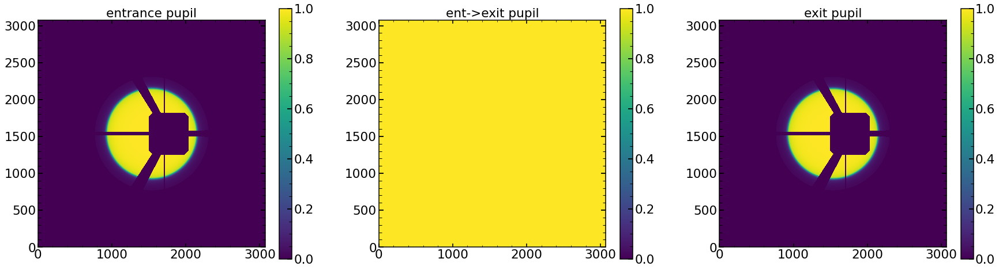

In [239]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(ilum,origin='lower',vmax=1,vmin=0)
plt.title('entrance pupil')
plt.colorbar()
plt.subplot(132)
plt.title('ent->exit pupil')
plt.imshow(radiometricEffectArray,origin='lower',vmax=1,vmin=0)

plt.colorbar()
plt.subplot(133)
plt.title('exit pupil')
plt.imshow(ilum_radiometric,origin='lower',vmax=1,vmin=0)
plt.colorbar()

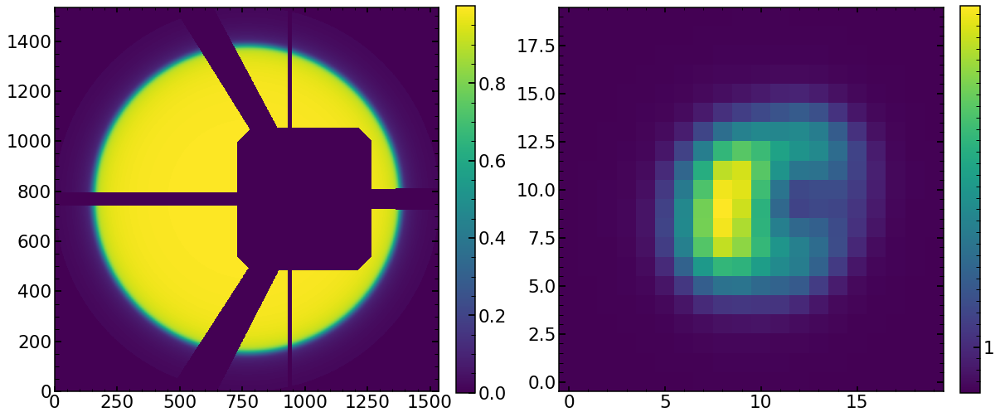

In [240]:
plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(pupililluminated,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)

plt.subplot(122)
plt.imshow(res_iapetus,origin='lower')
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10**-2,1,10,10**2,10**3,10**4,10**5])

# Images for Michael/poster

## good recent image 

In [169]:
import Zernike_Module
import Zernike_Analysis_Module
from Zernike_Module import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *


In [170]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jan2921/'

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Ar_from_Jan29=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Ne_from_Jan29=pickle.load(f)    
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Kr_from_Jan29=pickle.load(f)    

In [171]:
index_Ar=results_of_fit_many_Ar_from_Jan29['0'].index[np.log10(results_of_fit_many_Ar_from_Jan29['0']['chi2'].values/results_of_fit_many_Ar_from_Jan29['0']['chi2max'].values)==np.min(np.log10(results_of_fit_many_Ar_from_Jan29['0']['chi2'].values/results_of_fit_many_Ar_from_Jan29['0']['chi2max'].values))][0]
results_of_fit_many_Ar_from_Jan29['0'].loc[index_Ar]

z4             0.583624
z5             0.096308
z6             0.091398
z7             0.263171
z8             0.320398
               ...     
z54            0.001800
z55            0.005206
z56           -0.002941
chi2          25.140766
chi2max    26446.005859
Name: 17, Length: 78, dtype: float64

In [172]:
np.log10(results_of_fit_many_Ne_from_Jan29['0']['chi2'].values/results_of_fit_many_Ne_from_Jan29['0']['chi2max'].values)

array([-3.00806192, -2.66874003, -3.06738118, -3.10539325, -3.07116454,
       -2.47254036, -3.31791156, -2.77754443, -2.52807131, -2.89038856,
       -2.72517208, -2.74621489, -2.87233488, -2.55855649, -1.82500239,
       -2.69025609, -2.96441311, -2.70881825, -2.97735303, -2.38059773,
       -2.87933653, -2.93894102, -2.77901462, -2.86100907, -2.77652329,
       -3.11103935, -2.99384834, -2.92132949, -2.8154349 , -2.93036988,
       -2.40417206, -2.78181689, -2.84983238, -2.90295593, -2.37601667,
       -2.11284027, -2.8314205 , -2.86290834, -2.846861  , -2.95046778,
       -2.71094695, -3.07814674, -2.71701931, -2.9773274 , -2.83557419,
       -3.34638737, -2.97153558, -2.85914061, -2.96428887, -2.793518  ])

In [173]:
np.log10(results_of_fit_many_Kr_from_Jan29['0']['chi2'].values/results_of_fit_many_Kr_from_Jan29['0']['chi2max'].values)

array([-2.71640177, -2.6311193 , -2.60856308, -2.39812688, -2.61168323,
       -2.56562577, -2.64008286, -2.31350847, -2.56144452, -2.6611007 ,
       -2.5859382 , -2.31712543, -2.4566981 , -2.67333607, -2.67230274,
       -2.66437244, -2.37495001, -2.57205723, -2.24582693, -2.38324195,
       -2.62279973, -2.41937831, -2.62530361, -2.75398965, -2.49577041,
       -2.25643948, -2.58337808, -2.62238771, -2.34785296, -2.75781324,
       -2.66276193, -2.53174245, -2.2918885 , -2.45378403, -2.81628106])

In [174]:
finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

In [175]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='17'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                    63
xc                      463
yc                     1631
wavelength        763.74286
close                     1
lamp                     Ar
xc_effective            463
second_offset             0
second_ratio              0
second2_offset            0
second2_ratio             0
Name: 17, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: 0
self.single_number: 17
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34389
double_sources_positions_ratios for this spot is: [0.0 0.0]


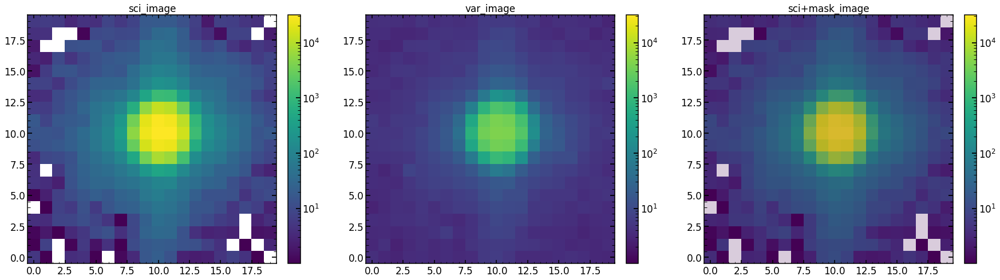

In [176]:
single_analysis=Zernike_Analysis(date=date,obs='0',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [177]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()

chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 4122.876157844915
average chi2 reduced is: 24.2922622090499


In [178]:
index_of_single_image=4

model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   

#list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)


model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

Science image shape is: (20, 20)
Top left pixel value of the science image is: 5.3227744
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.9924357
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.41e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [     0.58362374      0.09630755      0.09139815      0.26317125
      0.32039777     -0.03798492     -0.24393043     -0.26068724
     -0.12436885     -0.04368618      0.00261616      0.03377038
     -0.01841272      0.01998359      0.00523577      0.00619805
     -0.01447286      0.03254536      0.01453803      0.66804131
      0.08945204     -0.14769607      0.00216925      0.05676446
      0.03591548      0.1134056       0.08830516      0.
   

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.20524952 -4.70638058] / 8.980556
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.79475048 -9.20545244] / 14884.307
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.30524952 -5.15628775] / 85.79798
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.96700114 -4.82548018] / 15.207642
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.11161069 -4.75319032] / 10.235699
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.16416466 -4.72691875] / 9.345625
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.18644688 -4.71577994] / 9.111621
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.19648444 -4.7107622 ] / 9.034089
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.20112906 -4.70844037] / 9.004073
chi2 within shgo optimization routine (chi_2_almost_multi_val

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.998592479001673
Finished with lnlike_Neven
chi_2_almost/d.o.f is 23.298021; chi_2_almost_max_dof is 26474.604 log(improvment) is -3.0555105
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 5.09263014793396 seconds
 


In [27]:
sci_image=list_of_sci_images[index_of_single_image]
var_image=list_of_var_images[index_of_single_image]
res_iapetus=res_with_Image[1]



size=sci_image.shape[0]
#if size==40:
#    dithering=2
#else:
#    dithering=1
#dithering=1

if size==20:
    x_center=find_centroid_of_flux(res_iapetus)[0]
else:
    x_center=(size/2)

left_limit=np.round(x_center-3.5)+0.5
right_limit=np.round(x_center+3.5)-0.5               


plt.figure(figsize=(14,14))

<Figure size 1008x1008 with 0 Axes>

<Figure size 1008x1008 with 0 Axes>

In [28]:
init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image,var_image,res_iapetus)

x_center=find_centroid_of_flux(res_iapetus)[0]  
left_limit=np.int(x_center-3.5)
right_limit=np.int(x_center+3.5) 
multiplicative_factor_to_renormalize_to_50000=np.max(sci_image)/50000
sci_image_smaller=sci_image[:,left_limit:right_limit]/multiplicative_factor_to_renormalize_to_50000
var_image_smaller=var_image[:,left_limit:right_limit]/multiplicative_factor_to_renormalize_to_50000

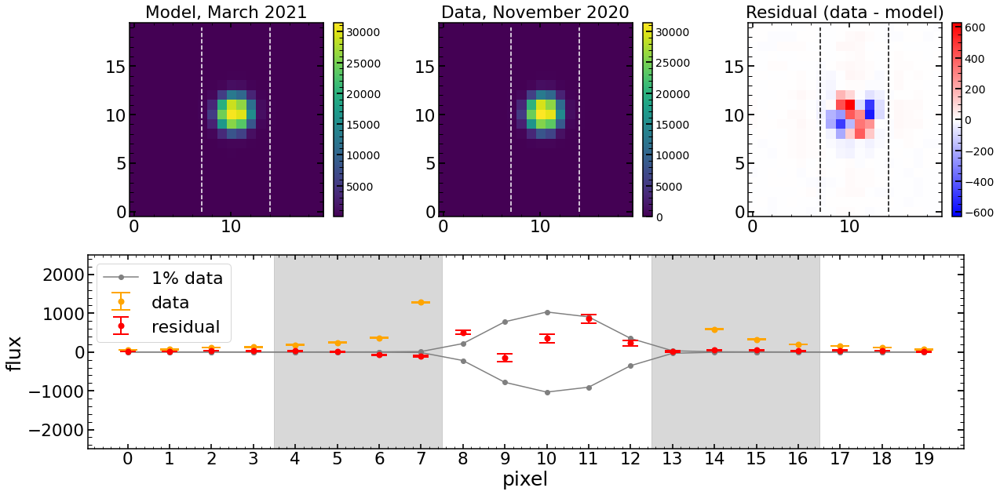

In [29]:
from matplotlib import gridspec
fig=plt.figure(figsize=(20,10))



ax1 = plt.subplot2grid((2, 3), (0, 0))
ax2 = plt.subplot2grid((2, 3), (0, 1))
ax3 = plt.subplot2grid((2, 3), (0, 2))
ax4 = plt.subplot2grid((2, 3), (1, 0), colspan=3)


im1=ax1.imshow(res_iapetus,origin='lower',vmax=np.max(np.abs(sci_image)))
ax1.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='white')
ax1.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='white')
cb=fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)
ax1.set_title('Model, March 2021')
#ax1.grid(False)



im2=ax2.imshow(sci_image,origin='lower',vmax=np.max(np.abs(sci_image)))
ax2.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='white')
ax2.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='white')
cb=fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)
ax2.set_title('Data, November 2020')
ax2.grid(False)


im3=ax3.imshow(sci_image-res_iapetus,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image))/50,vmax=np.max(np.abs(sci_image))/50)
ax3.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='black')
ax3.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='black')
ax3.set_title('Residual (data - model)')
cb=fig.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)

ax4.errorbar(np.array(range(len(init_lamda))),init_lamda,yerr=std_init_lamda,fmt='o',elinewidth=2,capsize=12,markeredgewidth=2,label='data',color='orange')
ax4.plot(np.array(range(len(init_lamda))),init_lamda*0.01,color='gray',label='1% data',marker='o')
ax4.plot(np.array(range(len(init_lamda))),-init_lamda*0.01,color='gray',marker='o')    
plt.errorbar(np.array(range(len(init_removal_lamda))),init_removal_lamda,yerr=std_init_removal_lamda,color='red',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='residual')

ax4.set_ylim(-2500,2500)
ax4.set_ylabel('flux',size=25)
ax4.set_xlabel('pixel',size=25)
ax4.set_xticks(range(20))
position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
difference_from_max=range(20)-position_of_max_flux
pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
plt.axvspan(pixels_to_test[0]-0.5, pixels_to_test[3]+0.5, alpha=0.3, color='grey')
plt.axvspan(pixels_to_test[4]-0.5, pixels_to_test[7]+0.5, alpha=0.3, color='grey')
plt.legend(loc=2, fontsize=22)

## good recent in defocus 

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 17
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]


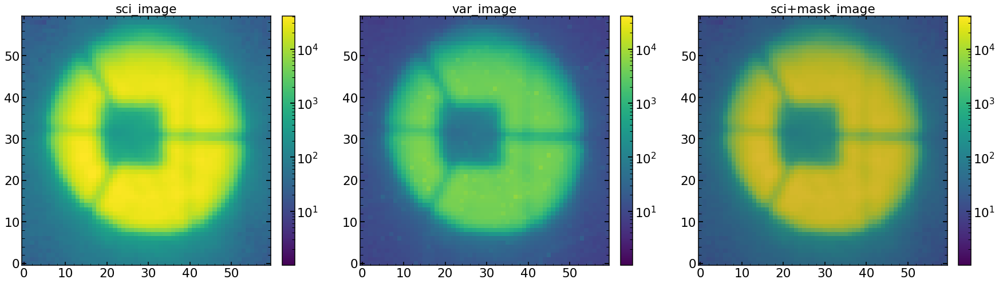

In [21]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
sci_image,var_image,mask_image=single_analysis.create_basic_data_image(return_Images=True)

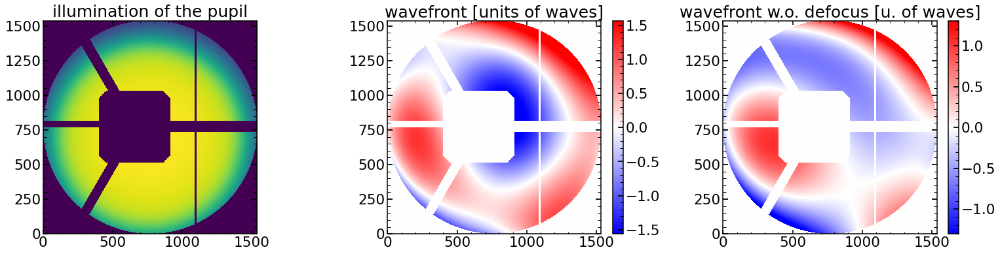

In [22]:
ilum_zoom,wavefront_zoom,wavefront_0_zoom  = single_analysis.illumination_wavefront_plot(return_Images=True)

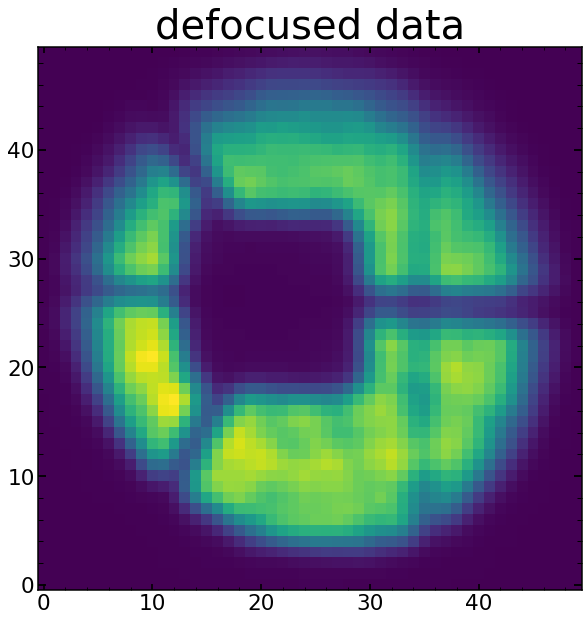

In [23]:
plt.figure(figsize=(10,10))
plt.title('defocused data',fontsize=40)
plt.imshow(sci_image[5:55,5:55],origin='lower',vmin=1,vmax=np.max(sci_image))

([], <a list of 0 Text major ticklabel objects>)

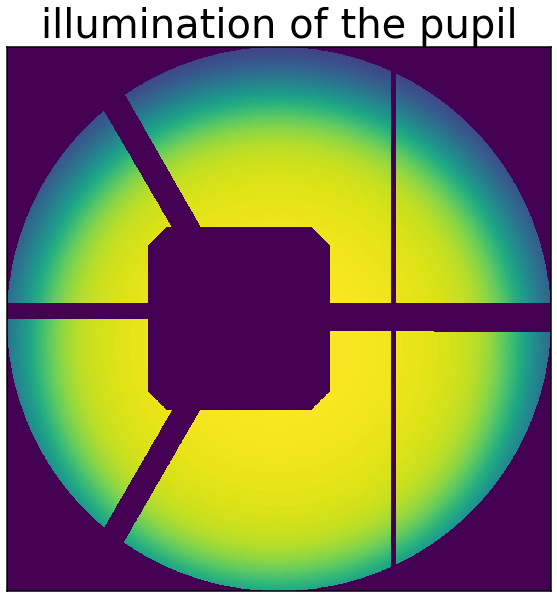

In [24]:
plt.figure(figsize=(10,10))
plt.imshow(ilum_zoom,origin='lower',vmax=1,vmin=0)
plt.title('illumination of the pupil',fontsize=40)
plt.xticks([])
plt.yticks([])

([], <a list of 0 Text major ticklabel objects>)

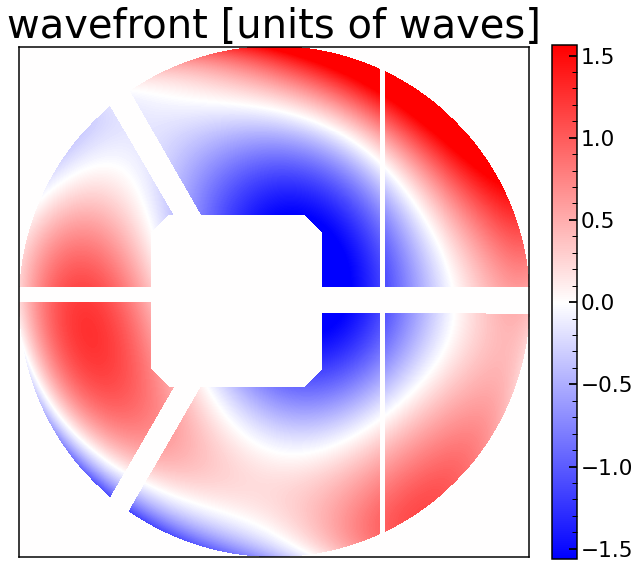

In [25]:
plt.figure(figsize=(10,10))
plt.imshow(wavefront_zoom,origin='lower',cmap=plt.get_cmap('bwr'),vmax=np.max(np.abs(wavefront_zoom))*0.75,vmin=-np.max(np.abs(wavefront_zoom))*0.75)

plt.colorbar(fraction=0.046, pad=0.04)
plt.title('wavefront [units of waves]',fontsize=40)
plt.xticks([])
plt.yticks([])

In [ ]:
,return_Images=False

## Mar 06

In [12]:
import Zernike_Module_v028
import Zernike_Analysis_Module_022b
from Zernike_Module_v028 import *
from Residual_1D_module import * 
from Zernike_Analysis_Module_022b import *


In [13]:
sci_image_old =np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/sci2140017HgAr_Stacked.npy')
mask_image_old =np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/mask2140017HgAr_Stacked.npy')
var_image_old =np.load('/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/var2140017HgAr_Stacked.npy')

In [14]:
with open('/Users/nevencaplar/Documents/PFS/Fit_Results/Apr15_Focus/' + 'results_of_fit_many_direct_HgAr_from_Apr15.pkl', 'rb') as f:
    results_of_fit_many_direct_HgAr_from_Apr1520=pickle.load(f)

NameError: name 'pickle' is not defined

In [15]:
results_of_fit_many_direct_HgAr_from_Apr1520.loc[17]

NameError: name 'results_of_fit_many_direct_HgAr_from_Apr1520' is not defined

In [131]:
minchain=results_of_fit_many_direct_HgAr_from_Apr1520.loc[17].values[:-2]
minchain

array([    0.46899423,     0.04517438,     0.05840604,     0.31828815,
           0.35576521,    -0.01927996,    -0.27101619,    -0.23279941,
          -0.1362587 ,    -0.03562265,     0.01158498,     0.0240104 ,
          -0.01938301,     0.02229256,    -0.00209219,    -0.00587332,
          -0.0242157 ,     0.03498719,     0.0278716 ,     0.67830432,
           0.08879704,    -0.15143947,     0.0098843 ,     0.05526952,
           0.04301217,     0.0000172 ,     0.0000172 ,     0.97608598,
           0.94835579,     0.0045966 ,    -0.07158372,     0.92811379,
           0.07822675,     0.73715088,     1.00114411,     0.5091121 ,
       52199.86717144,     2.19374285,     0.00179639,     0.35000173,
           1.82131383,     0.99829198])

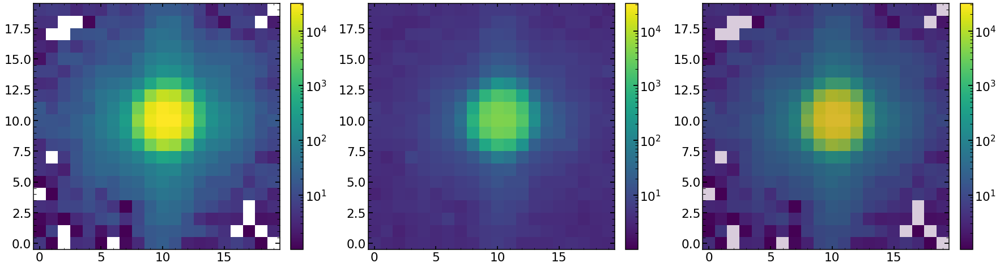

In [132]:
plt.figure(figsize=(30,8))
plt.subplot(131)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(132)
plt.imshow(var_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(133)
plt.imshow(sci_image,norm=LogNorm(),origin='lower',vmin=1,vmax=np.max(sci_image))
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.imshow(mask_image,origin='lower',vmin=0,vmax=np.max(mask_image),alpha=0.2)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])
#cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [133]:
model = LN_PFS_single(sci_image,var_image,mask_image=mask_image,dithering=1,save=1,zmax=22,verbosity=1,\
                      double_sources=None,double_sources_positions_ratios=[0,0],npix=1536,simulation_00=0)   
#minchain_new=np.copy(minchain)   
#minchain_new[0]=10
#minchain_new[1]=5

model(minchain)

npix_value:1536
Science image shape is: (20, 20)
Top left pixel value of the science image is: 5.3227744
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.9924357
Mask image shape is: (20, 20)
Sum of mask image is: 0.0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 22

Entering lnlike_Neven
allparameters [    0.46899423     0.04517438     0.05840604     0.31828815
     0.35576521    -0.01927996    -0.27101619    -0.23279941
    -0.1362587     -0.03562265     0.01158498     0.0240104
    -0.01938301     0.02229256    -0.00209219    -0.00587332
    -0.0242157      0.03498719     0.0278716      0.67830432
     0.08879704    -0.15143947     0.0098843      0.05526952
     0.04301217     0.0000172      0.0000172      0.97608598
     0.94835579     0.0045966     -0.07158372     0.92811379
     0.07822675     0.73715088     1.00114411  

-4633.744183951676

In [134]:
pupililluminated=np.load(TESTING_PUPIL_IMAGES_FOLDER+'pupil.illuminated.npy')
ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum.npy')
r_ilum=np.load(TESTING_PUPIL_IMAGES_FOLDER+'r_ilum.npy')
radiometricEffectArray=np.load(TESTING_PUPIL_IMAGES_FOLDER+'radiometricEffectArray.npy')
ilum_radiometric=np.load(TESTING_PUPIL_IMAGES_FOLDER+'ilum_radiometric.npy')

wf=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf.npy') 
wf_full=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_full.npy') 
u_manual=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'u_manual.npy')
wf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'wf_grid.npy')   
expwf_grid=np.load(TESTING_WAVEFRONT_IMAGES_FOLDER+'expwf_grid.npy')      

optPsf=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf.npy')
optPsf_cut=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut.npy')
optPsf_cut_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled.npy')
scattered_light=np.load(TESTING_FINAL_IMAGES_FOLDER+'scattered_light.npy')
optPsf_cut_downsampled_scattered=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_downsampled_scattered.npy')
optPsf_cut_fiber_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved.npy')
optPsf_cut_pixel_response_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_pixel_response_convolved.npy')
optPsf_cut_grating_convolved=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved.npy')
optPsf_cut_fiber_convolved_downsampled=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_fiber_convolved_downsampled.npy')
res_iapetus=optPsf_cut_fiber_convolved_downsampled


#optPsf_cut_grating_convolved_simulation_cut=np.load(TESTING_FINAL_IMAGES_FOLDER+'optPsf_cut_grating_convolved_simulation_cut.npy')
#res_iapetus=optPsf_cut_grating_convolved_simulation_cut

In [135]:
minchain

array([    0.46899423,     0.04517438,     0.05840604,     0.31828815,
           0.35576521,    -0.01927996,    -0.27101619,    -0.23279941,
          -0.1362587 ,    -0.03562265,     0.01158498,     0.0240104 ,
          -0.01938301,     0.02229256,    -0.00209219,    -0.00587332,
          -0.0242157 ,     0.03498719,     0.0278716 ,     0.67830432,
           0.08879704,    -0.15143947,     0.0098843 ,     0.05526952,
           0.04301217,     0.0000172 ,     0.0000172 ,     0.97608598,
           0.94835579,     0.0045966 ,    -0.07158372,     0.92811379,
           0.07822675,     0.73715088,     1.00114411,     0.5091121 ,
       52199.86717144,     2.19374285,     0.00179639,     0.35000173,
           1.82131383,     0.99829198])

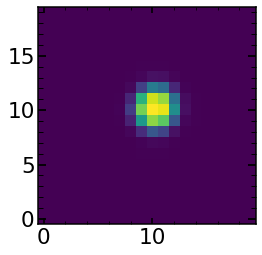

In [136]:
plt.imshow(res_iapetus)

In [137]:
init_lamda,std_init_lamda,init_removal_lamda,std_init_removal_lamda=residual_1D(sci_image,var_image,res_iapetus)

x_center=find_centroid_of_flux(res_iapetus)[0]  
left_limit=np.int(x_center-3.5)
right_limit=np.int(x_center+3.5) 
multiplicative_factor_to_renormalize_to_50000=np.max(sci_image)/50000
sci_image_smaller=sci_image[:,left_limit:right_limit]/multiplicative_factor_to_renormalize_to_50000
var_image_smaller=var_image[:,left_limit:right_limit]/multiplicative_factor_to_renormalize_to_50000

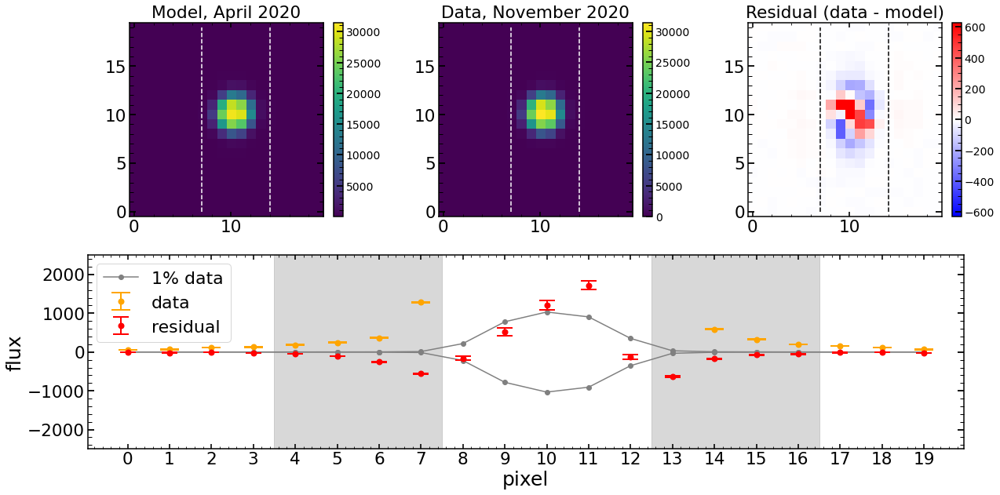

In [138]:


from matplotlib import gridspec
fig=plt.figure(figsize=(20,10))



ax1 = plt.subplot2grid((2, 3), (0, 0))
ax2 = plt.subplot2grid((2, 3), (0, 1))
ax3 = plt.subplot2grid((2, 3), (0, 2))
ax4 = plt.subplot2grid((2, 3), (1, 0), colspan=3)


im1=ax1.imshow(res_iapetus,origin='lower',vmax=np.max(np.abs(sci_image)))
ax1.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='white')
ax1.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='white')
cb=fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)
ax1.set_title('Model, April 2020')
#ax1.grid(False)



im2=ax2.imshow(sci_image,origin='lower',vmax=np.max(np.abs(sci_image)))
ax2.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='white')
ax2.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='white')
cb=fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)
ax2.set_title('Data, November 2020')
ax2.grid(False)


im3=ax3.imshow(sci_image-res_iapetus,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image))/50,vmax=np.max(np.abs(sci_image))/50)
ax3.plot(np.ones(len(sci_image))*(left_limit+1),np.array(range(len(sci_image))),'--',color='black')
ax3.plot(np.ones(len(sci_image))*(right_limit+1),np.array(range(len(sci_image))),'--',color='black')
ax3.set_title('Residual (data - model)')
cb=fig.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04) 
cb.ax.tick_params(labelsize=14)

ax4.errorbar(np.array(range(len(init_lamda))),init_lamda,yerr=std_init_lamda,fmt='o',elinewidth=2,capsize=12,markeredgewidth=2,label='data',color='orange')
ax4.plot(np.array(range(len(init_lamda))),init_lamda*0.01,color='gray',label='1% data',marker='o')
ax4.plot(np.array(range(len(init_lamda))),-init_lamda*0.01,color='gray',marker='o')    
plt.errorbar(np.array(range(len(init_removal_lamda))),init_removal_lamda,yerr=std_init_removal_lamda,color='red',fmt='o',elinewidth=2,capsize=10,markeredgewidth=2,label='residual')

ax4.set_ylim(-2500,2500)
ax4.set_ylabel('flux',size=25)
ax4.set_xlabel('pixel',size=25)
ax4.set_xticks(range(20))
position_of_max_flux=np.where(init_lamda==np.max(init_lamda))[0][0]
difference_from_max=range(20)-position_of_max_flux
pixels_to_test=np.array(range(20))[(np.abs(difference_from_max)>2)&(np.abs(difference_from_max)<=6)]
plt.axvspan(pixels_to_test[0]-0.5, pixels_to_test[3]+0.5, alpha=0.3, color='grey')
plt.axvspan(pixels_to_test[4]-0.5, pixels_to_test[7]+0.5, alpha=0.3, color='grey')
plt.legend(loc=2, fontsize=22)

# poor results in red part of the detector - initial

In [ ]:
################################
Likelihoods returned per individual images are: [-86573.0390625  -43154.76953125 -14508.265625    -6258.16503906
  -2567.50537109  -6046.69189453 -40179.984375   -62832.9609375
 -85816.03125   ]
Mean likelihood is -38659.712565104164
################################
Renormalized likelihoods returned per individual images are: [-1436.03061805  -907.25693449  -409.26378577 -2604.44751977
 -2567.50537109 -3167.99729147 -1339.69326885 -1586.52086481
 -1676.59361709]
Renormalization factors are: [60.28634625 47.56620522 35.44966872  2.40287623  1.          1.90867963
 29.99192823 39.60424494 51.18475364]
Mean renormalized likelihood is -1743.9232523790238
array_of_psf_positions_output: [[ -9.28515283  -9.76126956]
 [ -5.30354758  -2.30427199]
 [ -1.56061473 -12.83151944]
 [  1.2281891   -3.08969462]
 [ -3.53079547  -4.77720202]
 [  0.31123736   3.12647859]
 [  3.13017795  -3.56910715]
 [  7.28607041   4.12405647]
 [  2.37247796  -6.59694915]]
    
    
################################
Likelihoods returned per individual images are: [-101865.796875    -48690.83984375  -15585.49609375   -6253.45898438
   -2575.41796875   -5282.85986328  -38641.69921875  -60384.0703125
  -83345.046875  ]
Mean likelihood is -40291.63178168403
################################
Renormalized likelihoods returned per individual images are: [-1689.69929701 -1023.64356418  -439.65138903 -2602.48901079
 -2575.41796875 -2767.80858526 -1288.40329695 -1524.6868208
 -1628.31782794]
Renormalization factors are: [60.28634625 47.56620522 35.44966872  2.40287623  1.          1.90867963
 29.99192823 39.60424494 51.18475364]
Mean renormalized likelihood is -1726.6797511906932
array_of_psf_positions_output: [[-10.66927255  -9.70450184]
 [ -6.53838697  -2.20832579]
 [ -2.6444103  -12.7382704 ]
 [  0.99999226  -2.98600595]
 [ -3.53090569  -4.78929412]
 [  0.70474709   2.88182048]
 [  4.11774419  -3.82597835]
 [  8.45946962   3.85244548]
 [  3.74328533  -6.88898143]]

In [181]:
from schwimmbad import MultiPool
#import mpi4py
from functools import partial

In [183]:
def f(x,y):
    return x+y

In [225]:
from multiprocessing import Pool
pool=Pool(4)

def f(x,y):
    return x*y

In [228]:
# random values
array_x=np.array([1.23,234.43])
array_y=np.arange(0,3,1)

In [229]:
out1=map(partial(f,array_x),array_y)
out2=np.array(list(out1))

out2

array([[  0.  ,   0.  ],
       [  1.23, 234.43],
       [  2.46, 468.86]])

In [230]:
out1=pool.map(partial(f,array_x),array_y)
out2=np.array(list(out1))

KeyboardInterrupt: 

In [219]:
out1=map(partial(f,array_x),array_y)
out2=np.array(list(out1))

out2

array([[ 7.65,  7.65,  7.65,  7.65,  7.65,  7.65,  7.65,  7.65,  7.65,
         7.65],
       [ 8.65,  8.65,  8.65,  8.65,  8.65,  8.65,  8.65,  8.65,  8.65,
         8.65],
       [ 9.65,  9.65,  9.65,  9.65,  9.65,  9.65,  9.65,  9.65,  9.65,
         9.65],
       [10.65, 10.65, 10.65, 10.65, 10.65, 10.65, 10.65, 10.65, 10.65,
        10.65],
       [11.65, 11.65, 11.65, 11.65, 11.65, 11.65, 11.65, 11.65, 11.65,
        11.65],
       [12.65, 12.65, 12.65, 12.65, 12.65, 12.65, 12.65, 12.65, 12.65,
        12.65],
       [13.65, 13.65, 13.65, 13.65, 13.65, 13.65, 13.65, 13.65, 13.65,
        13.65],
       [14.65, 14.65, 14.65, 14.65, 14.65, 14.65, 14.65, 14.65, 14.65,
        14.65],
       [15.65, 15.65, 15.65, 15.65, 15.65, 15.65, 15.65, 15.65, 15.65,
        15.65],
       [16.65, 16.65, 16.65, 16.65, 16.65, 16.65, 16.65, 16.65, 16.65,
        16.65]])

# Testing 0.41 

In [7]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='11'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]


NameError: name 'finalAr' is not defined

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]


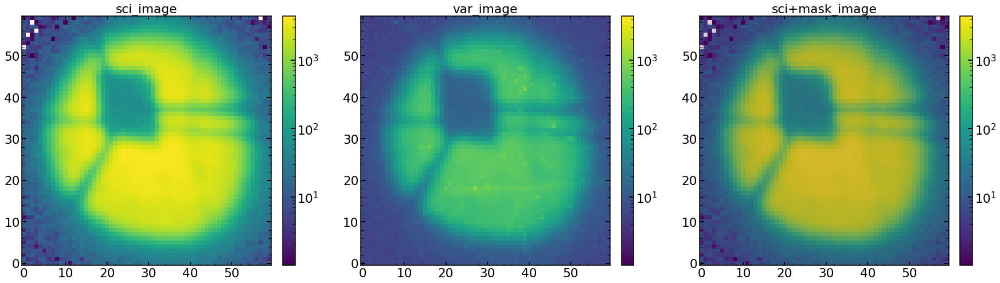

In [242]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [243]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()

chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1726.404694340507
average chi2 reduced is: 6.912630005411592


In [244]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   

#list_of_minchain=model_multi.create_list_of_allparameters(t1,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=['m4','p4'],zmax=56)

#list_of_minchain_changed=np.copy(list_of_minchain)
#for i in range(9):
#    list_of_minchain_changed[i][35]=-0.8

res_multi=model_multi(list_of_minchain,return_Images=True)


mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 11.366353
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 6.2264752
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.41
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   31.56312038    -2.88096594    -1.47991177    -0.28865244
     0.66206552    -0.48654684    -0.59783443     0.81060786
     0.05343278     0.19891624    -0.10302568    -0.02961167
     0.00181775     0.07589772     0.07340874    -0.04220434
    -0.082495      -0.01774715     0.14683251     0.70255835
     0.10599709    -0.21711041     0.27352715     0.0627802
     0.10376147     0.09

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.59186547  -9.23590242] / 74.43178
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.0034285   -9.74900811] / 75.18915
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.41499153 -9.44114469] / 79.41119
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.0034285   -9.23590242] / 75.91934
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.0034285   -9.64638697] / 75.18089
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.59186547  -9.64638697] / 73.64686
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.88608395  -9.85162924] / 73.85212
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.18030244  -9.23590242] / 75.397156
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.29764698  -9.54376583] / 74.18396
chi2 within shgo optimization routine (chi_2_al

We are fitting for only one source
One source fitting result is [-10.66927255  -9.70450184]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 1.039468765258789
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9963348306337698
Finished with lnlike_Neven
chi_2_almost/d.o.f is 129.77779; chi_2_almost_max_dof is 15660.25 log(improvment) is -2.0815983
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 12.119972944259644 seconds
 
##############

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.76534189 -2.17218773] / 65.969955
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.50513643 -2.20879763] / 65.7405
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.50513643 -2.30642405] / 65.78191
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.5701878  -2.18744185] / 65.74258
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.48345265 -2.15083195] / 65.76273
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.56476685 -2.22176364] / 65.739716
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.49971549 -2.24311942] / 65.74742
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.55256972 -2.20136125] / 65.73709
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-6.61220014 -2.21432725] / 65.76024
chi2 within shgo optimization routine (chi_2_almost_multi_value

Time to apodize the pupil: 0.14586687088012695
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3182368278503418
Time for pupil and illumination calculation is 0.3246736526489258

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 23.680604680844993, -2.388548017975702, -1.2456888713881011, -0.3023022002718412, 0.5985389748658869, -0.4759012944381177, -0.5933313464055954, 0.7438932736161812, 0.044790320862015724, 0.19980665672430448, -0.0890053438301967, -0.019152196432930247, 0.010564935647408222, 0.0668292011739714, 0.06305157737780874, -0.03976485735341798, -0.07167567674824891, -0.01026971346915292, 0.11939570806324319, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -2.388548017975702, -1.2456888713881011, -0.3023022002718412

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440497 -12.73826511] / 62.23587
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64441074 -12.73826824] / 62.23585
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440689 -12.73826615] / 62.23585
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440978 -12.73826772] / 62.23585
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440881 -12.7382672 ] / 62.23586
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64441052 -12.73826932] / 62.235855
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64441201 -12.73827252] / 62.23586
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64440961 -12.73826853] / 62.235855
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ -2.64441121 -12.73827119] / 62.23585
chi2 within shgo optimization routine (chi_2

Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 990
optPsf_cut.shape(991, 991)
oversampling:9.0
optPsf_cut.shape[0]991
size_of_optPsf_cut_downsampled: 252.0
optPsf_cut_downsampled.shape: (253, 253)
size_of_optPsf_cut_in_Microns: 421.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[25718.097651645247, 2.3157202948525044, 0.007171277681464721, 0.4893968824173391, 1.8421537702381563]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(253, 253)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source position/ratio is:[0 0]
Time for postprocessing up to single_Psf_position protocol is 0.11432480812072754
offset_initial_and_sci: [ 0.05911438 -0.30135926]
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.988902199570035
Finished with lnlike_Neven
chi_2_almost/d.o.f is 87.637184; chi_2_almost_max_dof is 6205.055 log(improvment) is -1.8500572
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 8.883414030075073 seconds
 
################################
analyzing image 5 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.7947999
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.0357723
Mask image shape is: (20, 20)
Sum of mask ima

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.25889272 -4.34022857] / 14.548615
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.34022858] / 14.548618
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33549428] / 14.5591545
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33788856] / 14.553802
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33907191] / 14.551174
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33965683] / 14.54988
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.33994595] / 14.549242
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.34008887] / 14.548925
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.2588927  -4.34015952] / 14.54877
chi2 within shgo optimization routine (chi_2_almost_mult

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9935987503343457
Finished with lnlike_Neven
chi_2_almost/d.o.f is 40.211834; chi_2_almost_max_dof is 2835.6274 log(improvment) is -1.8482953
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 9.105855941772461 seconds
 
################################
analyzing image 6 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: 1.330365
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 3.4698658
Mask image shape is: (20, 20)
Sum of mask ima

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-0.15960794  3.75373008] / 31.199614
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.04478088 3.41309155] / 28.62127
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.13774974 3.25814777] / 27.801722
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.18123176 3.18567976] / 27.504288
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.20186907 3.15128521] / 27.3823
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21173215 3.1348472 ] / 27.328354
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21646159 3.12696502] / 27.30349
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21873302 3.12317941] / 27.291782
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21873303 3.12317941] / 27.291782
chi2 within shgo optimization routine (chi_2_almost_multi_values): [0.21873

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9851461959459248
Finished with lnlike_Neven
chi_2_almost/d.o.f is 85.40188; chi_2_almost_max_dof is 4191.829 log(improvment) is -1.6909362
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 7.6507182121276855 seconds
 
################################
analyzing image 7 out of 9
 
Science image shape is: (50, 50)
Top left pixel value of the science image is: 5.400126
Variance image shape is: (50, 50)
Top left pixel value of the variance image is: 4.6791987
Mask image shape is: (50, 50)
Sum of mask imag

chi2 within shgo optimization routine (chi_2_almost_multi_values): [1.01730479 5.01429015] / 379.81146
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.82980479 -2.86070985] / 36.18595
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.82980481 -2.86070985] / 36.185944
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.82980479 -2.86070986] / 36.185947
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 12.82980477 -20.86070984] / 1912.2986
chi2 within shgo optimization routine (chi_2_almost_multi_values): [  7.56867774 -10.33845576] / 260.59036
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 5.59573554 -6.39257134] / 67.26576
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.6978509  -4.59680206] / 35.73941
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.26404599 -3.72919225] / 32.236332
chi2 within shgo optimization routine (chi_2_almost_mult

We are fitting for only one source
One source fitting result is [ 4.11774419 -3.82597835]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.6146252155303955
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9994290150896142
Finished with lnlike_Neven
chi_2_almost/d.o.f is 63.487057; chi_2_almost_max_dof is 11929.502 log(improvment) is -2.2739372
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 9.683540344238281 seconds
 
###############

chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.69075274 3.67242783] / 35.428047
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.91945676 3.74443622] / 35.889957
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.2333447  3.81644461] / 35.330143
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.00464068 3.96046138] / 35.87797
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.69075274 3.81644461] / 35.329937
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.91945676 3.888453  ] / 35.876785
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.2333447  3.96046138] / 35.354816
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.34769671 3.888453  ] / 35.193306
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.80510475 3.888453  ] / 35.56173
chi2 within shgo optimization routine (chi_2_almost_multi_values): [8.37628

Time to apodize the pupil: 0.14453387260437012
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.31746602058410645
Time for pupil and illumination calculation is 0.3228590488433838

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -31.497005217904274, 1.058377409406387, 0.3938714213454353, -0.39785053203295295, 0.15385319198203085, -0.4013824743245392, -0.5618097462457253, 0.27689116632300725, -0.01570688471914472, 0.20603958954962512, 0.0091369984224281, 0.05406414782615562, 0.07179520919398118, 0.0033495863851810484, -0.009448544415223324, -0.022688484366883477, 0.004059564761825535, 0.04207233355752953, -0.07266188235666081, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 1.058377409406387, 0.3938714213454353, -0.3978505320329

chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.33295829 -7.27166117] / 53.651093
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.33295829 -7.27166115] / 53.651093
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.5496062  -7.27166115] / 54.83324
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.33295829 -7.63524421] / 55.371136
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.5496062 -6.9080781] / 54.237484
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.33295829 -6.9080781 ] / 53.04059
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.22463433 -6.72628657] / 52.70512
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 4.00798641 -7.08986962] / 52.09269
chi2 within shgo optimization routine (chi_2_almost_multi_values): [ 3.73717652 -7.18076539] / 52.03886
chi2 within shgo optimization routine (chi_2_almost_multi_valu

We are fitting for only one source
One source fitting result is [ 3.74328533 -6.88898143]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.9348690509796143
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9977813985598092
Finished with lnlike_Neven
chi_2_almost/d.o.f is 97.456985; chi_2_almost_max_dof is 14060.782 log(improvment) is -2.1591966
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4490204608
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4490204608 is: 13.267203092575073 seconds
 
##############

In [246]:
array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(9):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                      np.median(sci_image),np.median(sci_image)])*3
            
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    print(var_image_masked_without_nan.shape)
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print(array_of_var_sum)
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
quantile_08_focus

(2167,)
(1717,)
(1279,)
(92,)
(39,)
(74,)
(1072,)
(1405,)
(1805,)
[-7342.97558594 -5793.64160156 -4317.82763672  -292.67425537
  -121.80163574  -232.4803009  -3653.06591797 -4823.86181641
 -6234.38671875]


16.822856903076207

-1718.3758898492897
array_of_single_res: [-101093.0234375   -48532.5         -15557.74804688   -6305.91699219
   -2576.58276367   -5170.67382812  -38501.94921875  -60096.5703125
  -82827.8125    ]
renormalization factors: [60.28634625 47.56620522 35.44966872  2.40287623  1.          1.90867963
 29.99192823 39.60424494 51.18475364]


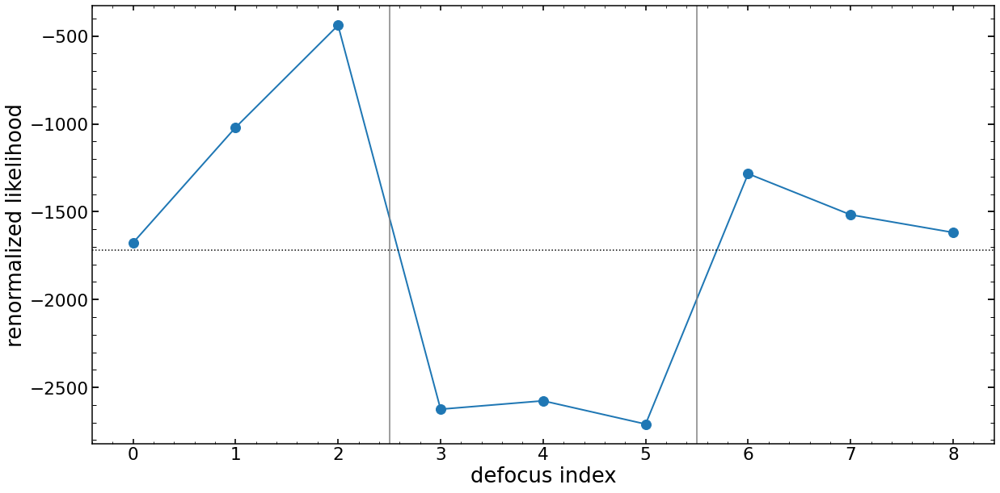

In [247]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)

mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print(mean_res_of_multi_same_spot)
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.axvline(2.5,color='gray')

plt.axvline(5.5,color='gray')

## Testing 0.41 via script 

In [251]:
finalAr_Feb2020_dataset=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe_Feb2020_dataset=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr_Feb2020_dataset=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

In [252]:
date='Mar06'

list_of_Ar_to_analyze=[2,11,17]

for single_spot in list_of_Ar_to_analyze:
    if str(finalAr_Feb2020_dataset.loc[single_spot]['close'])=='0' or str(finalAr_Feb2020_dataset.loc[single_spot]['close'])=='0.5':
        double_source=True
    else:
        double_source=False    
        
    file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/T_Ar_1_'+str(single_spot)+date+'.sh','w') 
    file.write("#!/bin/bash \n")
    file.write("#SBATCH --nodes=1 # node count \n")
    file.write("#SBATCH --ntasks-per-node=40 \n") 
    file.write("#SBATCH --time 19:55:59 \n")
    file.write("#SBATCH --mail-type=begin  \n")
    file.write("#SBATCH --mail-type=end   \n") 
    file.write("#SBATCH --mail-user=ncaplar@princeton.edu \n") 

    file.write("\n")
    file.write("#1. Observation (e.g., 8567) \n") 
    file.write("#2. Threads \n") 
    file.write("#3. Steps \n") 
    file.write("\n")
    # m4, m35, m3, p3, p35, p4
    file.write("python /home/ncaplar/Code/Zernike_parameter_estimation.py -obs 34341 34347 34353 34383 34389 34395 34425 34431 34437 -spot "+str(single_spot)+\
               " -nsteps 36 -eps 6 -dataset 6 -arc Ar -double_sources "+str(double_source)+\
               " -double_sources_positions_ratios "+remove(str(list(finalAr_Feb2020_dataset.loc[single_spot][['second_offset','second_ratio']].values)))+\
               " -twentytwo_or_extra 56 -date_of_input Jan0821 -direct_or_interpolation direct -date_of_output "+date+" -analysis_type defocus \n")
    file.close()    
  



file = open('/Users/nevencaplar/Documents/PFS/TigerAnalysis/ScriptsForTiger/'+date+'ScriptToSubmitScriptsTiger_Ar_1_'+'.sh','w')
file.write("#!/bin/bash \n")
file.write("\n")
for single_spot in list_of_Ar_to_analyze:
    file.write('sbatch /home/ncaplar/Scripts/T_Ar_1_'+str(single_spot)+date+'.sh \n')

file.close()

# Mar 06 2021

In [7]:
import glob

finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

def remove(string): 
    return string.replace(" ", "")

## which are avaliable 

In [8]:

date='Mar0621'

ResultsFromTiger_FOLDER='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'


Emcee3_HgAr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*HgArSwarm1.npy', recursive=True)

Emcee3_Ar=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*ArSwarm1.npy', recursive=True)
Emcee3_Ne=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*NeSwarm1.npy', recursive=True)
Emcee3_Kr=glob.glob(ResultsFromTiger_FOLDER+date+'/chain'+date+'_Single_P_*KrSwarm1.npy', recursive=True)


In [9]:
analyzed_Neon_images=[]
for i in range(len(Emcee3_Ne)):
    single_string=Emcee3_Ne[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ne[i])-13]
    analyzed_Neon_images.append([int(single_string[:5]),int(single_string[5:]),'Ne'])
   
analyzed_Neon_images=np.array(analyzed_Neon_images)
###########
analyzed_Ar_images=[]
for i in range(len(Emcee3_Ar)):
    single_string=Emcee3_Ar[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Ar[i])-13]
    analyzed_Ar_images.append([int(single_string[:5]),int(single_string[5:]),'Ar'])
 

analyzed_Ar_images=np.array(analyzed_Ar_images)
###########
analyzed_Kr_images=[]
for i in range(len(Emcee3_Kr)):
    single_string=Emcee3_Kr[i][len(ResultsFromTiger_FOLDER)+30:len(Emcee3_Kr[i])-13]
    analyzed_Kr_images.append([int(single_string[:5]),int(single_string[5:]),'Kr'])
    
analyzed_Kr_images=np.array(analyzed_Kr_images)

In [10]:
print(analyzed_Ar_images)
print(analyzed_Neon_images)
print(analyzed_Kr_images)

[['34437' '23' 'Ar']
 ['34437' '2' 'Ar']]
[]
[]


In [11]:
if len(analyzed_Ar_images)>0:
    arranged_by_defocus_Ar=analyzed_Ar_images[analyzed_Ar_images[:,0].argsort()]
    arranged_by_spot_number_Ar=analyzed_Ar_images[analyzed_Ar_images[:,1].argsort()]
else:
    arranged_by_defocus_Ar=[]
    arranged_by_spot_number_Ar=[]

if len(analyzed_Neon_images)>0:
    arranged_by_defocus_Ne=analyzed_Neon_images[analyzed_Neon_images[:,0].argsort()]
    arranged_by_spot_number_Ne=analyzed_Neon_images[analyzed_Neon_images[:,1].argsort()]
else:
    arranged_by_defocus_Ne=[]
    arranged_by_spot_number_Ne=[]

if len(analyzed_Kr_images)>0:
    arranged_by_defocus_Kr=analyzed_Kr_images[analyzed_Kr_images[:,0].argsort()]
    arranged_by_spot_number_Kr=analyzed_Kr_images[analyzed_Kr_images[:,1].argsort()]
else:
    arranged_by_defocus_Kr=[]
    arranged_by_spot_number_Kr=[]
    
print('analyzed_Ar_images:'+str(len(analyzed_Ar_images))+' / '+'analyzed_Ne_images:'+str(len(analyzed_Neon_images))+' / '+'analyzed_Kr_images:'+str(len(analyzed_Kr_images)))

analyzed_Ar_images:2 / analyzed_Ne_images:0 / analyzed_Kr_images:0


## single image analysis 

In [247]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='119'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                  650
xc                    4016
yc                    4044
wavelength        966.0642
close                    1
lamp                    Ar
xc_effective          4085
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 119, dtype: object

In [248]:
finalNe[finalNe['fiber']==650]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
81,650,4013,348,650.84186,0,Ne,4082,30.12,0.406,0,0
82,650,4013,379,653.4774,-1,Ne,4082,0,0,0,0
83,650,4012,455,660.0668,1,Ne,4081,0,0,0,0
84,650,4011,547,668.01764,0,Ne,4080,44.24,0.67,-29.97,0.003
85,650,4011,592,671.9268,-1,Ne,4080,0,0,0,0
86,650,4008,835,693.13116,1,Ne,4077,0,0,0,0
87,650,4007,1116,717.59015,1,Ne,4076,0,0,0,0
88,650,4006,1198,724.72437,1,Ne,4075,0,0,0,0
89,650,4005,1421,744.1276,0,Ne,4074,38.57,0.012,57.44,0.162


STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 119
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]


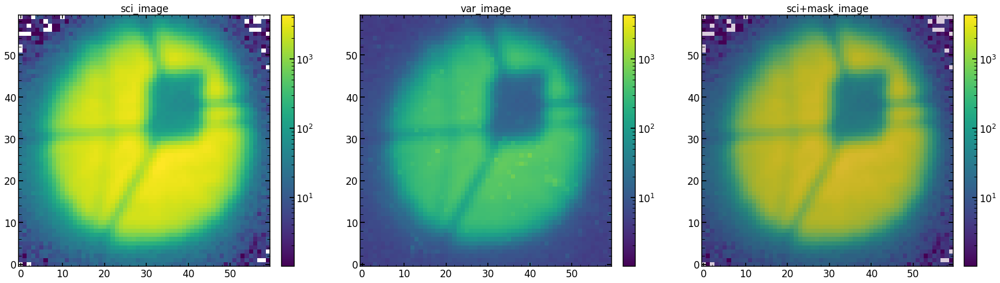

In [249]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [250]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()


chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371196ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371196ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371196ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1981.5236214123559
average chi2 reduced is: 8.862727017505014


### chain analysis 

In [918]:
minchain_parametrization

array([   -7.8825157 ,     0.03305758,     0.49241792,    -0.91129426,
           0.2342229 ,    -0.54302017,    -0.01364976,    -0.34325149,
          -0.06352654,     0.40795935,     0.01064555,    -0.44396466,
           0.00450309,    -0.57982209,    -0.06671459,     0.54374951,
          -0.00864246,     0.01886295,     0.00089042,     0.20247791,
           0.01402033,    -0.04694434,     0.01045948,     0.01222624,
           0.00874718,     0.03680648,    -0.00906852,     0.03962365,
          -0.01035716,     0.0319801 ,     0.00243948,    -0.03244641,
           0.01081932,    -0.03921772,     0.00747744,     0.01216259,
          -0.0274368 ,     0.03708531,     0.70255835,     0.10599709,
          -0.21711041,     0.27352715,     0.0627802 ,     0.10376147,
           0.09375901,     0.07524247,     0.        ,     0.61296491,
          -0.03620577,    -0.01351665,     0.89335116,     0.02591337,
           0.73920926,     1.04663307,     0.59825735, 25718.09765165,
      

In [919]:
gbest_filename='/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/'+date+'/chain'+date+'_Single_P_'+str(obs)+str(single_number)+str(dataset)+arc+'res_gbests_position.npy'
gbests_positions=np.load(gbest_filename)
print(gbest_filename)
print(gbests_positions.shape)
gbests_positions[0]

/Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116Arres_gbests_position.npy
(36, 129)


array([   -7.95137629,     0.07165237,     0.49164347,    -0.86077517,
           0.23048569,    -0.5045606 ,    -0.00103646,    -0.34871417,
          -0.06873405,     0.41356734,     0.01359331,    -0.44217477,
          -0.01649036,    -0.56975692,    -0.07573984,     0.55973222,
          -0.00824109,     0.02117111,    -0.00285157,     0.21307765,
           0.02258292,    -0.04505458,     0.00389182,     0.02773998,
           0.0129494 ,     0.04280962,    -0.0174756 ,     0.0455309 ,
          -0.00287843,     0.03550744,    -0.00052473,    -0.03300849,
           0.00549046,    -0.02717566,     0.00586427,     0.02386434,
          -0.03056621,     0.03898892,     0.70594866,     0.11041735,
          -0.21079921,     0.27340093,     0.06163019,     0.1029416 ,
           0.1       ,     0.1       ,     0.1       ,     1.        ,
          -0.02848173,    -0.01330549,     0.88540022,     0.02771489,
           0.7217169 ,     1.04756229,     0.60587698, 27402.65354784,
      

Text(0, 0.5, 'par_1')

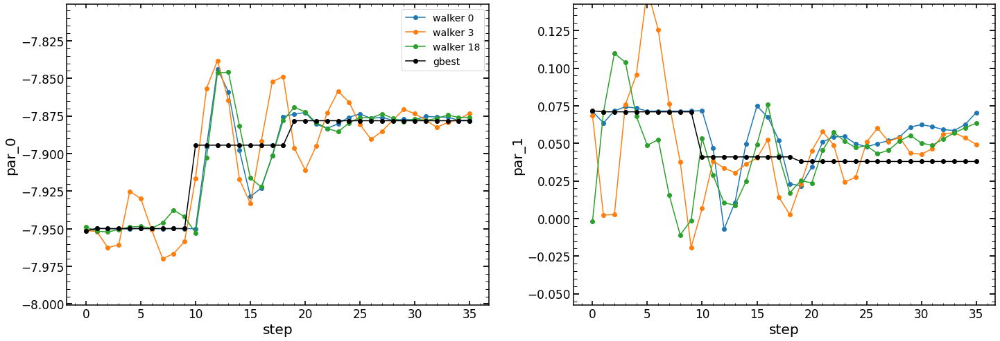

In [413]:
# wavefront paramter
plt.figure(figsize=(24,8))
i=0*2
plt.subplot(121)
# two different walkers, parameter 0
plt.plot(chain0_swarm_1[:,0][:,i],label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('step')
plt.ylabel('par_'+str((i)))
mean_one_walker=np.mean(chain0_swarm_1[:,18][:,i])
plt.ylim(mean_one_walker-0.1,mean_one_walker+0.1)
plt.legend()

plt.subplot(122)
#  paramter 2 (z5)

mean_one_what=np.mean(chain0_swarm_1[:,:,i+1][:,2])
plt.plot(chain0_swarm_1[:,:,i+1][:,0],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.ylim(mean_one_what-0.1,mean_one_what+0.1)
plt.xlabel('step')
plt.ylabel('par_'+str((i+1)))

Text(0.5, 1.0, 'par_46 / wide_43')

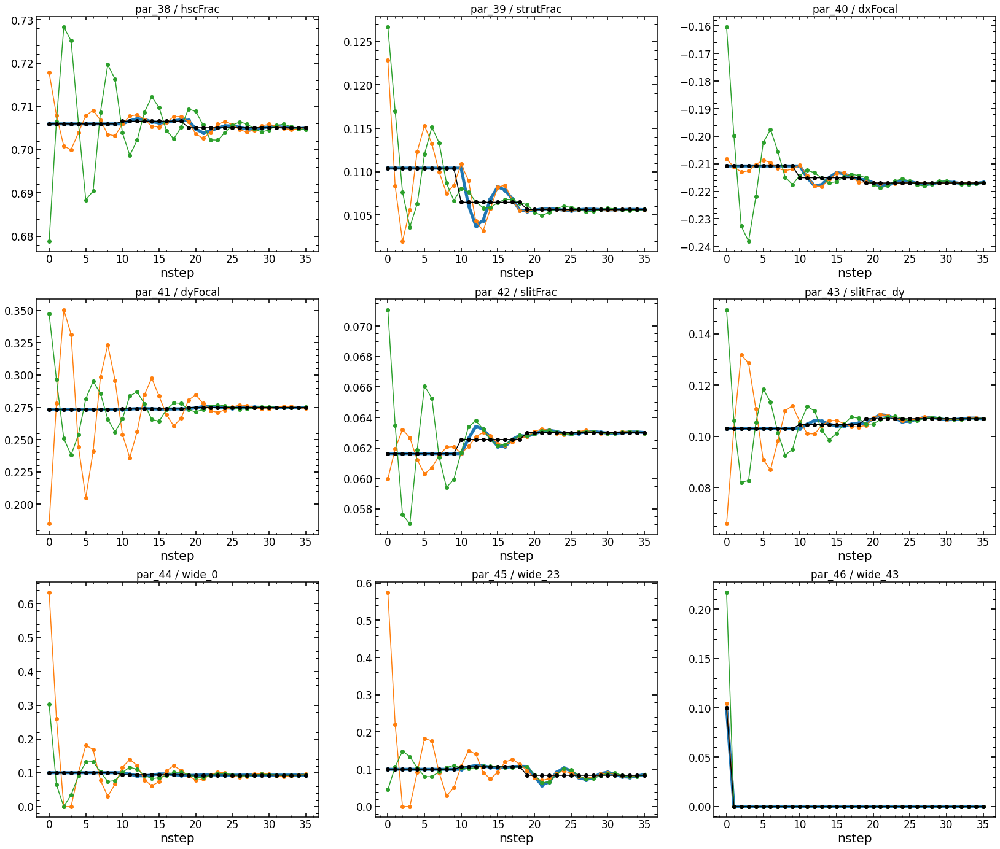

In [414]:
# pupil paramters
plt.figure(figsize=(28,24))
i=19*2
plt.subplot(331)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i))+' / '+columns22[19])

plt.subplot(332)
plt.plot(chain0_swarm_1[:,:,i+1][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+1][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+1],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+1))+' / '+columns22[20])

plt.subplot(333)
plt.plot(chain0_swarm_1[:,:,i+2][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+2][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+2],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+2))+' / '+columns22[21])



plt.subplot(334)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+3],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+3],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+3],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+3))+' / '+columns22[19+3])

plt.subplot(335)
plt.plot(chain0_swarm_1[:,:,i+4][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+4][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+4],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+4))+' / '+columns22[19+4])

plt.subplot(336)
plt.plot(chain0_swarm_1[:,:,i+5][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+5][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+5],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+5))+' / '+columns22[19+5])


plt.subplot(337)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+6],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+6],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+6],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+6],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+6))+' / '+columns22[19+6])

plt.subplot(338)
plt.plot(chain0_swarm_1[:,:,i+7][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+7][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+7],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+7))+' / '+columns22[19+7])

plt.subplot(339)
plt.plot(chain0_swarm_1[:,:,i+8][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+8][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+8],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+8))+' / '+columns22[19+8])

Text(0.5, 1.0, 'par_58 / pixel_effect')

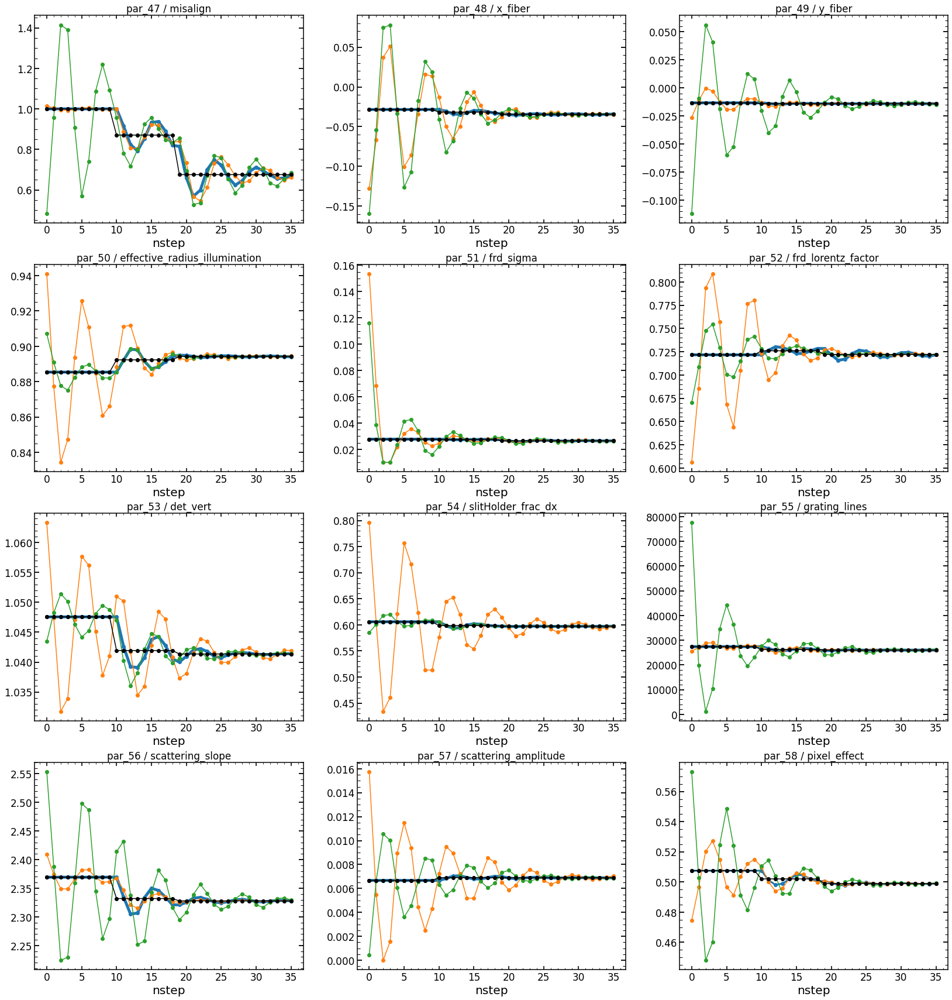

In [415]:
# pupil paramters
plt.figure(figsize=(28,30))
i=19*2
plt.subplot(431)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+9],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+9],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+9],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+9],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+9))+' / '+columns22[19+9])

plt.subplot(432)
plt.plot(chain0_swarm_1[:,:,i+10][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+10][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+10],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+10))+' / '+columns22[19+10])

plt.subplot(433)
plt.plot(chain0_swarm_1[:,:,i+11][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+11][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+11],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+11))+' / '+columns22[19+11])



plt.subplot(434)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+12],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+12],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+12],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+12],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+12))+' / '+columns22[19+12])

plt.subplot(435)
plt.plot(chain0_swarm_1[:,:,i+13][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+13][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+13],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+13))+' / '+columns22[19+13])

plt.subplot(436)
plt.plot(chain0_swarm_1[:,:,i+14][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+14][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+14],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+14))+' / '+columns22[19+14])


plt.subplot(437)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+15],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+15],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+15],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+15],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+15))+' / '+columns22[19+15])

plt.subplot(438)
plt.plot(chain0_swarm_1[:,:,i+16][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+16][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+16],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+16))+' / '+columns22[19+16])

plt.subplot(439)
plt.plot(chain0_swarm_1[:,:,i+17][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+17][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+17],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+17))+' / '+columns22[19+17])


plt.subplot(4,3,10)
#plt.plot(chain0_swarm_1[:,:,i][:,2])
plt.plot(chain0_swarm_1[:,0][:,i+18],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,3][:,i+18],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,18][:,i+18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+18],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+18))+' / '+columns22[19+18])

plt.subplot(4,3,11)
plt.plot(chain0_swarm_1[:,:,i+19][:,0],lw=5,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+19][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+19],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+19))+' / '+columns22[19+19])

plt.subplot(4,3,12)
plt.plot(chain0_swarm_1[:,:,i+20][:,0],lw=3,label='walker 0',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,3],label='walker 3',marker='o')
plt.plot(chain0_swarm_1[:,:,i+20][:,18],label='walker 18',marker='o')
plt.plot(gbests_positions[:,i+20],label='gbest',color='black',marker='o')
plt.xlabel('nstep')
plt.title('par_'+str((i+20))+' / '+columns22[19+20])

Text(0, 0.5, 'std. devation of a single parameter 38')

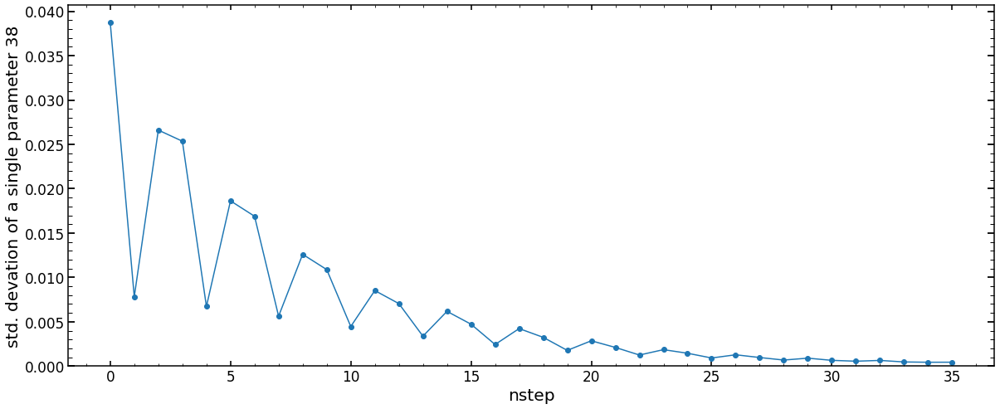

In [416]:
list_of_std=[]
i=19*2+0
for j in range(len(chain0_swarm_1)):
    list_of_std.append(np.std(chain0_swarm_1[:,:,i][j]))

plt.figure(figsize=(20,8))
plt.plot(list_of_std,marker='o')
plt.ylim(0)
plt.xlabel('nstep')
plt.ylabel('std. devation of a single parameter '+str(i))

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1726.404694340507
average chi2 reduced is: 6.912630005411592
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)


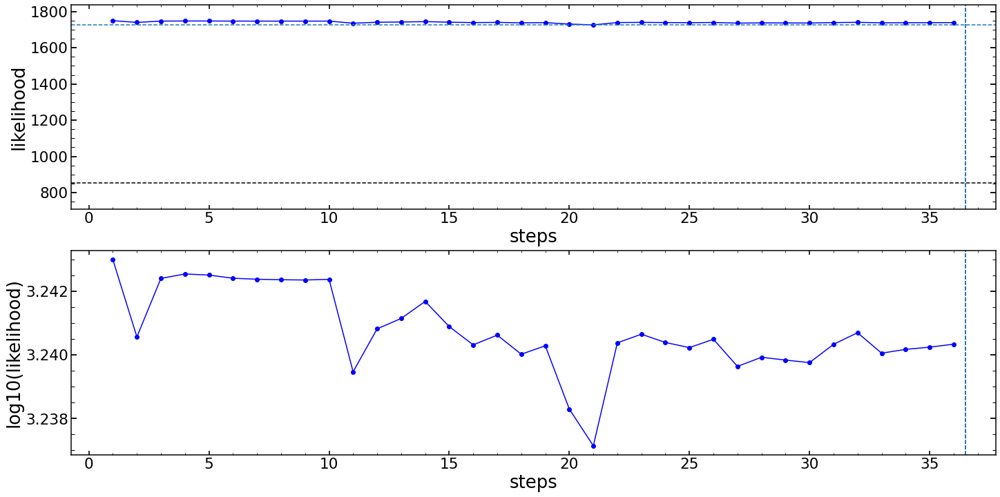

In [417]:
single_analysis.create_fitting_evolution_plot()

### image analysis 

In [300]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   


minchain_parametrization_test=np.copy(minchain_parametrization)

minchain_parametrization_test[19*2+0]=0.1

# wide_0
minchain_parametrization_test[19*2+6]=0.8

# wide_23
minchain_parametrization_test[19*2+7]=0.8

# wide_43
minchain_parametrization_test[19*2+8]=0.8

list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



res_multi=model_multi(list_of_minchain,return_Images=True,use_only_chi=True)


mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: -1.2420654
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.1640754
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   29.74273227     2.31221901    -1.82351203     0.20205529
    -0.84529032    -0.36049509    -0.36582658     0.46670238
     0.10112426    -0.23414431    -0.0098286     -0.0643177
     0.0022484     -0.04609765     0.00288289    -0.01337049
    -0.0353203     -0.00136168     0.13788407     0.72547713
     0.08910374     0.23045141     0.24154012     0.06149683
     0.03917138     0.

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.63436116 -20.77057644] / 113.64322
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.63436118 -20.77057644] / 113.64321
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.63436116 -20.77057646] / 113.64323
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-25.38436116   1.72942356] / 1950.3518
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-21.64065844 -10.74958553] / 392.0857
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-20.07727441 -15.96086562] / 146.25945
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.34854151 -18.38997529] / 106.578835
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.9930505  -19.57494532] / 104.37042
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.81582019 -20.16571302] / 107.500206
chi2 within shgo optimization routin

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46395275 -19.38456833] / 103.32839
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46374464 -19.38445445] / 103.328384
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46366193 -19.38447845] / 103.328415
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46388005 -19.38454586] / 103.3284
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46380734 -19.38452339] / 103.3284
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.4638487  -19.38451139] / 103.3284
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46370328 -19.38446645] / 103.328384
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46364058 -19.3843975 ] / 103.3284
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.46376565 -19.38449192] / 103.32839
chi2 within shgo optimization routine 

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0004711151123046875
type(expwf_grid)<class 'numpy.complex64'>
Time for FFT is 0.31939268112182617
type(img_apod)<class 'numpy.float32'>
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 2476
optPsf_cut.shape(2477, 2477)
oversampling:9.0
optPsf_cut.shape[0]2477
size_of_optPsf_cut_downsampled: 630.0
optPsf_cut_downsampled.shape: (631, 631)
size_of_optPsf_cut_in_Microns: 1051.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[31491.319103780606, 2.5338778284167627, 0.020340693333323338, 0.3983322828870916, 1.9159880266231033]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(631, 631)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source positi

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.6867707  -10.50460484] / 91.86258
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68704056 -10.50489701] / 91.86257
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68722573 -10.50471357] / 91.862564
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68714105 -10.50423796] / 91.86257
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68706568 -10.50473224] / 91.86259
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.6870908  -10.50456748] / 91.862595
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68699821 -10.5046592 ] / 91.86259
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68686329 -10.50451312] / 91.862564
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.68682094 -10.50427532] / 91.86258
chi2 within shgo optimization routine (chi_

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.00046825408935546875
type(expwf_grid)<class 'numpy.complex64'>
Time for FFT is 0.32968783378601074
type(img_apod)<class 'numpy.float32'>
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 1980
optPsf_cut.shape(1981, 1981)
oversampling:9.0
optPsf_cut.shape[0]1981
size_of_optPsf_cut_downsampled: 504.0
optPsf_cut_downsampled.shape: (505, 505)
size_of_optPsf_cut_in_Microns: 841.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[31491.319103780606, 2.5338778284167627, 0.020340693333323338, 0.3983322828870916, 1.9159880266231033]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(505, 505)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source positi

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.3380564  -10.39442838] / 81.25874
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33869061 -10.39870933] / 81.2587
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.34060192 -10.40125531] / 81.25876
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33829315 -10.39732085] / 81.25871
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33906274 -10.39863233] / 81.258705
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33847921 -10.39728235] / 81.25868
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33885133 -10.39720535] / 81.25871
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33900989 -10.39827559] / 81.258705
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.33895704 -10.39791884] / 81.25869
chi2 within shgo optimization routine (chi_2_

Time for postprocessing pupil after _get_Pupil 0.295421838760376
Time for pupil and illumination calculation is 0.301314115524292

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 3.4598971232636786, 0.5666567064970605, -0.6000072430124905, -0.04293122573406439, -0.697173841393982, -0.35943723317198495, -0.2372225169352881, 0.45068729312712197, 0.01806217954540002, -0.19164531428485063, 0.011519013574246232, -0.013431376765617151, -0.03827412952503249, 0.00568052495167047, 0.0034599309186156995, -0.02254937335485067, -0.026762989493265388, 0.03569131847498579, 0.02937124947104165, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.5666567064970605, -0.6000072430124905, -0.04293122573406439, -0.697173841393982, -0.35943723317198495, -0.2372225169352881, 0, 0.01806217954540002, -0.1916

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86833357 -1.61455487] / 38.677723
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86842856 -1.61455487] / 38.67712
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86847491 -1.61455487] / 38.676823
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86849751 -1.61455487] / 38.676693
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86850857 -1.61455487] / 38.676613
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86851394 -1.61455487] / 38.676594
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86851659 -1.61455487] / 38.67657
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-8.86851659 -1.61455487] / 38.67657
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-9.31194242 -1.61455487] / 37.671642
chi2 within shgo optimization routine (chi_2_almost_multi_

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.98
Finished with lnlike_Neven
chi_2_almost/d.o.f is 7.5338717; chi_2_almost_max_dof is 63.81823 log(improvment) is -0.92792654
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4588561856
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4588561856 is: 5.287858009338379 seconds
 
################################
analyzing image 5 out of 9
 
Science image shape is: (20, 20)
Top left pixel value of the science image is: -1.2332155
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 2.7660823
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dit

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.61652961 -2.18919245] / 14.374517
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.74946633 -2.35366546] / 14.679914
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.93074367 -2.31396508] / 15.063031
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.47755032 -2.05024112] / 14.358193
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.45338001 -2.15232781] / 14.350049
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.35972005 -2.18493884] / 14.459836
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.31440071 -2.01337648] / 14.521358
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.54099739 -2.14523846] / 14.33123
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-4.51682708 -2.24732515] / 14.386275
chi2 within shgo optimization routine (chi_2_almost_mult

Time to apodize the pupil: 0.14677095413208008
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3070230484008789
Time for pupil and illumination calculation is 0.3131899833679199

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -4.049484347535929, 0.06792462088346449, -0.25043444713164, -0.11292737294444732, -0.6548548482520183, -0.35913498734078564, -0.20047849803083698, 0.44611155393528146, -0.005669844182075884, -0.17950274298818616, 0.017618331338024963, 0.0011075732971812012, -0.049851994867565246, 0.02047428780834984, 0.0036247990377624418, -0.025171911375423062, -0.02431804436636651, 0.04627788901397233, -0.001632412773823002, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, 0.06792462088346449, -0.25043444713164, -0.1129

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9936209341981748
Finished with lnlike_Neven
chi_2_almost/d.o.f is 6.0057626; chi_2_almost_max_dof is 54.04161 log(improvment) is -0.95416015
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4588561856
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4588561856 is: 4.784574031829834 seconds
 
################################
analyzing image 7 out of 9
 
Science image shape is: (50, 50)
Top left pixel value of the science image is: 7.8886113
Variance image shape is: (50, 50)
Top left pixel value of the variance image is: 4.6383033
Mask image shape is: (50, 50)
Sum of mask im

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.42717423   8.05450257] / 38.654835
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.556715     7.85467556] / 38.932693
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.4136804    8.14520274] / 38.650414
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.34531166   8.15748718] / 38.672558
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.38286949   8.12866992] / 38.6509
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.36937566   8.21937009] / 38.69729
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.41272459   8.09571945] / 38.645218
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.4435355    8.11225227] / 38.647564
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.44257969   8.06276898] / 38.65274
chi2 within shgo optimization routine (ch

Time for postprocessing pupil after _get_Pupil 0.2889268398284912
Time for pupil and illumination calculation is 0.295482873916626

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -26.577628759934747, -1.4282716359573233, 0.7982839405109118, -0.3229158145755961, -0.5278978688261274, -0.35822824984718776, -0.0902464413174836, 0.4323843363597599, -0.0768659153645036, -0.1430750290981927, 0.03591628462936116, 0.04472442348557626, -0.08458559089516353, 0.06485557637838796, 0.004119403395202667, -0.033039525437140234, -0.016983208985669886, 0.07803760063093194, -0.09464339950841696, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -1.4282716359573233, 0.7982839405109118, -0.3229158145755961, -0.5278978688261274, -0.35822824984718776, -0.0902464413174836, 0, -0.0768659153645036, -0.143075

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09894372   8.32936336] / 45.199783
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09181179   8.32981882] / 45.199715
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09656641   8.32951518] / 45.199722
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09300045   8.32974291] / 45.1997
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09459481   8.3334979 ] / 45.199734
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09369264   8.3292166 ] / 45.199696
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09170681   8.32741501] / 45.19975
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09416642   8.33051212] / 45.199696
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.09485861   8.32998582] / 45.199696
chi2 within shgo optimization routine (c

Time to apodize the pupil: 0.1307389736175537
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.28481221199035645
Time for pupil and illumination calculation is 0.29082274436950684

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, -30.332319495334552, -1.6776376787641216, 0.9730703384513372, -0.35791388818078756, -0.5067383722551456, -0.3580771269315881, -0.07187443186525805, 0.43009646676383967, -0.08873192722824155, -0.13700374344986044, 0.03896594351125053, 0.05199389851697543, -0.09037452356642992, 0.07225245780672764, 0.004201837454776038, -0.03435079444742643, -0.015760736422220444, 0.08333088590042521, -0.11014523063084927, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -1.6776376787641216, 0.9730703384513372, -0.35791388

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96307248   7.99695224] / 67.81551
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.98283951   7.98257584] / 67.8181
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96275048   8.004543  ] / 67.81551
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.95000179   8.00400626] / 67.81661
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96936633   7.9991183 ] / 67.81518
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96968833   7.99152755] / 67.816025
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96448494   8.00128914] / 67.81523
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.97077879   8.0034552 ] / 67.81538
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-16.96885221   8.00182946] / 67.815216
chi2 within shgo optimization routine (chi_2_

In [287]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    single_var_image_via_model=create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])
    
    list_of_var_images_via_model.append(single_var_image_via_model)

In [288]:
array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(9):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                      np.median(sci_image),np.median(sci_image)])*3
            
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print(array_of_var_sum)
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than?: '+str(quantile_08_focus)

number of pixels considering in image 0: 2148
number of pixels considering in image 1: 1699
number of pixels considering in image 2: 1297
number of pixels considering in image 3: 95
number of pixels considering in image 4: 40
number of pixels considering in image 5: 75
number of pixels considering in image 6: 1067
number of pixels considering in image 7: 1403
number of pixels considering in image 8: 1801
[-7280.07128906 -5743.08642578 -4374.61181641  -300.61663818
  -123.89323425  -234.15167236 -3633.33886719 -4806.38867188
 -6195.32226562]


'model pixels with a flux larger than?: 16.203581237792992'

mean reported value:-417.2957704978512
array_of_single_res: [-17893.9765625  -11455.06445312  -5923.68847656  -1294.18017578
   -929.47454834  -1083.22631836  -9437.546875   -13834.03808594
 -16094.45898438]
renormalization factors: [58.76084625 46.35512553 35.30952955  2.42641691  1.          1.88994721
 29.32637031 38.79460167 50.00533163]


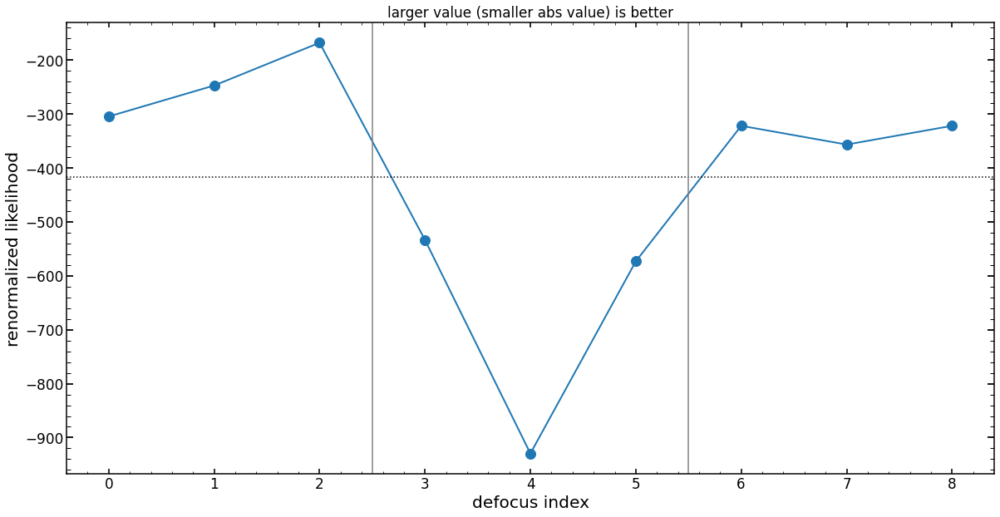

In [301]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)

mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.axvline(2.5,color='gray')
plt.title('larger value (smaller abs value) is better')
plt.axvline(5.5,color='gray')

In [302]:
minchain=list_of_minchain[4]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
         z4        z5        z6        z7        z8        z9       z10  \
0 -0.294794  0.317291 -0.425221 -0.077929 -0.676014 -0.359286 -0.218851   

        z11  
0  0.448399  
##############################################
        z12       z13       z14       z15       z16       z17       z18  \
0  0.006196 -0.185574  0.014569 -0.006162 -0.044063  0.013077  0.003542   

        z19       z20       z21       z22  
0 -0.023861 -0.025541  0.040985  0.013869  

##############################################
    hscFrac  strutFrac   dxFocal  dyFocal  slitFrac  slitFrac_dy
0  0.725477   0.089104  0.230451  0.24154  0.061497     0.039171
##############################################
     wide_0   wide_23  wide_43  misalign
0  0.078229  0.107669      0.0  1.415279
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0  0.003031 -0.069748                       0.943632   0.020626   

   frd_lorentz_factor  
0

(-2.8, -1.5)

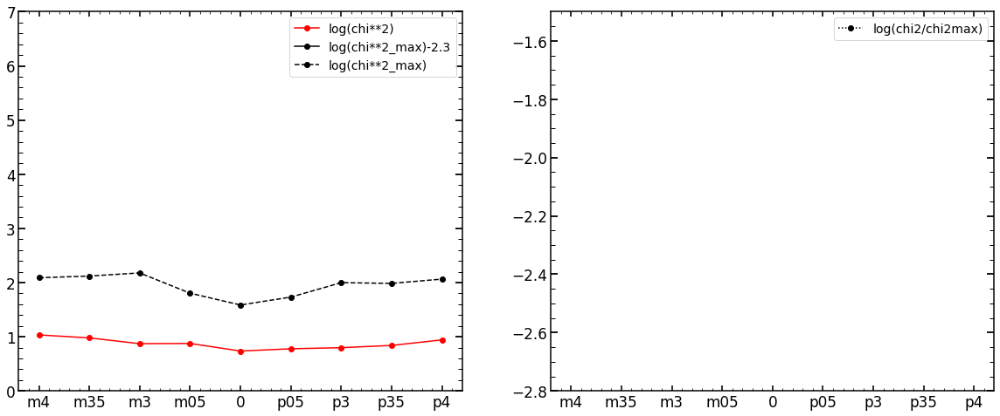

In [303]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi**2)',marker='o')
plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi**2_max)',marker='o',ls='--')
plt.ylim(0,7)
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi2/chi2max)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.ylim(-2.8,-1.5)

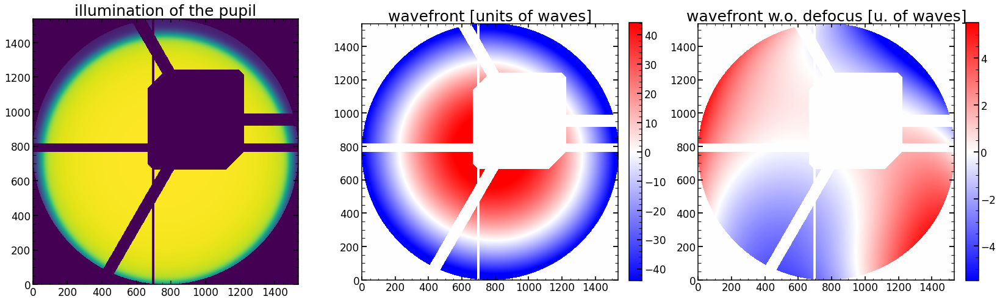

In [304]:
single_analysis.illumination_wavefront_plot()

Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.0201311
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.29175
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
chi**2 max reduced is: 6308.0635
chi**2 reduced is: 67.78379 for log improvment: -1.9687701
---------------------
chi**2 reduced within mask area is: 67.78379
---------------------
chi**2 max reduced within flux mask area is: 14805.327
chi**2 reduced within flux mask area is: 124.66955 for log improvment: -2.0746577
---------------------
Abs of residual divided by total flux is: 0.077401906
Abs of residual divided by largest value of a flux in the image is: 0.20341961


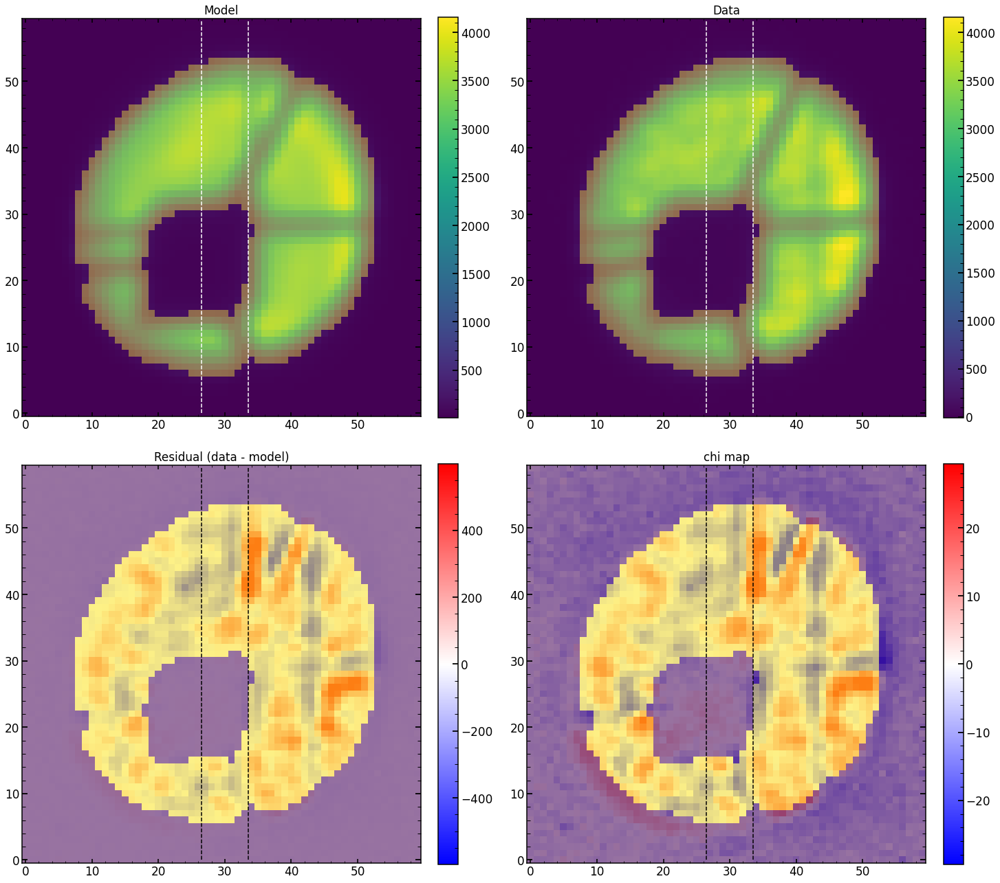

In [305]:
index_of_single_image=8

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

# I can move to use custom_var within the analysis
#single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
#                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=custom_var,\
#                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=False)

array_of_sci_image=np.array(list_of_sci_images)
array_of_single_model_image=np.array(list_of_single_model_image)
array_of_var_images=np.array(list_of_var_images)
array_of_mask_images=np.array(list_of_mask_images)

np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number),array_of_sci_image)
np.save('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number),array_of_sci_image)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.0201311
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.29175
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
fraction of chi2 due to 1% of pixels: 0.092375
chi**2 max reduced is: 6308.0635
chi**2 reduced is: 67.78379 for log improvment: -1.9687701
---------------------
chi**2 reduced within mask area is: 67.78379
---------------------
chi**2 max reduced within flux mask area is: 14805.327
chi**2 reduced within flux mask area is: 124.66955 for log improvment: -2.0746577
---------------------
Abs of residual divided by total flux is: 0.077401906
Abs of residual divided by largest value of a fl

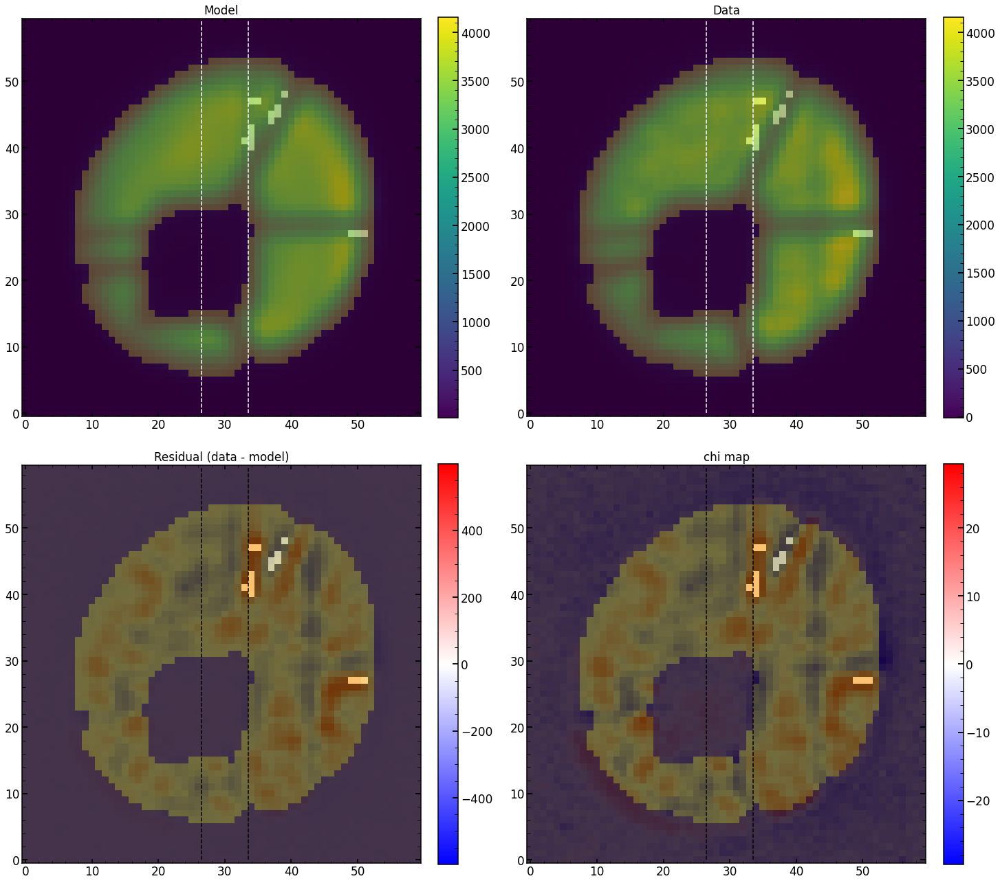

In [306]:

model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.0201311
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.29175
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.44a
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56
chi**2 max reduced is: 6308.0635
chi**2 reduced is: 67.78379 for log improvment: -1.9687701
---------------------
chi**2 reduced within mask area is: 67.78379
---------------------
chi**2 max reduced within flux mask area is: 14805.327
chi**2 reduced within flux mask area is: 124.66955 for log improvment: -2.0746577
---------------------
Abs of residual divided by total flux is: 0.077401906
Abs of residual divided by largest value of a flux in the image is: 0.20341961


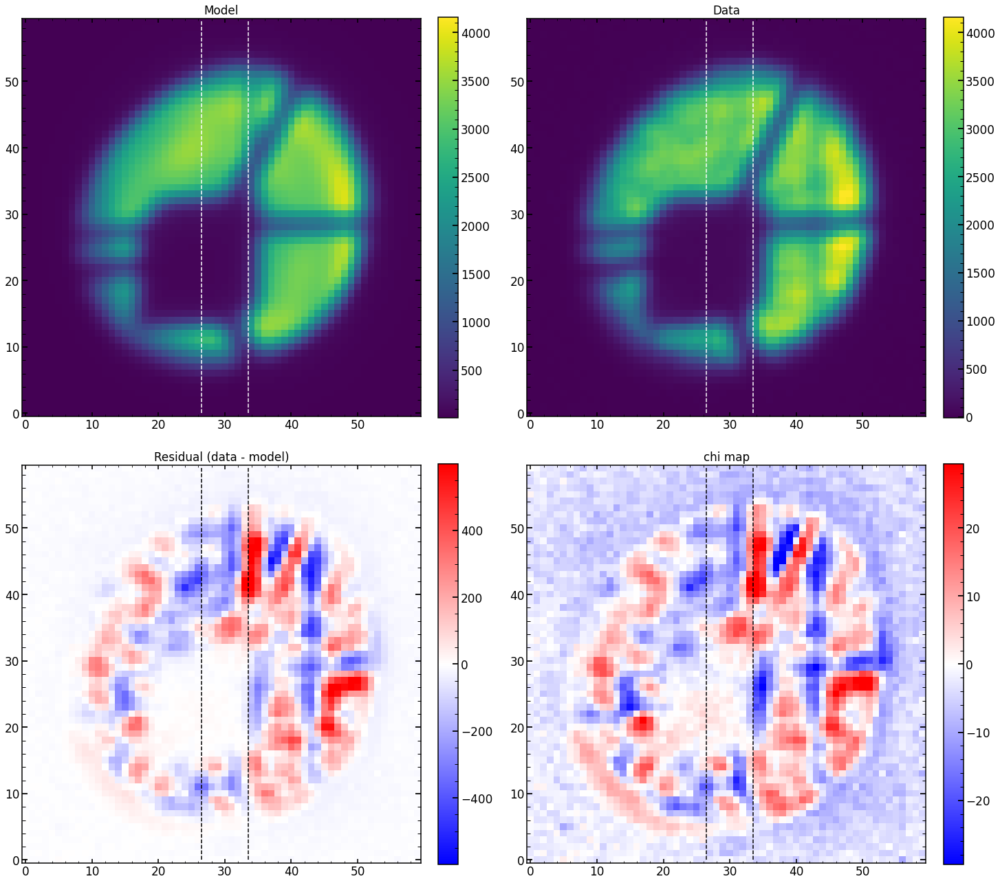

In [307]:
#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])

matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=False)

chi**2 max reduced is: 6308.0635
chi**2 reduced is: 67.78379
Abs of residual divided by total flux is: 0.077401906
Abs of residual divided by largest value of a flux in the image is: 0.20341961


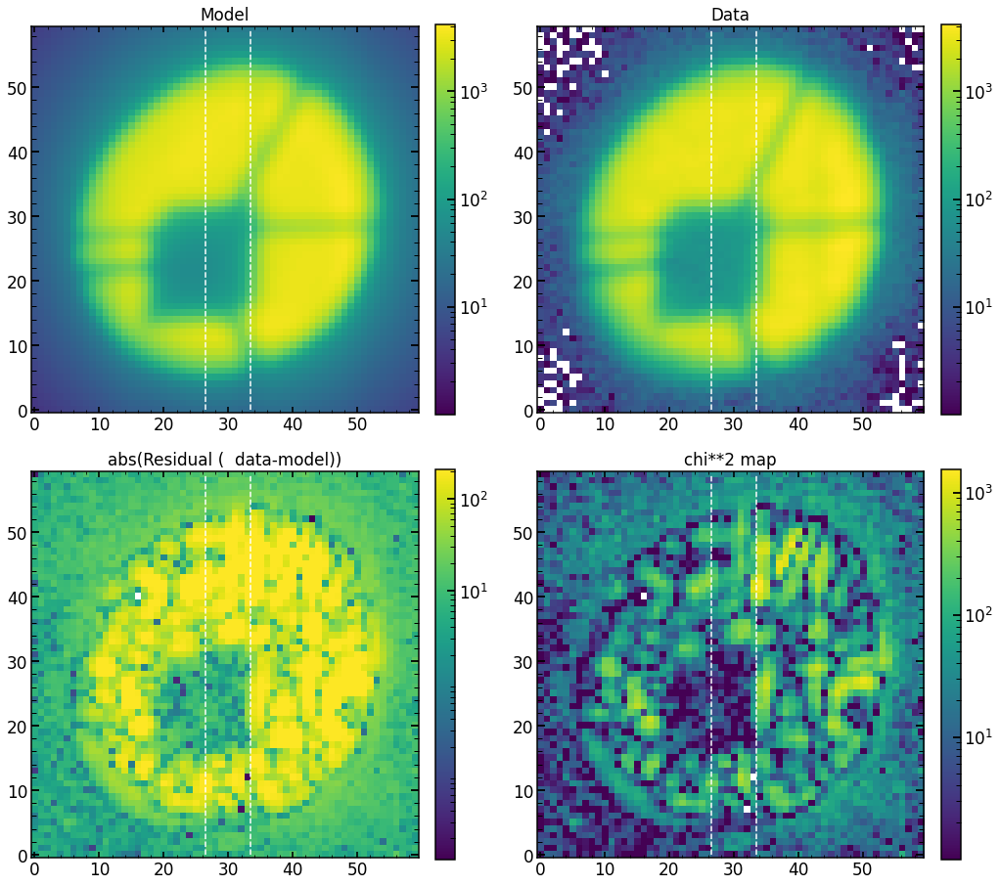

In [308]:
single_analysis.create_basic_comparison_plot_log(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                                show_flux_mask=False)

109.10449
chi**2 reduced is: 109.10449
Abs of residual divided by total flux is: 0.09662823
Abs of residual divided by largest value of a flux in the image is: 0.20047155


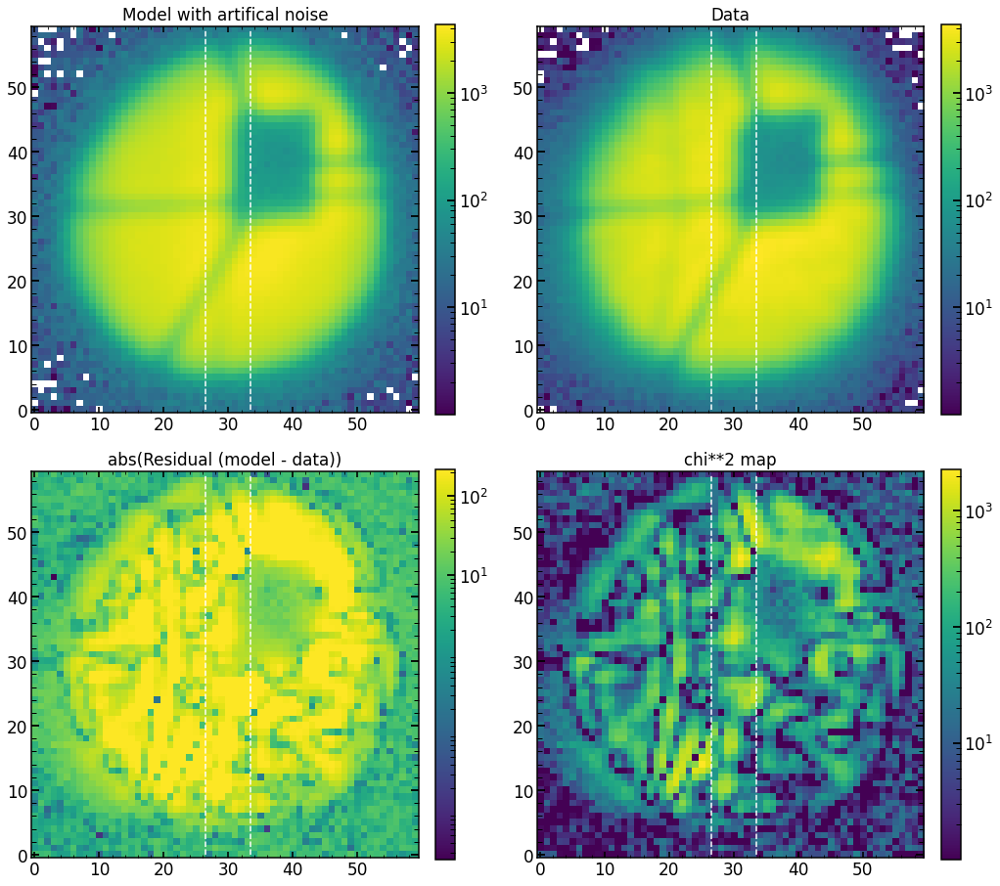

In [177]:
single_analysis.create_basic_comparison_plot_log_artifical(custom_model_image=list_of_single_model_image[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image])

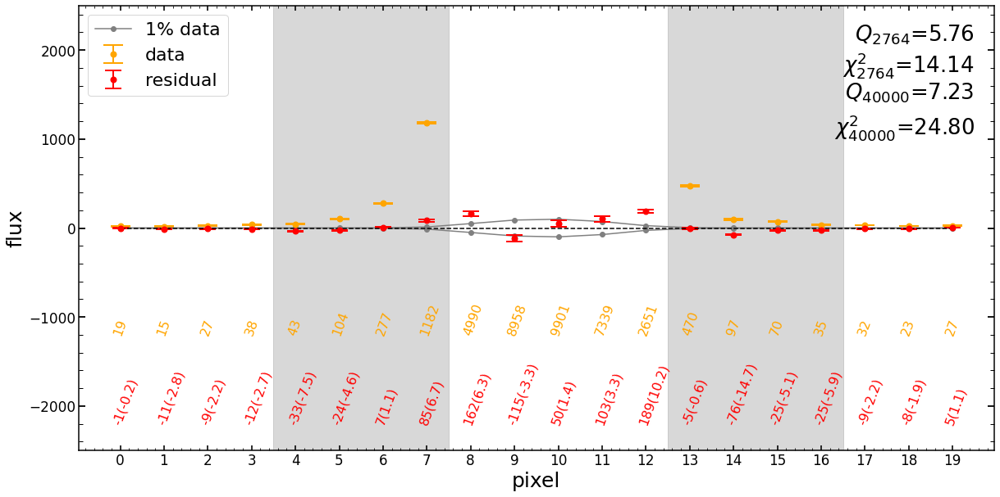

In [178]:
index_of_single_image=4
plot_1D_residual(sci_image=list_of_sci_images[index_of_single_image],var_image=list_of_var_images[index_of_single_image],model_image=list_of_single_model_image[index_of_single_image])

In [ ]:
res_iapetus=list_of_single_model_image[index_of_single_image]
sci_image=list_of_sci_images[index_of_single_image]
var_image=list_of_var_images[index_of_single_image]

chi2_image=(sci_image-res_iapetus)**2/((1)*var_image)

mask_most_impactful_pixels=np.zeros(sci_image.shape)
mask_most_impactful_pixels[chi2_image>(np.quantile(chi2_image.ravel(),0.99))]=1

In [ ]:
plt.figure(figsize=(20,10))
plt.imshow(chi2_image)


In [131]:
        mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                              np.median(sci_image),np.median(sci_image)])*3
            
        flux_mask=sci_image>(mean_value_of_background)
chi2_image>(np.quantile(chi2_image[flux_mask].ravel(),0.99))

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [134]:
np.sum(chi2_image[flux_mask].ravel()[chi2_image[flux_mask].ravel()>np.quantile(chi2_image[flux_mask].ravel(),0.99)])

12321.467

In [135]:
np.sum(chi2_image[flux_mask].ravel())

102803.06

In [103]:
camY_Max=0.02
camX_value_for_f_multiplier, camY_value_for_f_multiplier= (-0.015080353984103227, 0.01899902572893377)
(np.abs(camX_value_for_f_multiplier)*100/3)*(np.abs(camY_value_for_f_multiplier)/camY_Max)+1

1.477520055575677

# PIPE2D - 694

In [9]:
import Zernike_Module
import Zernike_Analysis_Module
from Zernike_Module import *
from Residual_1D_module import * 
from Zernike_Analysis_Module import *


In [10]:
DATAFRAMES_FOLDER='/Users/nevencaplar/Documents/PFS/Fit_Results/Jan2921/'

with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ar_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Ar_from_Jan29=pickle.load(f)
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Ne_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Ne_from_Jan29=pickle.load(f)    
with open(DATAFRAMES_FOLDER + 'results_of_fit_many_direct_Kr_from_Jan2921.pkl', 'rb') as f:
    results_of_fit_many_Kr_from_Jan29=pickle.load(f)    

In [11]:
index_Ar=results_of_fit_many_Ar_from_Jan29['0'].index[np.log10(results_of_fit_many_Ar_from_Jan29['0']['chi2'].values/results_of_fit_many_Ar_from_Jan29['0']['chi2max'].values)==np.min(np.log10(results_of_fit_many_Ar_from_Jan29['0']['chi2'].values/results_of_fit_many_Ar_from_Jan29['0']['chi2max'].values))][0]
results_of_fit_many_Ar_from_Jan29['0'].loc[index_Ar]

z4             0.583624
z5             0.096308
z6             0.091398
z7             0.263171
z8             0.320398
               ...     
z54            0.001800
z55            0.005206
z56           -0.002941
chi2          25.140766
chi2max    26446.005859
Name: 17, Length: 78, dtype: float64

In [12]:
np.log10(results_of_fit_many_Ne_from_Jan29['0']['chi2'].values/results_of_fit_many_Ne_from_Jan29['0']['chi2max'].values)

array([-3.00806192, -2.66874003, -3.06738118, -3.10539325, -3.07116454,
       -2.47254036, -3.31791156, -2.77754443, -2.52807131, -2.89038856,
       -2.72517208, -2.74621489, -2.87233488, -2.55855649, -1.82500239,
       -2.69025609, -2.96441311, -2.70881825, -2.97735303, -2.38059773,
       -2.87933653, -2.93894102, -2.77901462, -2.86100907, -2.77652329,
       -3.11103935, -2.99384834, -2.92132949, -2.8154349 , -2.93036988,
       -2.40417206, -2.78181689, -2.84983238, -2.90295593, -2.37601667,
       -2.11284027, -2.8314205 , -2.86290834, -2.846861  , -2.95046778,
       -2.71094695, -3.07814674, -2.71701931, -2.9773274 , -2.83557419,
       -3.34638737, -2.97153558, -2.85914061, -2.96428887, -2.793518  ])

In [13]:
np.log10(results_of_fit_many_Kr_from_Jan29['0']['chi2'].values/results_of_fit_many_Kr_from_Jan29['0']['chi2max'].values)

array([-2.71640177, -2.6311193 , -2.60856308, -2.39812688, -2.61168323,
       -2.56562577, -2.64008286, -2.31350847, -2.56144452, -2.6611007 ,
       -2.5859382 , -2.31712543, -2.4566981 , -2.67333607, -2.67230274,
       -2.66437244, -2.37495001, -2.57205723, -2.24582693, -2.38324195,
       -2.62279973, -2.41937831, -2.62530361, -2.75398965, -2.49577041,
       -2.25643948, -2.58337808, -2.62238771, -2.34785296, -2.75781324,
       -2.66276193, -2.53174245, -2.2918885 , -2.45378403, -2.81628106])

In [14]:
finalAr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalAr_Feb2020",allow_pickle=True)
finalNe=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalNe_Feb2020",allow_pickle=True)
finalKr=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalKr_Feb2020",allow_pickle=True)

In [15]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='17'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                    63
xc                      463
yc                     1631
wavelength        763.74286
close                     1
lamp                     Ar
xc_effective            463
second_offset             0
second_ratio              0
second2_offset            0
second2_ratio             0
Name: 17, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 17
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]


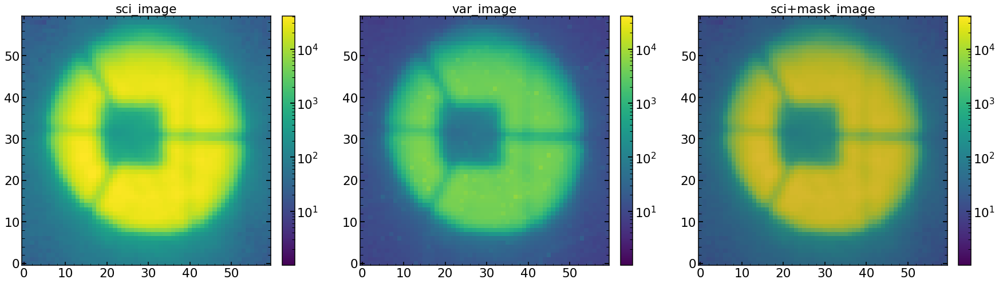

In [17]:
single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

117
1


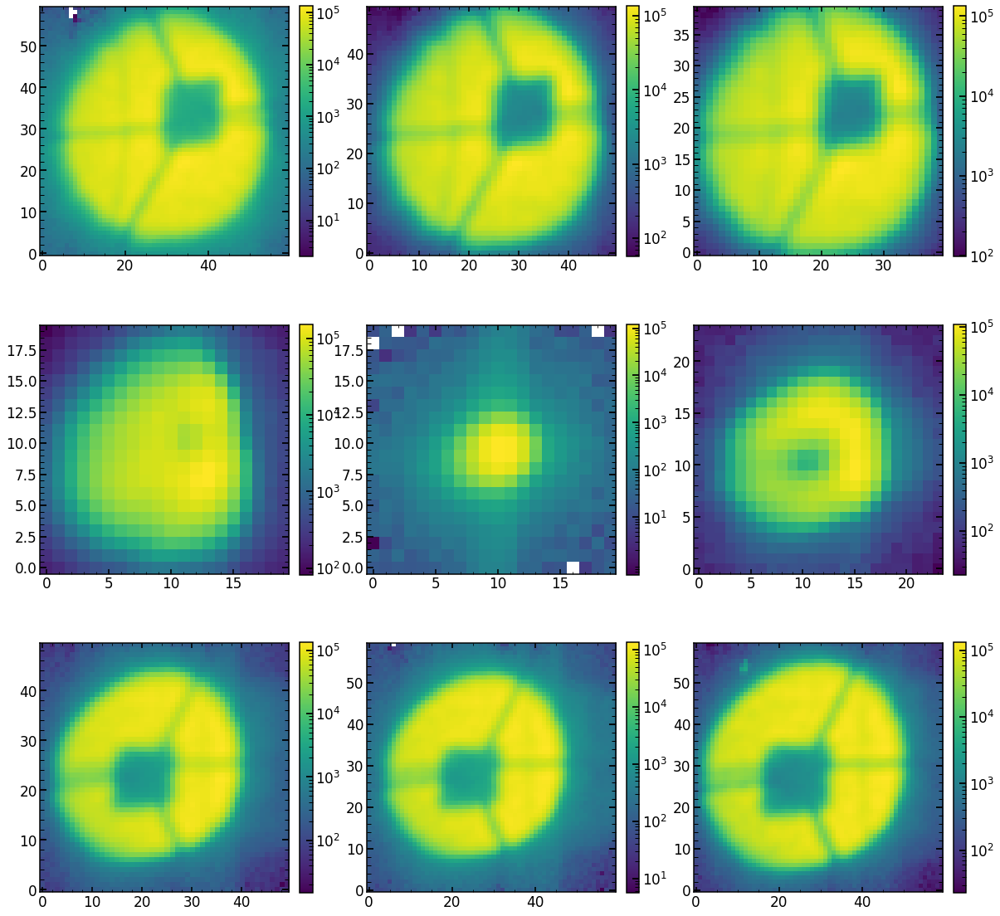

In [18]:
matplotlib.rcParams.update({'font.size': 14})

#image_index=87

image_index=117

print(image_index)
print(finalAr.loc[image_index]['close'])

run_1=19238+6
run_2=19238+12
run_3=19238+18
run_4=19238+54-12
run_5=19238+54
run_6=19238+54+12
run_7=19238+54+36
run_8=19238+54+42
run_9=19238+54+48


sci_1_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'HgAr_Stacked.npy')
sci_2_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_2)+str(image_index)+'HgAr_Stacked.npy')
sci_3_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_3)+str(image_index)+'HgAr_Stacked.npy')
sci_4_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_4)+str(image_index)+'HgAr_Stacked.npy')
sci_5_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_5)+str(image_index)+'HgAr_Stacked.npy')
sci_6_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_6)+str(image_index)+'HgAr_Stacked.npy')
sci_7_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_7)+str(image_index)+'HgAr_Stacked.npy')
sci_8_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_8)+str(image_index)+'HgAr_Stacked.npy')
sci_9_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'HgAr_Stacked.npy')

plt.figure(figsize=(20,20))
plt.subplot(331)
plt.imshow(sci_1_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(332)
plt.imshow(sci_2_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(333)
plt.imshow(sci_3_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(334)
plt.imshow(sci_4_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(335)
plt.imshow(sci_5_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(336)
plt.imshow(sci_6_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(337)
plt.imshow(sci_7_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(338)
plt.imshow(sci_8_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(339)
plt.imshow(sci_9_LAM,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

1


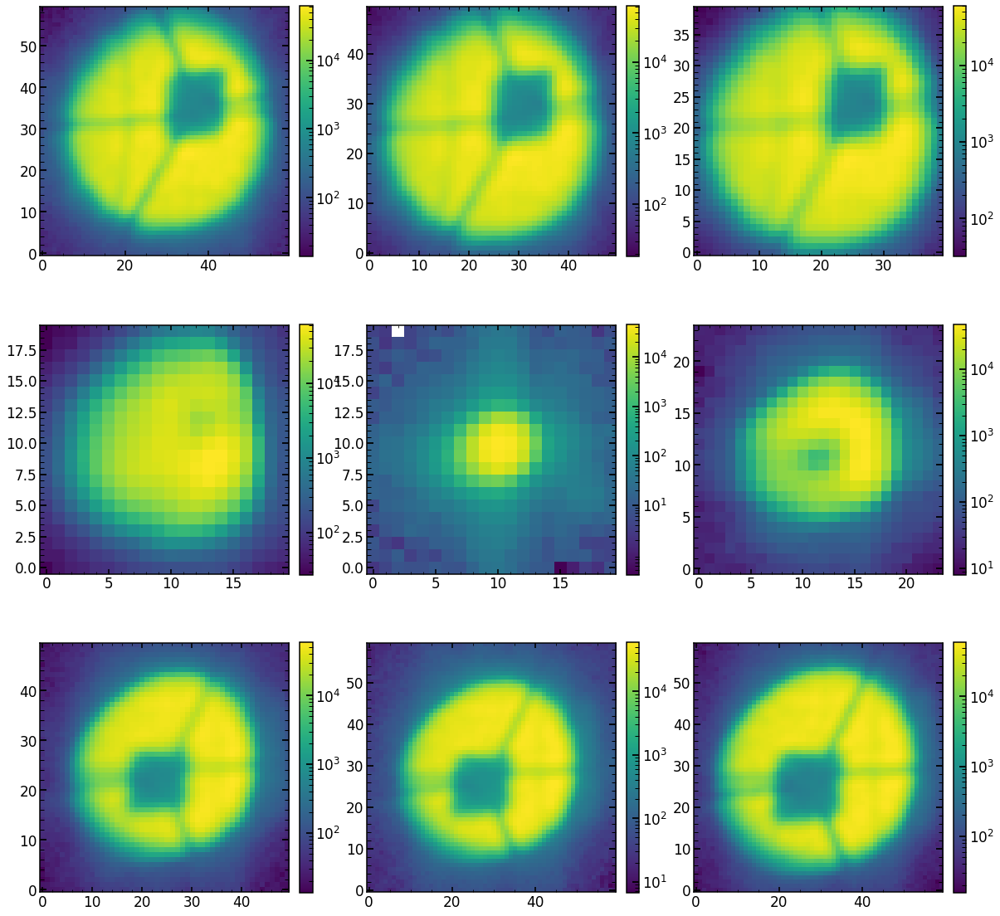

In [20]:
matplotlib.rcParams.update({'font.size': 14})



print(finalAr.loc[image_index]['close'])

run_1=34341+0
run_2=34341+6
run_3=34341+12
run_4=34341+48-12
run_5=34341+48
run_6=34341+48+12
run_7=34341+48+36
run_8=34341+48+42
run_9=34341+48+48


sci_1=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'Ar_Stacked.npy')
sci_2=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_2)+str(image_index)+'Ar_Stacked.npy')
sci_3=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_3)+str(image_index)+'Ar_Stacked.npy')
sci_4=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_4)+str(image_index)+'Ar_Stacked.npy')
sci_5=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_5)+str(image_index)+'Ar_Stacked.npy')
sci_6=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_6)+str(image_index)+'Ar_Stacked.npy')
sci_7=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_7)+str(image_index)+'Ar_Stacked.npy')
sci_8=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_8)+str(image_index)+'Ar_Stacked.npy')
sci_9=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'Ar_Stacked.npy')

plt.figure(figsize=(20,20))
plt.subplot(331)
plt.imshow(sci_1,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(332)
plt.imshow(sci_2,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(333)
plt.imshow(sci_3,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(334)
plt.imshow(sci_4,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(335)
plt.imshow(sci_5,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(336)
plt.imshow(sci_6,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(337)
plt.imshow(sci_7,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(338)
plt.imshow(sci_8,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

plt.subplot(339)
plt.imshow(sci_9,norm=LogNorm())
cbar=plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_ticks([10,10**2,10**3,10**4,10**5])

In [72]:

image_index=117

print(image_index)
print(finalAr.loc[image_index])

run_1=21346+6
run_9=21346+54+48


sci_1_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'HgAr_Stacked.npy')
sci_9_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Aug_14/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'HgAr_Stacked.npy')


run_1=34341+0
run_9=34341+48+48
sci_1=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'Ar_Stacked.npy')
sci_9=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'Ar_Stacked.npy')

117
fiber                  650
xc                    4008
yc                    3393
wavelength        912.5693
close                    1
lamp                    Ar
xc_effective          4077
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 117, dtype: object


Text(0.5, 1.0, 'Subaru data, defocus=4 mm, fiber=650, vw=912.569 nm')

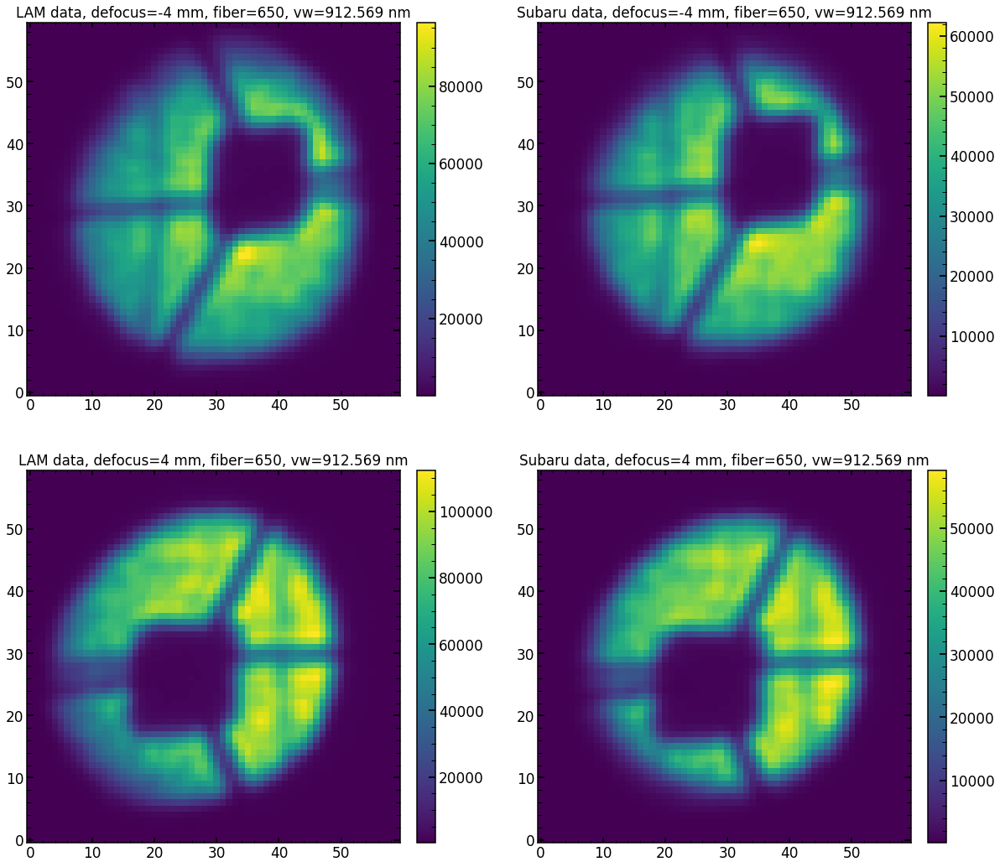

In [74]:

plt.figure(figsize=(20,18))
plt.subplot(221)

plt.imshow(sci_1_LAM,vmax=np.max(sci_1_LAM),vmin=np.max(sci_1_LAM)/1000)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('LAM data, defocus=-4 mm, fiber=650, vw=912.569 nm')

plt.subplot(222)

plt.imshow(sci_1,vmax=np.max(sci_1),vmin=np.max(sci_1)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Subaru data, defocus=-4 mm, fiber=650, vw=912.569 nm')


plt.subplot(223)
plt.imshow(sci_9_LAM,vmax=np.max(sci_9_LAM),vmin=np.max(sci_9_LAM)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('LAM data, defocus=4 mm, fiber=650, vw=912.569 nm')


plt.subplot(224)

plt.imshow(sci_9,vmax=np.max(sci_9),vmin=np.max(sci_9)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Subaru data, defocus=4 mm, fiber=650, vw=912.569 nm')

56
fiber                  339
xc                    1610
yc                    2635
wavelength        852.4029
close                    1
lamp                    Ar
xc_effective          1610
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 56, dtype: object
exposure_defocus_1_LAM: -4.0
exposure_defocus_9_LAM: 4.0


Text(0.5, 1.0, 'Subaru data, defocus=4 mm, fiber=339, vw=852.40 nm')

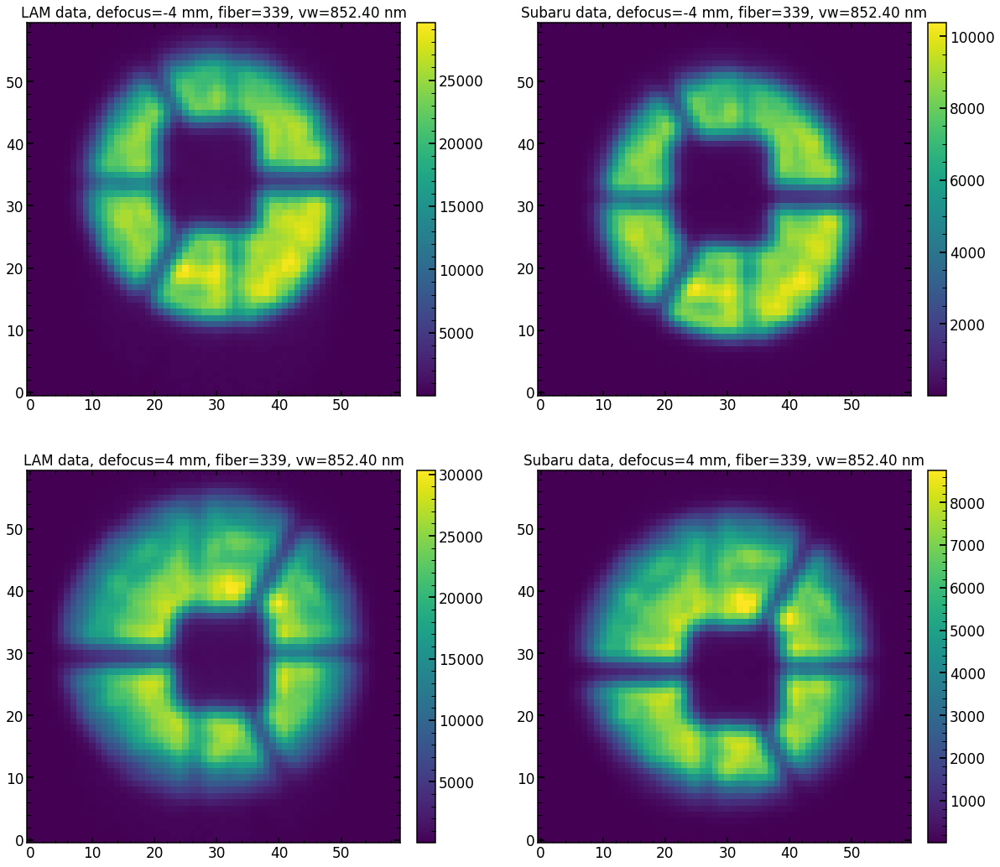

In [87]:

image_index=56

print(image_index)
print(finalAr.loc[image_index])

run_1=21346+6
run_9=21346+54+48


sci_1_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'HgAr_Stacked.npy')
sci_9_LAM=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Jun_25/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'HgAr_Stacked.npy')

sci_1_LAM_raw=fits.open('/Volumes/Saturn_USA/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-07-26/v00'+str(run_1)+'/calExp-LA0'+str(run_1)+'r1.fits')
exposure_defocus_1_LAM=np.round(sci_1_LAM_raw[0].header['W_ENFCAX'],2)
print('exposure_defocus_1_LAM: '+str(exposure_defocus_1_LAM))
sci_9_LAM_raw=fits.open('/Volumes/Saturn_USA/PFS/ReducedData/Jun_2019_run1/rerun/rerun_1/detrend/calExp/2019-07-26/v00'+str(run_9)+'/calExp-LA0'+str(run_9)+'r1.fits')
exposure_defocus_9_LAM=np.round(sci_9_LAM_raw[0].header['W_ENFCAX'],2)
print('exposure_defocus_9_LAM: '+str(exposure_defocus_9_LAM))

run_1=34341+0
run_9=34341+48+48
sci_1=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_1)+str(image_index)+'Ar_Stacked.npy')
sci_9=np.load("/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/sci"+str(run_9)+str(image_index)+'Ar_Stacked.npy')


plt.figure(figsize=(20,18))
plt.subplot(221)

plt.imshow(sci_1_LAM,vmax=np.max(sci_1_LAM),vmin=np.max(sci_1_LAM)/1000)
cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('LAM data, defocus=-4 mm, fiber=339, vw=852.40 nm')

plt.subplot(222)

plt.imshow(sci_1,vmax=np.max(sci_1),vmin=np.max(sci_1)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Subaru data, defocus=-4 mm, fiber=339, vw=852.40 nm')


plt.subplot(223)
plt.imshow(sci_9_LAM,vmax=np.max(sci_9_LAM),vmin=np.max(sci_9_LAM)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('LAM data, defocus=4 mm, fiber=339, vw=852.40 nm')


plt.subplot(224)

plt.imshow(sci_9,vmax=np.max(sci_9),vmin=np.max(sci_9)/1000)

cbar=plt.colorbar(fraction=0.046, pad=0.04)
plt.title('Subaru data, defocus=4 mm, fiber=339, vw=852.40 nm')

dx,dy0 3
center of sci_1_LAM_renormalized: (30.44656816730876, 31.4951159745555)
center of sci_1_LAM_renormalized moved: (30.44467047522903, 28.52897860023394)
center of sci_1: (30.56181699118944, 28.861129325904763)
(29.208646050629316, 31.803799520001462)
(29.20912009545198, 28.840988874622944)
(29.740706525102713, 29.79638225826512)


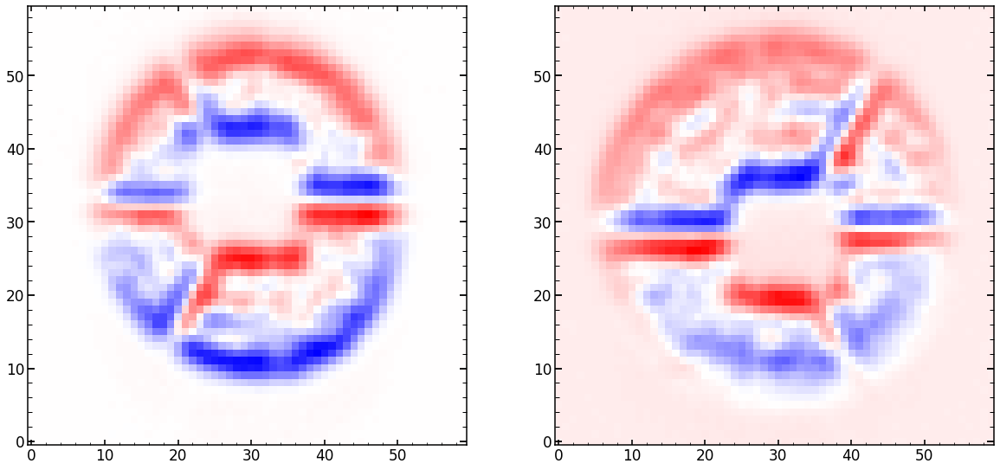

In [88]:
plt.figure(figsize=(20,10))

plt.subplot(121)
sci_1_LAM_renormalized=sci_1_LAM*np.sum(sci_1)/np.sum(sci_1_LAM)

dx,dy=np.array(find_centroid_of_flux(sci_1_LAM_renormalized))-np.array(find_centroid_of_flux(sci_1))
dx=int(np.round(dx))
dy=int(np.round(dy))

print('dx,dy'+str(dx)+' '+str(dy))
sci_1_LAM_renormalized_moved=np.zeros((60,60))
sci_1_LAM_renormalized_moved[0:60-dy,0:60-dx]=sci_1_LAM_renormalized[dy:60,dx:60]



print('center of sci_1_LAM_renormalized: '+str(find_centroid_of_flux(sci_1_LAM_renormalized)))
print('center of sci_1_LAM_renormalized moved: '+str(find_centroid_of_flux(sci_1_LAM_renormalized_moved)))

print('center of sci_1: '+str(find_centroid_of_flux(sci_1)))

plt.imshow(sci_1_LAM_renormalized-sci_1,cmap='bwr')


plt.subplot(122)
sci_9_LAM_renormalized=sci_9_LAM*np.sum(sci_9)/np.sum(sci_9_LAM)

sci_9_LAM_renormalized_moved=np.zeros((60,60))
sci_9_LAM_renormalized_moved[0:60-dy,0:60-dx]=sci_9_LAM_renormalized[dy:60,dx:60]

print(find_centroid_of_flux(sci_9_LAM_renormalized))
print(find_centroid_of_flux(sci_9_LAM_renormalized_moved))

print(find_centroid_of_flux(sci_9))

plt.imshow(sci_9_LAM_renormalized-sci_9,cmap='bwr')

Text(0.5, 1.0, 'cut along the middle of the image vertically, moved to roughly match, defocus=4mm, fiber=339, vw=852.40 nm')

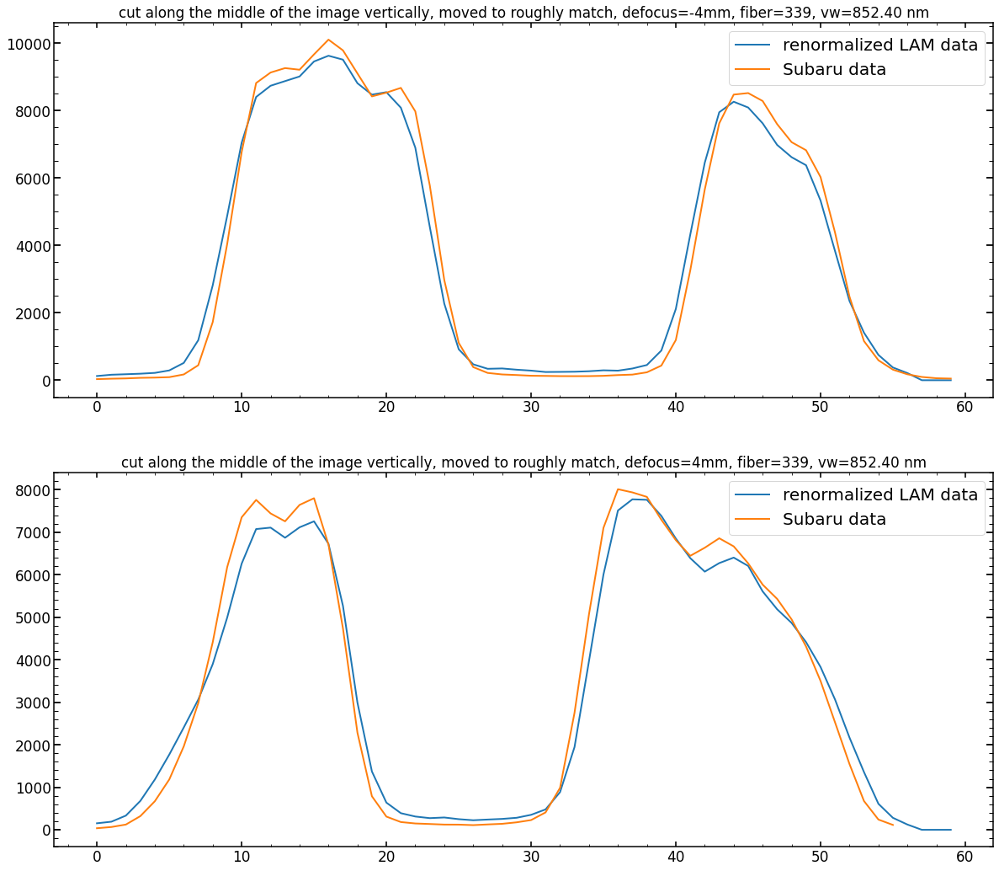

In [90]:
plt.figure(figsize=(20,18))

plt.subplot(211)
plt.plot(sci_1_LAM_renormalized_moved[:,30],lw=2,label='renormalized LAM data')
plt.plot(sci_1[:,30][0:60],lw=2, label='Subaru data')
plt.legend(fontsize=20)

plt.title('cut along the middle of the image vertically, moved to roughly match, defocus=-4mm, fiber=339, vw=852.40 nm')

plt.subplot(212)
plt.plot(sci_9_LAM_renormalized_moved[:,30],lw=2,label='renormalized LAM data')
plt.plot(sci_9[:,30][1:57],lw=2, label='Subaru data')
plt.legend(fontsize=20)

plt.title('cut along the middle of the image vertically, moved to roughly match, defocus=4mm, fiber=339, vw=852.40 nm')

# PIPE2D-757 (poor solution in red)

## case 11

fraction of chi2 due to 1% of pixels: 0.09996654
chi**2 max reduced is: 6603.958
chi**2 reduced is: 73.14743 for log improvment: -1.9556053
---------------------
chi**2 reduced within mask area is: 73.14743
---------------------
chi**2 max reduced within flux mask area is: 15632.917
chi**2 reduced within flux mask area is: 130.88095 for log improvment: -2.0771635
---------------------
Abs of residual divided by total flux is: 0.07597186
Abs of residual divided by largest value of a flux in the image is: 0.16996196


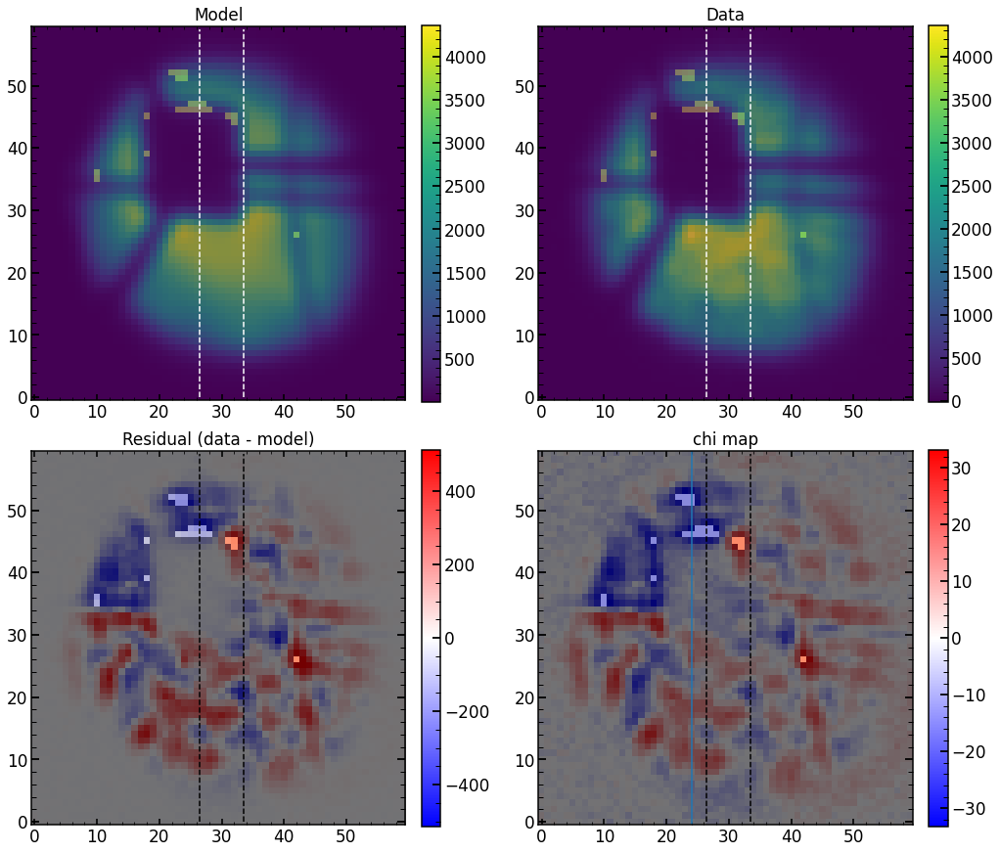

In [244]:
single_number=11
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

plt.axvline(24)


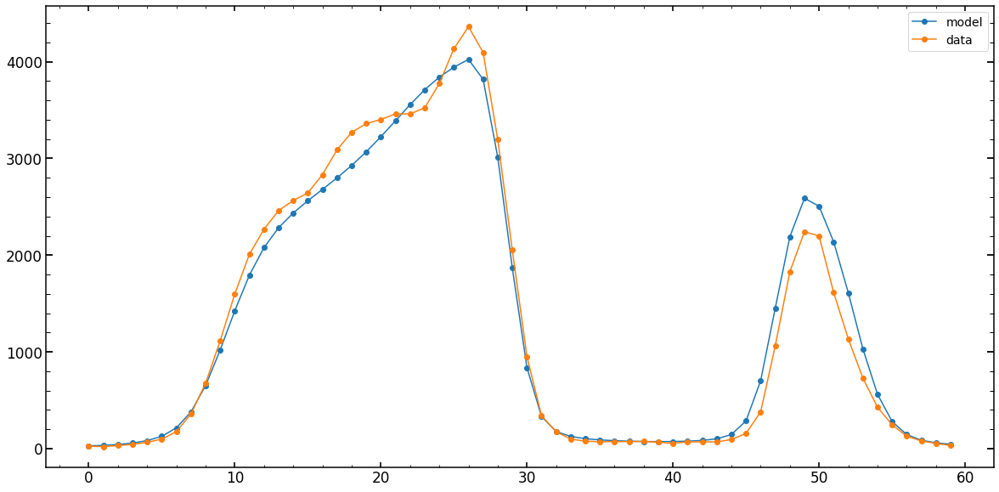

In [245]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,24],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,24],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.1256252
chi**2 max reduced is: 6020.837
chi**2 reduced is: 51.582695 for log improvment: -2.0671527
---------------------
chi**2 reduced within mask area is: 51.58269
---------------------
chi**2 max reduced within flux mask area is: 14081.09
chi**2 reduced within flux mask area is: 98.14617 for log improvment: -2.1567628
---------------------
Abs of residual divided by total flux is: 0.06738955
Abs of residual divided by largest value of a flux in the image is: 0.21983501


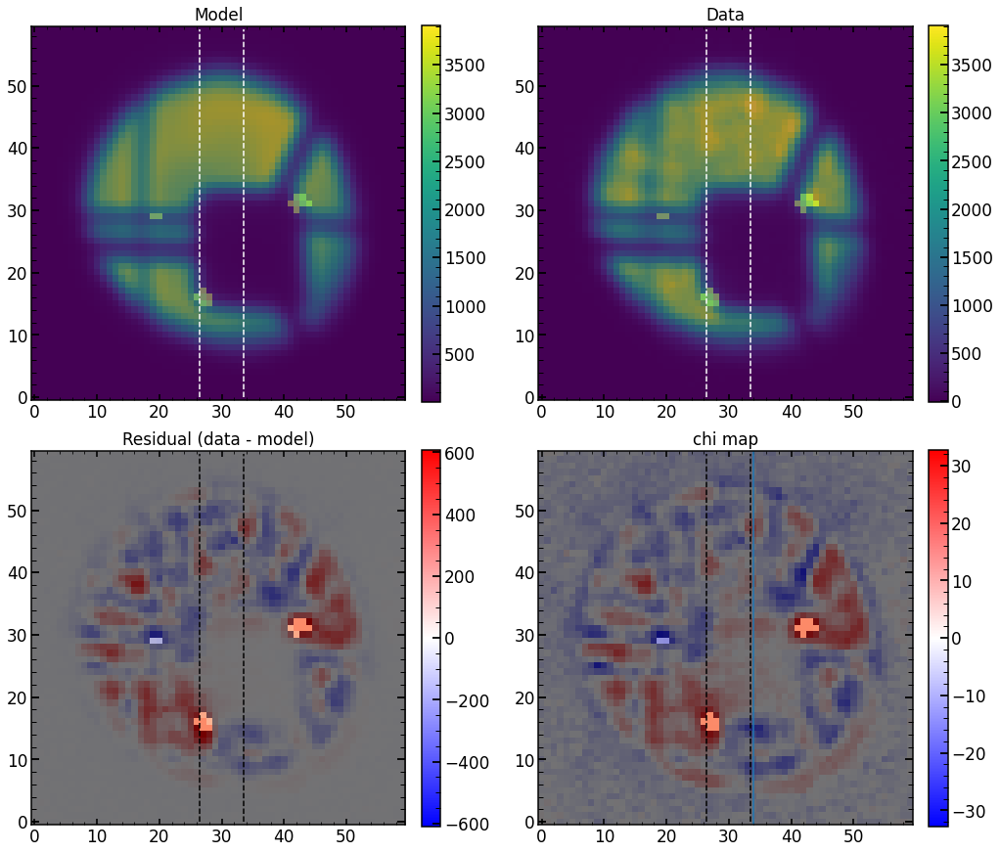

In [246]:
index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

plt.axvline(34)


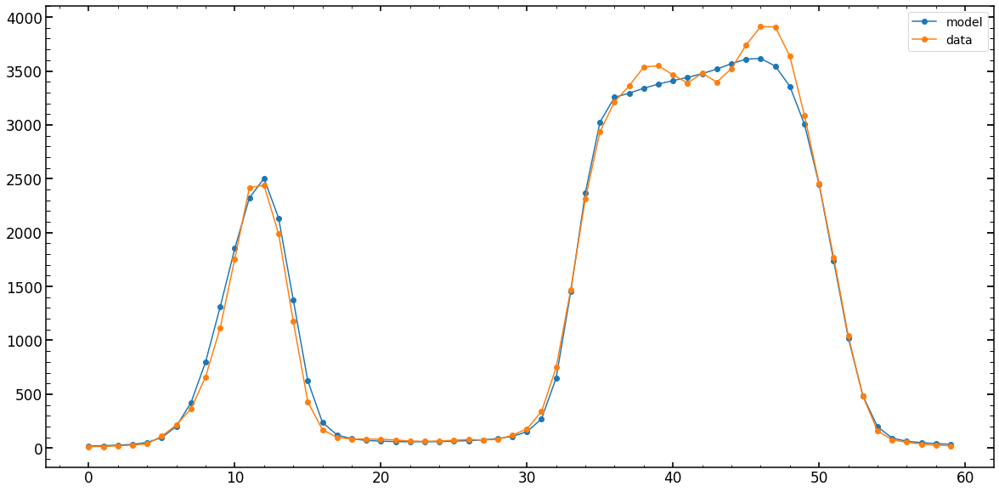

In [247]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,34],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,34],label='data',marker='o')
plt.legend()

## case 119

In [ ]:
plt.plot(np.sum(array_of_single_model_image[index_of_single_image][:,20])
plt.plot(array_of_sci_image[index_of_single_image][:,20])

fraction of chi2 due to 1% of pixels: 0.08359174
chi**2 max reduced is: 6743.2295
chi**2 reduced is: 102.259796 for log improvment: -1.819163
---------------------
chi**2 reduced within mask area is: 102.2598
---------------------
chi**2 max reduced within flux mask area is: 15616.658
chi**2 reduced within flux mask area is: 189.66788 for log improvment: -1.9155943
---------------------
Abs of residual divided by total flux is: 0.09431785
Abs of residual divided by largest value of a flux in the image is: 0.19989352


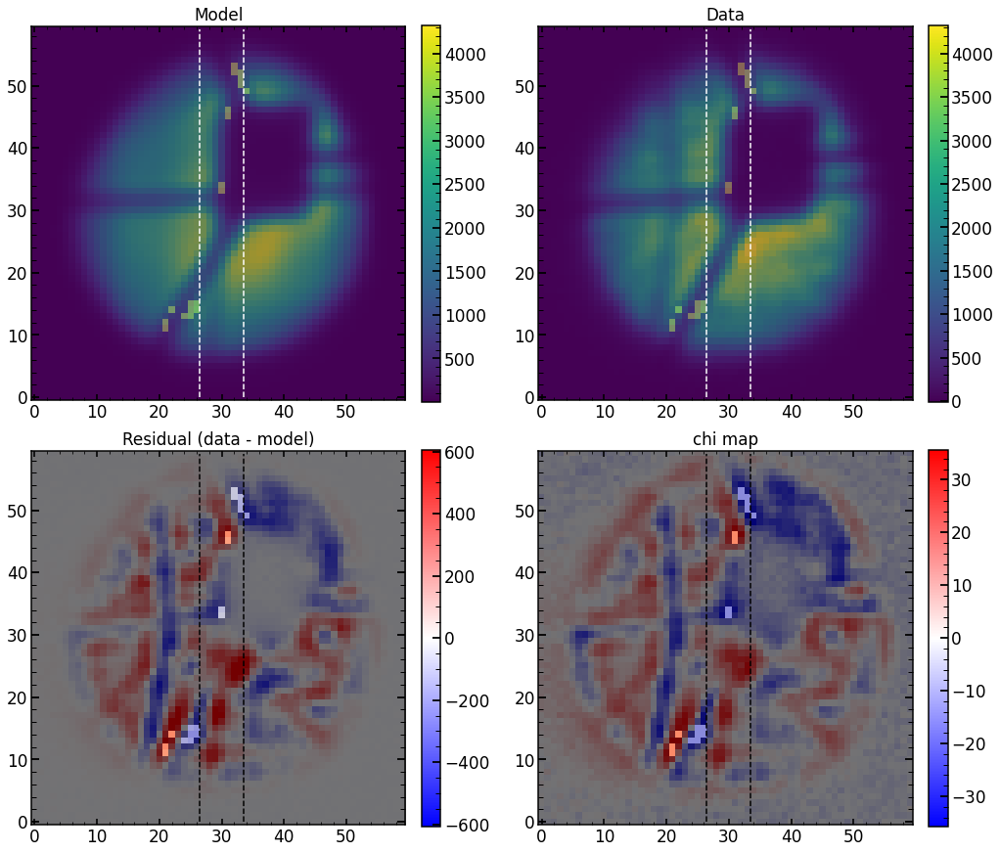

In [158]:
single_number=119
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0

single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

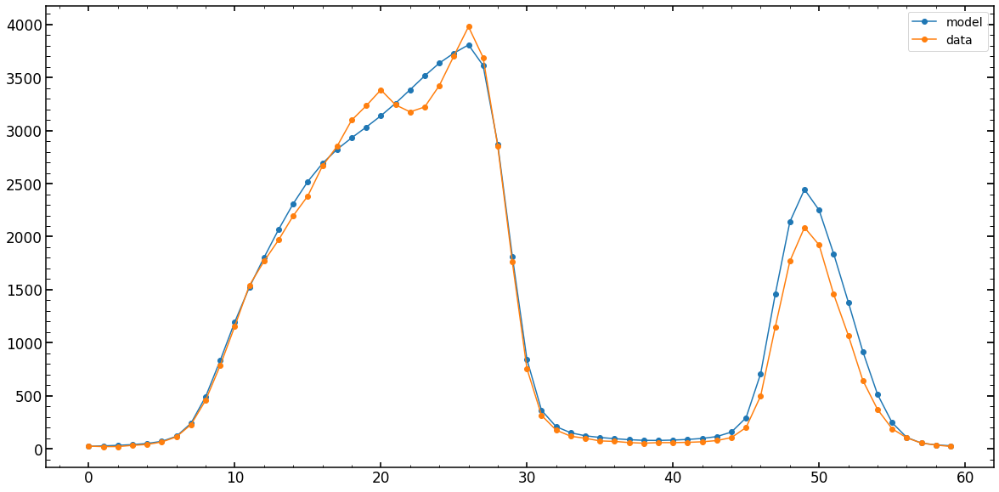

In [160]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,40],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,40],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.0955636
chi**2 max reduced is: 6287.7456
chi**2 reduced is: 74.199356 for log improvment: -1.9280949
---------------------
chi**2 reduced within mask area is: 74.199356
---------------------
chi**2 max reduced within flux mask area is: 14762.162
chi**2 reduced within flux mask area is: 140.29703 for log improvment: -2.0221014
---------------------
Abs of residual divided by total flux is: 0.08079599
Abs of residual divided by largest value of a flux in the image is: 0.20157935


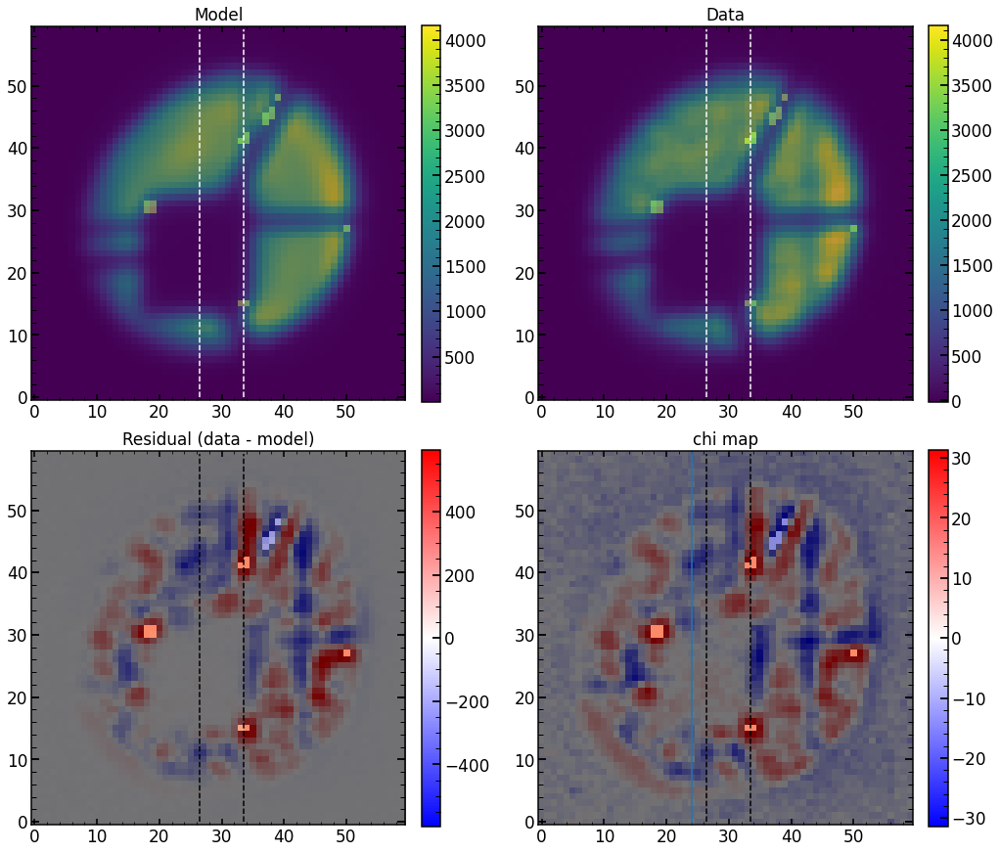

In [162]:
index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

plt.axvline(24)


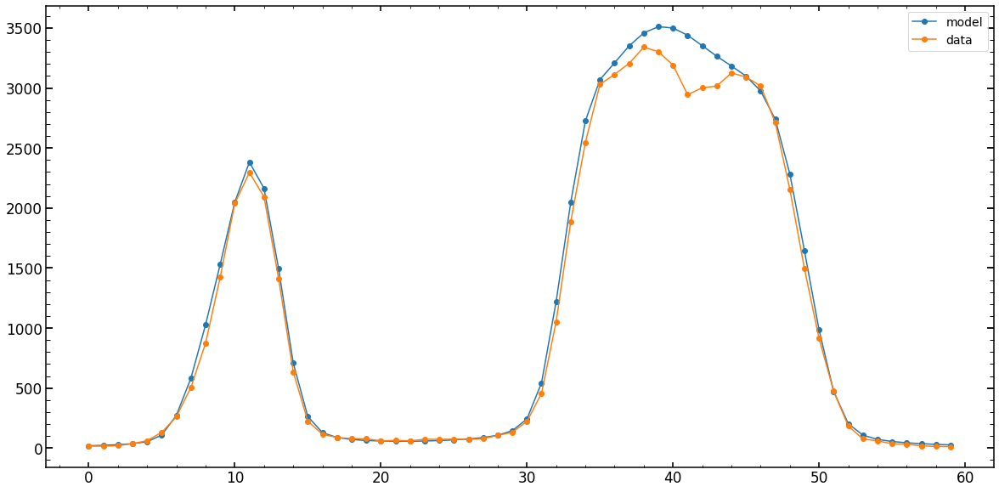

In [163]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,24],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,24],label='data',marker='o')
plt.legend()

## case 59

fraction of chi2 due to 1% of pixels: 0.078222334
chi**2 max reduced is: 7316.2314
chi**2 reduced is: 38.20243 for log improvment: -2.2821965
---------------------
chi**2 reduced within mask area is: 38.20243
---------------------
chi**2 max reduced within flux mask area is: 17118.367
chi**2 reduced within flux mask area is: 74.79241 for log improvment: -2.3596048
---------------------
Abs of residual divided by total flux is: 0.056437343
Abs of residual divided by largest value of a flux in the image is: 0.13395004


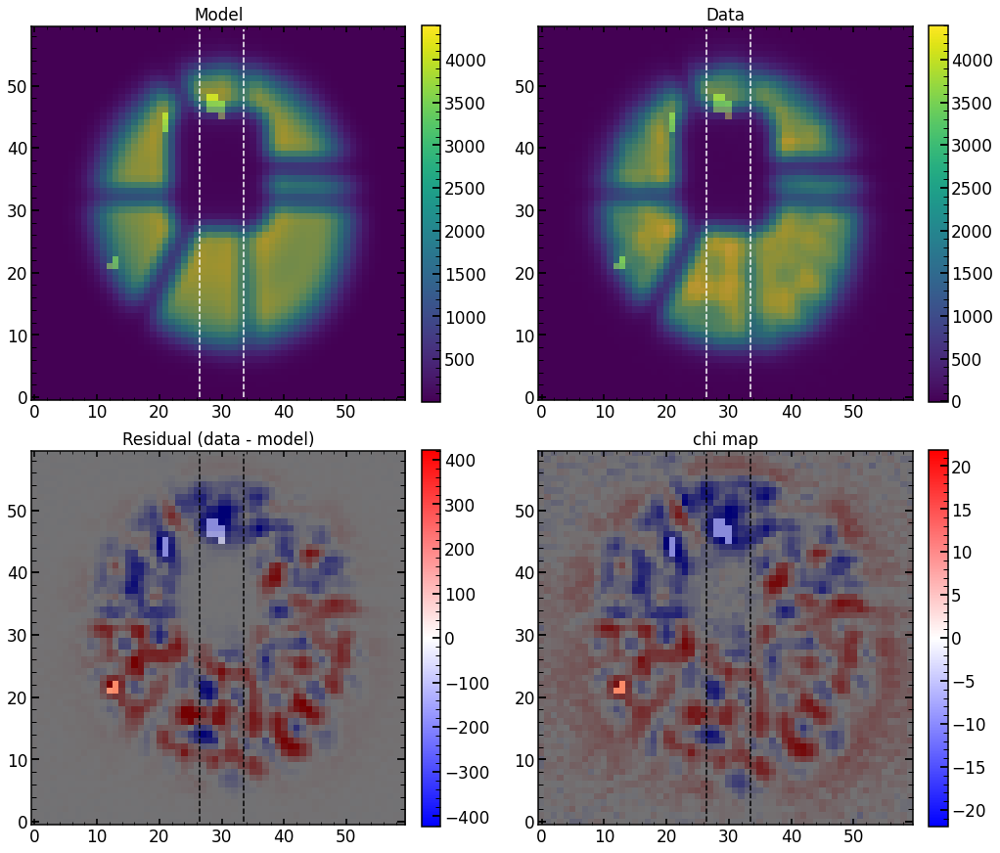

In [127]:
single_number=59
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

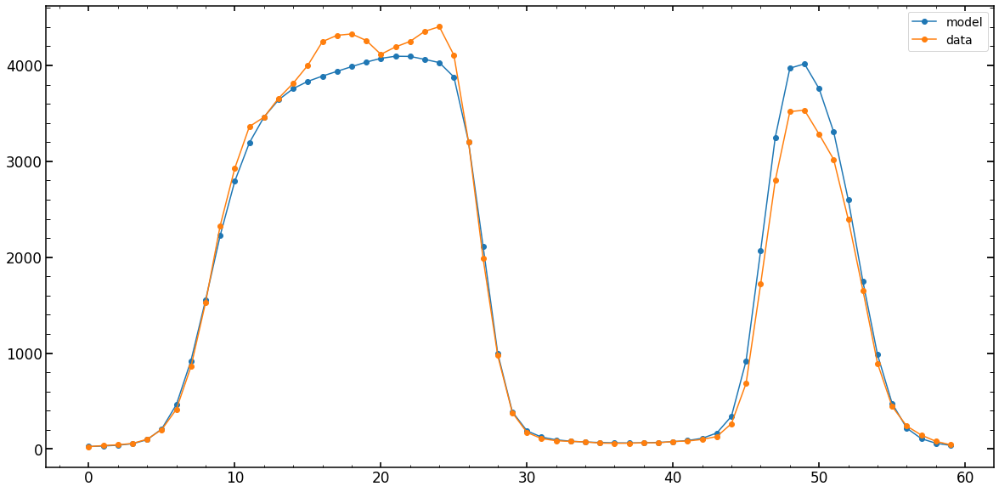

In [128]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.07379115
chi**2 max reduced is: 6758.381
chi**2 reduced is: 36.996033 for log improvment: -2.2616875
---------------------
chi**2 reduced within mask area is: 36.996033
---------------------
chi**2 max reduced within flux mask area is: 15612.855
chi**2 reduced within flux mask area is: 68.94316 for log improvment: -2.3549912
---------------------
Abs of residual divided by total flux is: 0.056759097
Abs of residual divided by largest value of a flux in the image is: 0.12810427


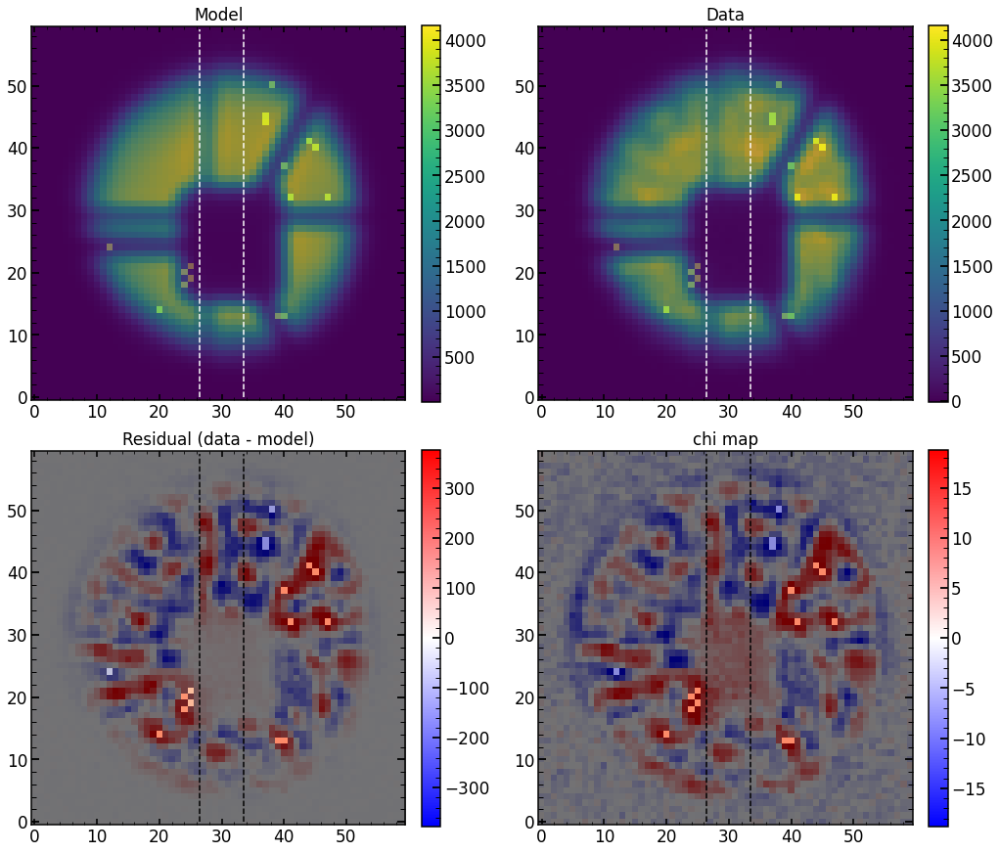

In [129]:

index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

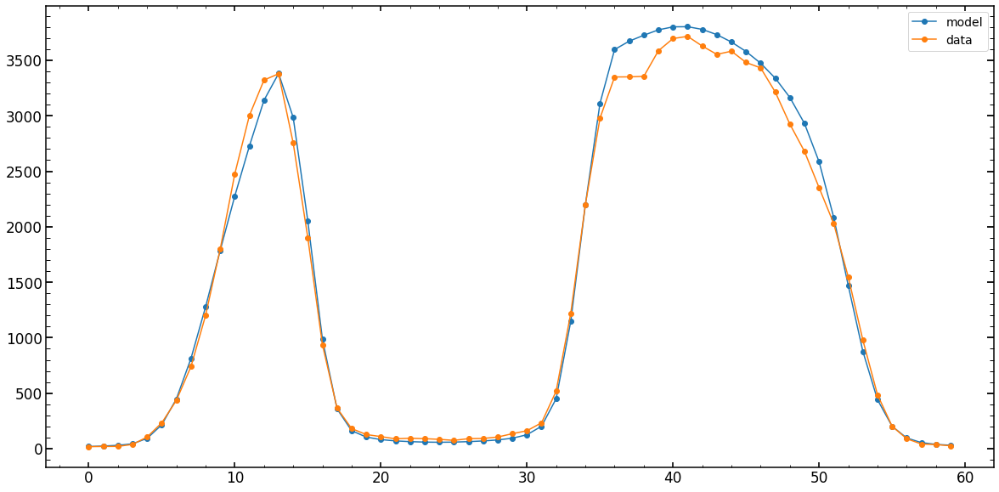

In [130]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

## case 43

fraction of chi2 due to 1% of pixels: 0.08718203
chi**2 max reduced is: 29222.805
chi**2 reduced is: 116.452866 for log improvment: -2.3995717
---------------------
chi**2 reduced within mask area is: 116.45287
---------------------
chi**2 max reduced within flux mask area is: 68034.69
chi**2 reduced within flux mask area is: 212.29907 for log improvment: -2.5057824
---------------------
Abs of residual divided by total flux is: 0.046037745
Abs of residual divided by largest value of a flux in the image is: 0.124611005


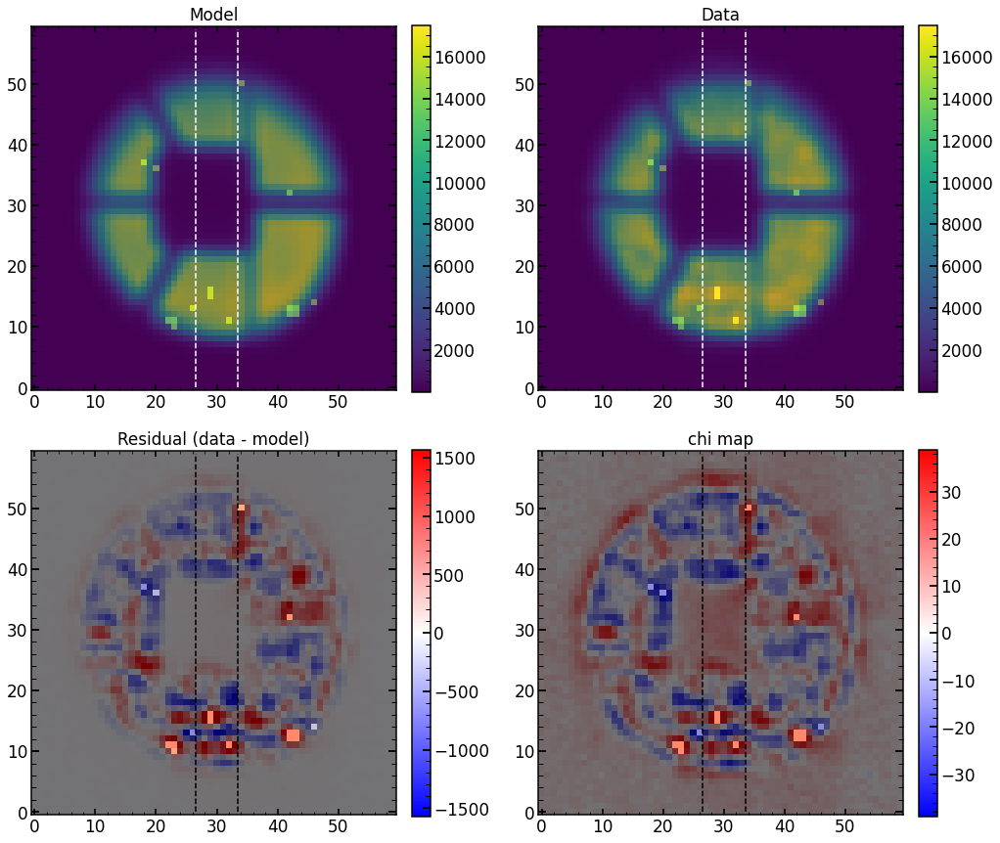

In [136]:
single_number=43
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

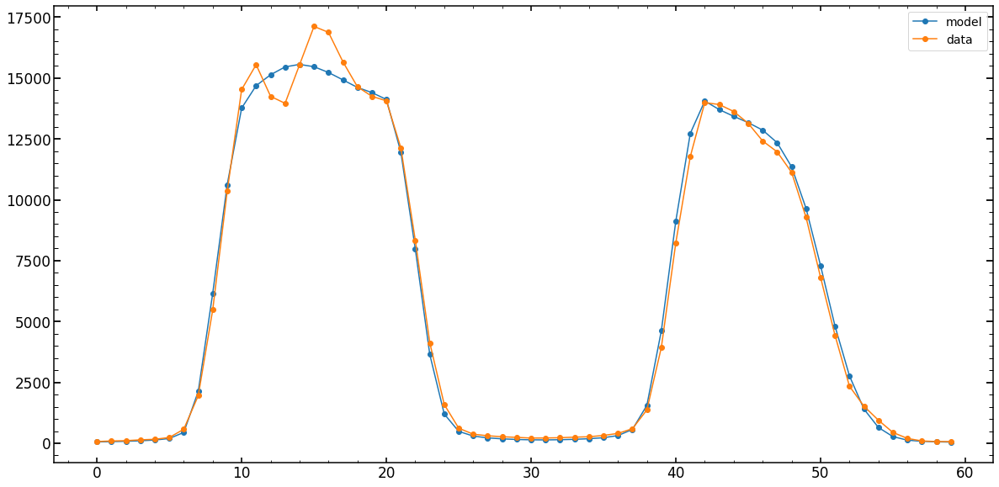

In [137]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.094841465
chi**2 max reduced is: 27580.082
chi**2 reduced is: 127.52926 for log improvment: -2.3349857
---------------------
chi**2 reduced within mask area is: 127.52926
---------------------
chi**2 max reduced within flux mask area is: 62629.996
chi**2 reduced within flux mask area is: 231.99959 for log improvment: -2.4312952
---------------------
Abs of residual divided by total flux is: 0.051001765
Abs of residual divided by largest value of a flux in the image is: 0.12437045


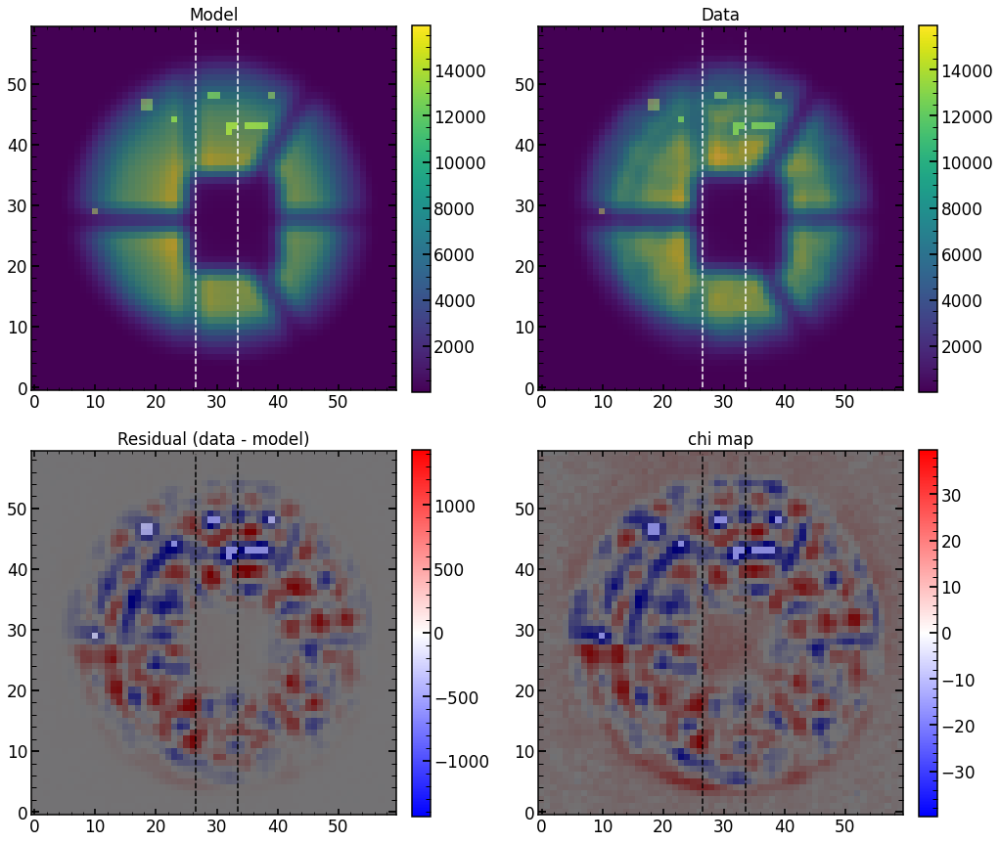

In [138]:

index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

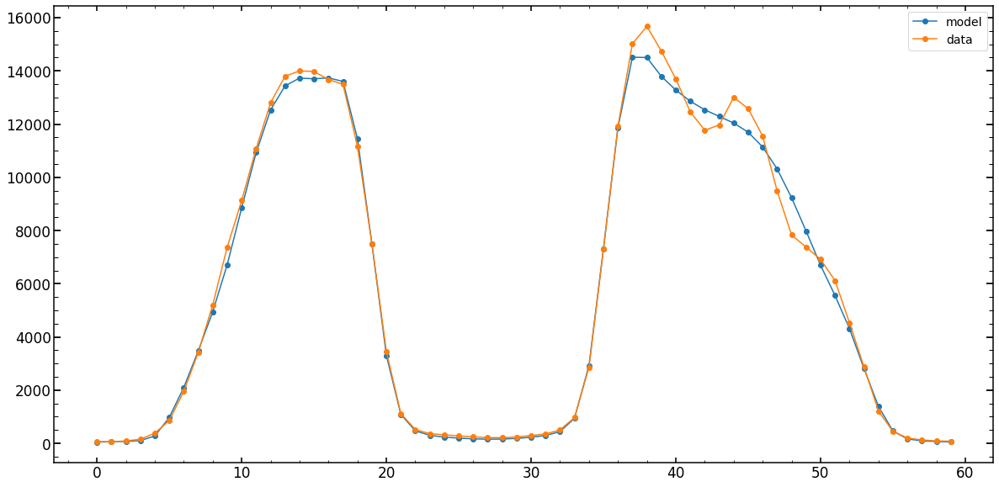

In [139]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

## case 37

fraction of chi2 due to 1% of pixels: 0.0916063
chi**2 max reduced is: 10912.398
chi**2 reduced is: 44.962395 for log improvment: -2.3850708
---------------------
chi**2 reduced within mask area is: 44.962395
---------------------
chi**2 max reduced within flux mask area is: 25111.957
chi**2 reduced within flux mask area is: 92.310715 for log improvment: -2.4346285
---------------------
Abs of residual divided by total flux is: 0.04808247
Abs of residual divided by largest value of a flux in the image is: 0.12888472


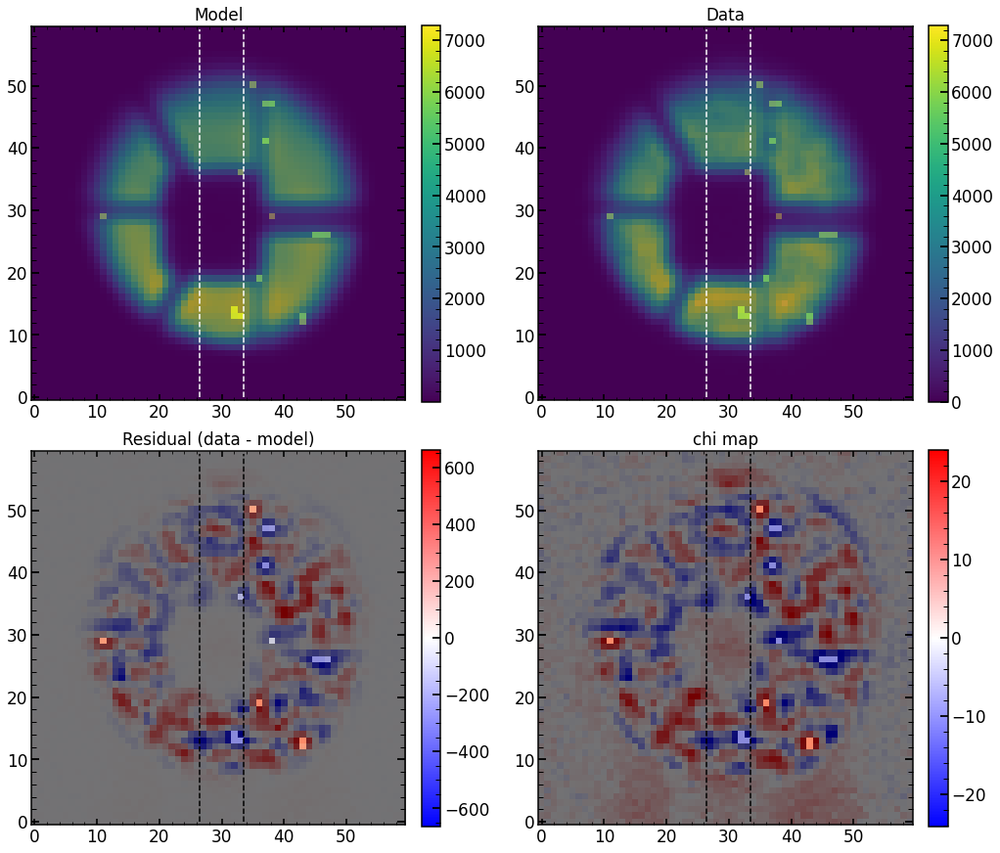

In [141]:
single_number=37
array_of_sci_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_sci_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_single_model_image=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_single_model_image'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_var_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_var_images'+'_'+str(single_number)+'.npy',allow_pickle=True)
array_of_mask_images=np.load('/Users/nevencaplar/Documents/PFS/Testing/Data/'+'array_of_mask_images'+'_'+str(single_number)+'.npy',allow_pickle=True)


index_of_single_image=0


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

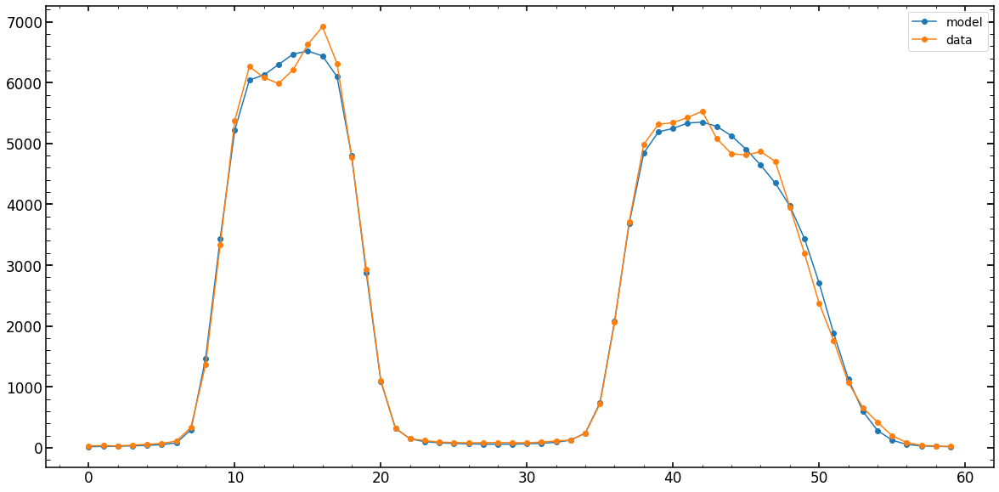

In [142]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,30],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,30],label='data',marker='o')
plt.legend()

fraction of chi2 due to 1% of pixels: 0.10009286
chi**2 max reduced is: 10214.906
chi**2 reduced is: 48.51637 for log improvment: -2.3233461
---------------------
chi**2 reduced within mask area is: 48.51637
---------------------
chi**2 max reduced within flux mask area is: 22922.643
chi**2 reduced within flux mask area is: 91.510056 for log improvment: -2.3987958
---------------------
Abs of residual divided by total flux is: 0.05045962
Abs of residual divided by largest value of a flux in the image is: 0.12114981


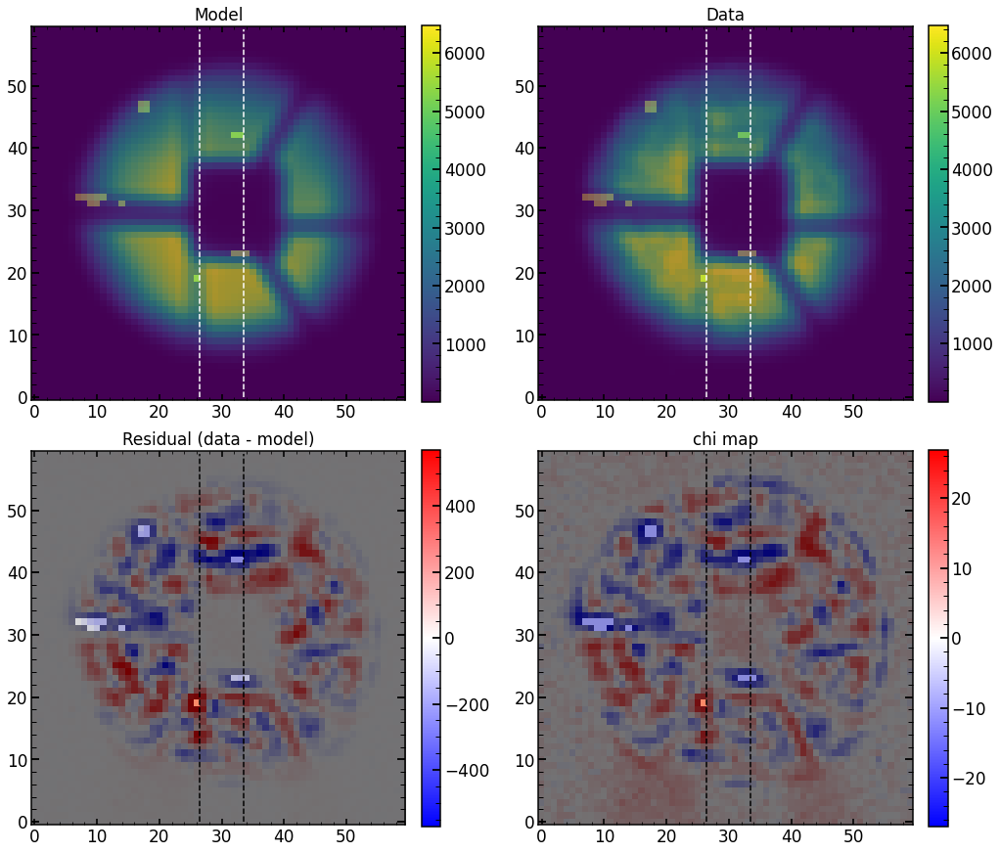

In [143]:

index_of_single_image=8


single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                             custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                             show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True)

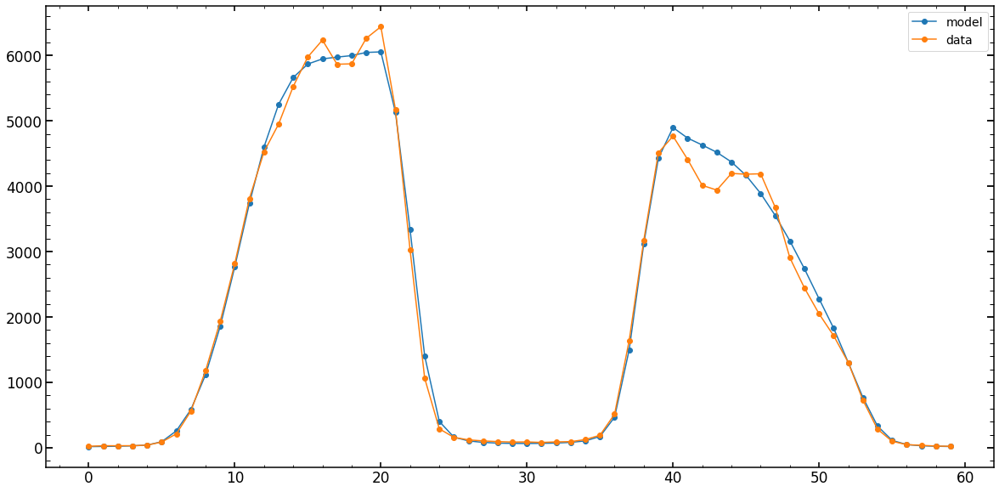

In [145]:
plt.figure(figsize=(20,10))
plt.plot(array_of_single_model_image[index_of_single_image][:,32],label='model',marker='o')
plt.plot(array_of_sci_image[index_of_single_image][:,32],label='data',marker='o')
plt.legend()

## more overview 

In [29]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='6'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                    2
xc                      73
yc                    2009
wavelength        795.0522
close                    1
lamp                    Ar
xc_effective            73
second_offset            0
second_ratio             0
second2_offset           0
second2_ratio            0
Name: 6, dtype: object

In [70]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='6'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]



for single_number in tqdm(range(120)):
    single_number=str(single_number)
    try:


        single_analysis=Zernike_Analysis(date=date,obs='p4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_long)

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        columns,columns22,columns22_analysis=single_analysis.return_columns()


        chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
        #chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
        len_of_chains=single_analysis.len_of_chains()

        minchain_parametrization,like_min=single_analysis.create_likelihood()


        array_of_sci_image=np.array(list_of_sci_images)
        array_of_var_images=np.array(list_of_var_images)
        array_of_mask_images=np.array(list_of_mask_images)

        res_multi=np.load('/Users/nevencaplar/Documents/PFS/Images/Jan2921/Res_multi/res_multi_'+single_number+'_Ar.npy',allow_pickle=True)
        mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                        list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

        array_of_single_model_image=np.array(list_of_single_model_image)

        single_analysis.create_basic_comparison_plot(custom_model_image=array_of_single_model_image[index_of_single_image],custom_mask=array_of_mask_images[index_of_single_image],\
                                                     custom_sci_image=array_of_sci_image[index_of_single_image],custom_var_image=array_of_var_images[index_of_single_image],\
                                                     show_flux_mask=False,use_max_chi_scaling=True,use_max_flux_scaling=True,show_impact_pixels_mask=True,
                                                      save=single_number+'_Ar_p4')
        
    except:
        pass

  0%|                                                                                               | 0/120 [00:00<?, ?it/s]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 0
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 1
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443716ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/T

  2%|█▍                                                                                     | 2/120 [00:02<02:34,  1.31s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 2
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443726ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443726ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443726ArSwarm1.npy
(36, 480, 129)
minima

  2%|██▏                                                                                    | 3/120 [00:04<03:06,  1.59s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 3
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443736ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443736ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443736ArSwarm1.npy
(36, 480, 129)
minimal likelihoo

  3%|██▉                                                                                    | 4/120 [00:07<03:26,  1.78s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 4
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443746ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443746ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443746ArSwarm1.npy
(36, 480, 129)
minimal 

  4%|███▋                                                                                   | 5/120 [00:09<03:33,  1.86s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 5
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443756ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443756ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443756ArSwarm1.npy
(36, 480, 129)
minimal likel

  5%|████▎                                                                                  | 6/120 [00:11<03:44,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 6
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443766ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443766ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443766ArSwarm1.npy
(36, 480, 129)
minimal likelihoo

  6%|█████                                                                                  | 7/120 [00:13<03:40,  1.95s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 7
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443776ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443776ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443776ArSwarm1.npy
(36, 480, 129)
minimal likel

  7%|█████▊                                                                                 | 8/120 [00:15<03:40,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 8
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443786ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443786ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443786ArSwarm1.npy
(36, 480, 129)
minimal likelihoo

  8%|██████▌                                                                                | 9/120 [00:17<03:35,  1.94s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 9
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443796ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443796ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_3443796ArSwarm1.npy
(36, 480, 129)
minimal likelihoo

  8%|███████▏                                                                              | 10/120 [00:19<03:34,  1.95s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 10
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437106ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437106ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437106ArSwarm1.npy
(36, 480, 129)
mi

  9%|███████▉                                                                              | 11/120 [00:21<03:34,  1.96s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437116ArSwarm1.npy
(36, 480, 129)
minimal likel

 10%|████████▌                                                                             | 12/120 [00:23<03:34,  1.99s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 12
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 13
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437136ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

 12%|██████████                                                                            | 14/120 [00:25<03:01,  1.71s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 14
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437146ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437146ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437146ArSwarm1.npy
(36, 480, 129)
mi

 12%|██████████▊                                                                           | 15/120 [00:27<03:03,  1.75s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 15
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437156ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437156ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437156ArSwarm1.npy
(36, 480, 129)
minimal likel

 13%|███████████▍                                                                          | 16/120 [00:29<03:14,  1.87s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 16
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437166ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437166ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437166ArSwarm1.npy
(36, 480, 129)
mini

 14%|████████████▏                                                                         | 17/120 [00:31<03:18,  1.93s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 17
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437176ArSwarm1.npy
(36, 480, 129)
minimal l

 15%|████████████▉                                                                         | 18/120 [00:33<03:17,  1.94s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 18
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437186ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437186ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437186ArSwarm1.npy
(36, 480, 129)
minimal likel

 16%|█████████████▌                                                                        | 19/120 [00:35<03:18,  1.96s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 19
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437196ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437196ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437196ArSwarm1.npy
(36, 480, 129)
minimal l

 17%|██████████████▎                                                                       | 20/120 [00:37<03:15,  1.95s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 20
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437206ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437206ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437206ArSwarm1.npy
(36, 480, 129)
minimal likel

 18%|███████████████                                                                       | 21/120 [00:39<03:16,  1.99s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 21
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437216ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437216ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437216ArSwarm1.npy
(36, 480, 129)
minimal likel

 18%|███████████████▊                                                                      | 22/120 [00:41<03:15,  2.00s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 22
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437226ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437226ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437226ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 12718.525
chi**2 reduced is: 79.41167 for log improvment: -2.2045524
---------------------
chi**2 reduced within mask area is: 79.41167
---------------------
chi**2 max reduced within flux mask area is: 29355.914
chi**2 reduced within flux mask area is: 119.085205 for log improvment: -2.3918378
---------------------
Abs of residual divided by total flux is: 0.055105995
Abs of residual divided by largest value of a flux in the image is: 0.16505425


 19%|████████████████▍                                                                     | 23/120 [00:43<03:12,  1.98s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 23
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437236ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437236ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437236ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 5293.614
chi**2 reduced is: 44.137383 for log improvment: -2.0789456
---------------------
chi**2 reduced within mask area is: 44.137383
---------------------
chi**2 max reduced within flux mask area is: 12348.491
chi**2 reduced within flux mask area is: 67.47015 for log improvment: -2.2625022
---------------------
Abs of residual divided by total flux is: 0.064638935
Abs of residual divided by largest value of a flux in the image is: 0.19396242


 20%|█████████████████▏                                                                    | 24/120 [00:45<03:11,  2.00s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 24
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 25
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437256ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 5657.215
chi**2 reduced is: 32.113747 for log improvment: -2.2459116
---------------------
chi**2 reduced within mask area is: 32.113743
---------------------
chi**2 max reduced within flux mask area is: 12806.039
chi**2 reduced within flux mask area is: 60.84106 for log improvment: -2.323218
---------------------
Abs of residual divided by total flux is: 0.057218064
Abs of residual divided by largest value of a flux in the image is: 0.13022943


 22%|██████████████████▋                                                                   | 26/120 [00:47<02:40,  1.71s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 26
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437266ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437266ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437266ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2352.6274
chi**2 reduced is: 16.758924 for log improvment: -2.147307
---------------------
chi**2 reduced within mask area is: 16.758924
---------------------
chi**2 max reduced within flux mask area is: 5378.806
chi**2 reduced within flux mask area is: 27.466743 for log improvment: -2.2918787
---------------------
Abs of residual divided by total flux is: 0.064194426
Abs of residual divided by largest value of a flux in the image is: 0.12808949


 22%|███████████████████▎                                                                  | 27/120 [00:49<02:45,  1.78s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 27
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437276ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437276ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437276ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 1703.7793
chi**2 reduced is: 11.3950815 for log improvment: -2.174696
---------------------
chi**2 reduced within mask area is: 11.395082
---------------------
chi**2 max reduced within flux mask area is: 3915.9658
chi**2 reduced within flux mask area is: 18.851934 for log improvment: -2.317483
---------------------
Abs of residual divided by total flux is: 0.064521745
Abs of residual divided by largest value of a flux in the image is: 0.13577998


 23%|████████████████████                                                                  | 28/120 [00:51<02:51,  1.86s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 28
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437286ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437286ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437286ArSwarm1.npy
(36, 480, 129)
mini

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 5492.9077
chi**2 reduced is: 39.938736 for log improvment: -2.138408
---------------------
chi**2 reduced within mask area is: 39.938736
---------------------
chi**2 max reduced within flux mask area is: 12626.008
chi**2 reduced within flux mask area is: 53.343147 for log improvment: -2.3741875
---------------------
Abs of residual divided by total flux is: 0.06034107
Abs of residual divided by largest value of a flux in the image is: 0.13050653


 24%|████████████████████▊                                                                 | 29/120 [00:53<02:52,  1.89s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 29
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437296ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437296ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437296ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 39730.664
chi**2 reduced is: 161.81381 for log improvment: -2.3901103
---------------------
chi**2 reduced within mask area is: 161.8138
---------------------
chi**2 max reduced within flux mask area is: 88479.69
chi**2 reduced within flux mask area is: 332.3308 for log improvment: -2.425273
---------------------
Abs of residual divided by total flux is: 0.048895776
Abs of residual divided by largest value of a flux in the image is: 0.12704366


 25%|█████████████████████▌                                                                | 30/120 [00:55<02:53,  1.93s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 30
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437306ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437306ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437306ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 11190.361
chi**2 reduced is: 47.41243 for log improvment: -2.372952
---------------------
chi**2 reduced within mask area is: 47.41243
---------------------
chi**2 max reduced within flux mask area is: 25123.523
chi**2 reduced within flux mask area is: 92.20037 for log improvment: -2.4353478
---------------------
Abs of residual divided by total flux is: 0.05053261
Abs of residual divided by largest value of a flux in the image is: 0.15661888


 26%|██████████████████████▏                                                               | 31/120 [00:57<02:54,  1.96s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 31
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437316ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437316ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437316ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 15107.421
chi**2 reduced is: 64.80988 for log improvment: -2.3675492
---------------------
chi**2 reduced within mask area is: 64.809875
---------------------
chi**2 max reduced within flux mask area is: 34193.71
chi**2 reduced within flux mask area is: 135.18767 for log improvment: -2.4030092
---------------------
Abs of residual divided by total flux is: 0.05152683
Abs of residual divided by largest value of a flux in the image is: 0.16432652


 27%|██████████████████████▉                                                               | 32/120 [00:59<02:51,  1.94s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 32
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437326ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437326ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437326ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 8814.679
chi**2 reduced is: 38.941013 for log improvment: -2.3547993
---------------------
chi**2 reduced within mask area is: 38.941017
---------------------
chi**2 max reduced within flux mask area is: 19890.047
chi**2 reduced within flux mask area is: 78.82866 for log improvment: -2.4019518
---------------------
Abs of residual divided by total flux is: 0.05148073
Abs of residual divided by largest value of a flux in the image is: 0.15588401


 28%|███████████████████████▋                                                              | 33/120 [01:01<02:51,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 33
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437336ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437336ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437336ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 54878.367
chi**2 reduced is: 281.92407 for log improvment: -2.289269
---------------------
chi**2 reduced within mask area is: 281.92407
---------------------
chi**2 max reduced within flux mask area is: 122802.664
chi**2 reduced within flux mask area is: 547.9886 for log improvment: -2.3504362
---------------------
Abs of residual divided by total flux is: 0.053999238
Abs of residual divided by largest value of a flux in the image is: 0.16625267


 28%|████████████████████████▎                                                             | 34/120 [01:03<02:47,  1.95s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 34
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437346ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437346ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437346ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9129.228
chi**2 reduced is: 59.13517 for log improvment: -2.1885881
---------------------
chi**2 reduced within mask area is: 59.13517
---------------------
chi**2 max reduced within flux mask area is: 20855.088
chi**2 reduced within flux mask area is: 87.827194 for log improvment: -2.375583
---------------------
Abs of residual divided by total flux is: 0.05637973
Abs of residual divided by largest value of a flux in the image is: 0.15915115


 29%|█████████████████████████                                                             | 35/120 [01:05<02:47,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 35
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437356ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437356ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437356ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 3930.4756
chi**2 reduced is: 24.32087 for log improvment: -2.208466
---------------------
chi**2 reduced within mask area is: 24.32087
---------------------
chi**2 max reduced within flux mask area is: 9035.586
chi**2 reduced within flux mask area is: 44.077904 for log improvment: -2.3117354
---------------------
Abs of residual divided by total flux is: 0.058210906
Abs of residual divided by largest value of a flux in the image is: 0.16011214


 30%|█████████████████████████▊                                                            | 36/120 [01:07<02:47,  2.00s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 36
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 37
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437376ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 10214.906
chi**2 reduced is: 48.51637 for log improvment: -2.3233461
---------------------
chi**2 reduced within mask area is: 48.51637
---------------------
chi**2 max reduced within flux mask area is: 22922.643
chi**2 reduced within flux mask area is: 91.510056 for log improvment: -2.3987958
---------------------
Abs of residual divided by total flux is: 0.05045962
Abs of residual divided by largest value of a flux in the image is: 0.12114981


 32%|███████████████████████████▏                                                          | 38/120 [01:09<02:18,  1.69s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 38
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437386ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437386ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437386ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 4183.367
chi**2 reduced is: 24.487732 for log improvment: -2.2325773
---------------------
chi**2 reduced within mask area is: 24.487734
---------------------
chi**2 max reduced within flux mask area is: 9499.459
chi**2 reduced within flux mask area is: 38.522533 for log improvment: -2.391984
---------------------
Abs of residual divided by total flux is: 0.055480354
Abs of residual divided by largest value of a flux in the image is: 0.15307653


 32%|███████████████████████████▉                                                          | 39/120 [01:11<02:25,  1.80s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 39
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437396ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437396ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437396ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 3070.3403
chi**2 reduced is: 16.585442 for log improvment: -2.2674594
---------------------
chi**2 reduced within mask area is: 16.58544
---------------------
chi**2 max reduced within flux mask area is: 7040.2363
chi**2 reduced within flux mask area is: 29.655687 for log improvment: -2.3754792
---------------------
Abs of residual divided by total flux is: 0.056237765
Abs of residual divided by largest value of a flux in the image is: 0.13865243


 33%|████████████████████████████▋                                                         | 40/120 [01:13<02:28,  1.85s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 40
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437406ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437406ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437406ArSwarm1.npy
(36, 480, 129)
mini

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9771.086
chi**2 reduced is: 88.21679 for log improvment: -2.0443916
---------------------
chi**2 reduced within mask area is: 88.21679
---------------------
chi**2 max reduced within flux mask area is: 22470.016
chi**2 reduced within flux mask area is: 96.47784 for log improvment: -2.3671758
---------------------
Abs of residual divided by total flux is: 0.061672978
Abs of residual divided by largest value of a flux in the image is: 0.13692386


 34%|█████████████████████████████▍                                                        | 41/120 [01:15<02:29,  1.90s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 41
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437416ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437416ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437416ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 71253.05
chi**2 reduced is: 302.00406 for log improvment: -2.3727906
---------------------
chi**2 reduced within mask area is: 302.00406
---------------------
chi**2 max reduced within flux mask area is: 158906.38
chi**2 reduced within flux mask area is: 559.4503 for log improvment: -2.4533799
---------------------
Abs of residual divided by total flux is: 0.04868933
Abs of residual divided by largest value of a flux in the image is: 0.112228975


 35%|██████████████████████████████                                                        | 42/120 [01:17<02:33,  1.97s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 42
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437426ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437426ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437426ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 20270.25
chi**2 reduced is: 82.91977 for log improvment: -2.388201
---------------------
chi**2 reduced within mask area is: 82.91978
---------------------
chi**2 max reduced within flux mask area is: 45516.984
chi**2 reduced within flux mask area is: 161.70451 for log improvment: -2.4494514
---------------------
Abs of residual divided by total flux is: 0.048226044
Abs of residual divided by largest value of a flux in the image is: 0.11646936


 36%|██████████████████████████████▊                                                       | 43/120 [01:19<02:30,  1.96s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 43
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437436ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437436ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437436ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 27580.082
chi**2 reduced is: 127.52926 for log improvment: -2.3349857
---------------------
chi**2 reduced within mask area is: 127.52926
---------------------
chi**2 max reduced within flux mask area is: 62629.996
chi**2 reduced within flux mask area is: 231.99959 for log improvment: -2.4312952
---------------------
Abs of residual divided by total flux is: 0.051001765
Abs of residual divided by largest value of a flux in the image is: 0.12437045


 37%|███████████████████████████████▌                                                      | 44/120 [01:21<02:31,  1.99s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 44
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437446ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437446ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437446ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 16418.566
chi**2 reduced is: 69.881 for log improvment: -2.3709762
---------------------
chi**2 reduced within mask area is: 69.881
---------------------
chi**2 max reduced within flux mask area is: 37243.156
chi**2 reduced within flux mask area is: 127.26003 for log improvment: -2.4663544
---------------------
Abs of residual divided by total flux is: 0.049621154
Abs of residual divided by largest value of a flux in the image is: 0.11917718


 38%|████████████████████████████████▎                                                     | 45/120 [01:23<02:30,  2.01s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 45
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 46
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 39%|█████████████████████████████████▋                                                    | 47/120 [01:23<01:45,  1.45s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437466ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437466ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437466ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 2036.6927872652345
average chi2 reduced is: 9.227315181363249
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 47
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 7612.6924
chi**2 reduced is: 41.230553 for log improvment: -2.266319
---------------------
chi**2 reduced within mask area is: 41.230556
---------------------
chi**2 max reduced within flux mask area is: 17628.031
chi**2 reduced within flux mask area is: 75.17968 for log improvment: -2.3701034
---------------------
Abs of residual divided by total flux is: 0.05485003
Abs of residual divided by largest value of a flux in the image is: 0.13972719


 40%|██████████████████████████████████▍                                                   | 48/120 [01:25<01:56,  1.62s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 48
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 49
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437496ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9068.379
chi**2 reduced is: 40.806923 for log improvment: -2.3467958
---------------------
chi**2 reduced within mask area is: 40.806923
---------------------
chi**2 max reduced within flux mask area is: 20518.426
chi**2 reduced within flux mask area is: 76.290764 for log improvment: -2.429672
---------------------
Abs of residual divided by total flux is: 0.05036641
Abs of residual divided by largest value of a flux in the image is: 0.11371852


 42%|███████████████████████████████████▊                                                  | 50/120 [01:27<01:40,  1.44s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 50
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437506ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437506ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437506ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 3685.0278
chi**2 reduced is: 19.978584 for log improvment: -2.265876
---------------------
chi**2 reduced within mask area is: 19.978584
---------------------
chi**2 max reduced within flux mask area is: 8420.166
chi**2 reduced within flux mask area is: 31.030222 for log improvment: -2.4335358
---------------------
Abs of residual divided by total flux is: 0.054271076
Abs of residual divided by largest value of a flux in the image is: 0.12328091


 42%|████████████████████████████████████▌                                                 | 51/120 [01:29<01:48,  1.58s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 51
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437516ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437516ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437516ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2702.9255
chi**2 reduced is: 14.766467 for log improvment: -2.2625575
---------------------
chi**2 reduced within mask area is: 14.766467
---------------------
chi**2 max reduced within flux mask area is: 6219.4253
chi**2 reduced within flux mask area is: 25.681774 for log improvment: -2.3841252
---------------------
Abs of residual divided by total flux is: 0.05690195
Abs of residual divided by largest value of a flux in the image is: 0.15976545


 43%|█████████████████████████████████████▎                                                | 52/120 [01:31<01:58,  1.75s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 52
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 44%|█████████████████████████████████████▉                                                | 53/120 [01:32<01:27,  1.31s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437526ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437526ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437526ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 794.7738791318318
average chi2 reduced is: 0.8418211683257899
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 53
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 63132.848
chi**2 reduced is: 259.23557 for log improvment: -2.386561
---------------------
chi**2 reduced within mask area is: 259.23557
---------------------
chi**2 max reduced within flux mask area is: 142664.56
chi**2 reduced within flux mask area is: 506.48816 for log improvment: -2.4497468
---------------------
Abs of residual divided by total flux is: 0.048413955
Abs of residual divided by largest value of a flux in the image is: 0.13529666


 45%|██████████████████████████████████████▋                                               | 54/120 [01:34<01:41,  1.55s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 54
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437546ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437546ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437546ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 18024.066
chi**2 reduced is: 71.7543 for log improvment: -2.4000049
---------------------
chi**2 reduced within mask area is: 71.7543
---------------------
chi**2 max reduced within flux mask area is: 40823.297
chi**2 reduced within flux mask area is: 137.93628 for log improvment: -2.4712296
---------------------
Abs of residual divided by total flux is: 0.04719111
Abs of residual divided by largest value of a flux in the image is: 0.17824979


 46%|███████████████████████████████████████▍                                              | 55/120 [01:36<01:47,  1.65s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 55
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437556ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437556ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437556ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 24097.695
chi**2 reduced is: 93.70279 for log improvment: -2.410223
---------------------
chi**2 reduced within mask area is: 93.7028
---------------------
chi**2 max reduced within flux mask area is: 54842.22
chi**2 reduced within flux mask area is: 181.84013 for log improvment: -2.4794252
---------------------
Abs of residual divided by total flux is: 0.046938993
Abs of residual divided by largest value of a flux in the image is: 0.17764358


 47%|████████████████████████████████████████▏                                             | 56/120 [01:38<01:52,  1.76s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 56
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437566ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437566ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437566ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 14325.56
chi**2 reduced is: 58.13388 for log improvment: -2.3916821
---------------------
chi**2 reduced within mask area is: 58.13388
---------------------
chi**2 max reduced within flux mask area is: 32663.414
chi**2 reduced within flux mask area is: 112.78443 for log improvment: -2.4618125
---------------------
Abs of residual divided by total flux is: 0.04896056
Abs of residual divided by largest value of a flux in the image is: 0.14870119


 48%|████████████████████████████████████████▊                                             | 57/120 [01:40<01:57,  1.87s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 57
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437576ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437576ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437576ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 89802.26
chi**2 reduced is: 435.53976 for log improvment: -2.3142595
---------------------
chi**2 reduced within mask area is: 435.5398
---------------------
chi**2 max reduced within flux mask area is: 202907.23
chi**2 reduced within flux mask area is: 822.25653 for log improvment: -2.39229
---------------------
Abs of residual divided by total flux is: 0.052469287
Abs of residual divided by largest value of a flux in the image is: 0.17135374


 48%|█████████████████████████████████████████▌                                            | 58/120 [01:42<01:57,  1.90s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 58
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 49%|██████████████████████████████████████████▎                                           | 59/120 [01:42<01:26,  1.41s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437586ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437586ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437586ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1758.1848953314327
average chi2 reduced is: 7.455736132940206
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 59
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 6758.381
chi**2 reduced is: 36.996033 for log improvment: -2.2616875
---------------------
chi**2 reduced within mask area is: 36.996033
---------------------
chi**2 max reduced within flux mask area is: 15612.855
chi**2 reduced within flux mask area is: 68.94316 for log improvment: -2.3549912
---------------------
Abs of residual divided by total flux is: 0.056759097
Abs of residual divided by largest value of a flux in the image is: 0.12810427


 50%|███████████████████████████████████████████                                           | 60/120 [01:44<01:36,  1.61s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 60
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 61
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437616ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 7985.498
chi**2 reduced is: 33.814045 for log improvment: -2.373205
---------------------
chi**2 reduced within mask area is: 33.81404
---------------------
chi**2 max reduced within flux mask area is: 18004.328
chi**2 reduced within flux mask area is: 62.87486 for log improvment: -2.4569
---------------------
Abs of residual divided by total flux is: 0.050551936
Abs of residual divided by largest value of a flux in the image is: 0.12075678


 52%|████████████████████████████████████████████▍                                         | 62/120 [01:46<01:21,  1.41s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 62
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]


 52%|█████████████████████████████████████████████▏                                        | 63/120 [01:46<01:01,  1.07s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437626ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437626ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437626ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 446.86423078844047
average chi2 reduced is: -1.3488767262496677
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 63
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analy

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2339.5522
chi**2 reduced is: 11.0700245 for log improvment: -2.324984
---------------------
chi**2 reduced within mask area is: 11.0700245
---------------------
chi**2 max reduced within flux mask area is: 5428.5967
chi**2 reduced within flux mask area is: 18.790874 for log improvment: -2.4607406
---------------------
Abs of residual divided by total flux is: 0.05458989
Abs of residual divided by largest value of a flux in the image is: 0.13641144


 53%|█████████████████████████████████████████████▊                                        | 64/120 [01:48<01:17,  1.38s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 64
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 54%|██████████████████████████████████████████████▌                                       | 65/120 [01:49<00:57,  1.05s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437646ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437646ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437646ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 703.2110687934387
average chi2 reduced is: 0.1872617263863199
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 65
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 55578.508
chi**2 reduced is: 196.06822 for log improvment: -2.4524996
---------------------
chi**2 reduced within mask area is: 196.06822
---------------------
chi**2 max reduced within flux mask area is: 126867.18
chi**2 reduced within flux mask area is: 379.16434 for log improvment: -2.5245218
---------------------
Abs of residual divided by total flux is: 0.044959318
Abs of residual divided by largest value of a flux in the image is: 0.12917696


 55%|███████████████████████████████████████████████▎                                      | 66/120 [01:51<01:11,  1.33s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 66
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437666ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437666ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437666ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 15793.936
chi**2 reduced is: 68.68364 for log improvment: -2.361637
---------------------
chi**2 reduced within mask area is: 68.68363
---------------------
chi**2 max reduced within flux mask area is: 36227.758
chi**2 reduced within flux mask area is: 131.33162 for log improvment: -2.4406722
---------------------
Abs of residual divided by total flux is: 0.05075137
Abs of residual divided by largest value of a flux in the image is: 0.1345887


 56%|████████████████████████████████████████████████                                      | 67/120 [01:53<01:19,  1.50s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 67
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437676ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437676ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437676ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 21094.91
chi**2 reduced is: 81.89316 for log improvment: -2.4109302
---------------------
chi**2 reduced within mask area is: 81.89316
---------------------
chi**2 max reduced within flux mask area is: 48423.445
chi**2 reduced within flux mask area is: 163.65797 for log improvment: -2.4711185
---------------------
Abs of residual divided by total flux is: 0.0490925
Abs of residual divided by largest value of a flux in the image is: 0.15917635


 57%|████████████████████████████████████████████████▋                                     | 68/120 [01:55<01:26,  1.66s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 68
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437686ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437686ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437686ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 12667.038
chi**2 reduced is: 47.22032 for log improvment: -2.4285462
---------------------
chi**2 reduced within mask area is: 47.22032
---------------------
chi**2 max reduced within flux mask area is: 29162.129
chi**2 reduced within flux mask area is: 86.12194 for log improvment: -2.5297055
---------------------
Abs of residual divided by total flux is: 0.04718724
Abs of residual divided by largest value of a flux in the image is: 0.12318752


 57%|█████████████████████████████████████████████████▍                                    | 69/120 [01:56<01:28,  1.73s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 69
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437696ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437696ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437696ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 78353.19
chi**2 reduced is: 323.7094 for log improvment: -2.3839014
---------------------
chi**2 reduced within mask area is: 323.70944
---------------------
chi**2 max reduced within flux mask area is: 175746.77
chi**2 reduced within flux mask area is: 623.12305 for log improvment: -2.4503136
---------------------
Abs of residual divided by total flux is: 0.048148643
Abs of residual divided by largest value of a flux in the image is: 0.11807722


 58%|██████████████████████████████████████████████████▏                                   | 70/120 [01:59<01:30,  1.82s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 70
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 59%|██████████████████████████████████████████████████▉                                   | 71/120 [01:59<01:06,  1.36s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437706ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437706ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437706ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1417.525931870643
average chi2 reduced is: 5.086345115300744
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 71
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzin

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 5910.601
chi**2 reduced is: 30.748123 for log improvment: -2.283813
---------------------
chi**2 reduced within mask area is: 30.748125
---------------------
chi**2 max reduced within flux mask area is: 13493.221
chi**2 reduced within flux mask area is: 54.06295 for log improvment: -2.3972158
---------------------
Abs of residual divided by total flux is: 0.054604582
Abs of residual divided by largest value of a flux in the image is: 0.14810954


 60%|███████████████████████████████████████████████████▌                                  | 72/120 [02:01<01:15,  1.58s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 72
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 73
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437736ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9923.452
chi**2 reduced is: 43.300766 for log improvment: -2.3601673
---------------------
chi**2 reduced within mask area is: 43.300762
---------------------
chi**2 max reduced within flux mask area is: 22581.54
chi**2 reduced within flux mask area is: 81.33235 for log improvment: -2.4434903
---------------------
Abs of residual divided by total flux is: 0.051177632
Abs of residual divided by largest value of a flux in the image is: 0.13967185


 62%|█████████████████████████████████████████████████████                                 | 74/120 [02:03<01:03,  1.39s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 74
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]


 62%|█████████████████████████████████████████████████████▊                                | 75/120 [02:03<00:47,  1.06s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437746ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437746ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437746ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 518.7628942989279
average chi2 reduced is: -0.7929453292809083
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 75
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyz

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2924.459
chi**2 reduced is: 16.809893 for log improvment: -2.2404807
---------------------
chi**2 reduced within mask area is: 16.809895
---------------------
chi**2 max reduced within flux mask area is: 6738.829
chi**2 reduced within flux mask area is: 29.97415 for log improvment: -2.3518376
---------------------
Abs of residual divided by total flux is: 0.059908126
Abs of residual divided by largest value of a flux in the image is: 0.13057551


 63%|██████████████████████████████████████████████████████▍                               | 76/120 [02:05<01:00,  1.37s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 76
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]
Swarm1 or likechainSwarm1 not found
Path searched for chain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437766ArSwarm1.npy
Path searched for likechain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/likechainJan2920_Single_P_34437766ArSwarm1.npy
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 77
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3',

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 68066.58
chi**2 reduced is: 325.67603 for log improvment: -2.3201482
---------------------
chi**2 reduced within mask area is: 325.67606
---------------------
chi**2 max reduced within flux mask area is: 153803.62
chi**2 reduced within flux mask area is: 645.6774 for log improvment: -2.376951
---------------------
Abs of residual divided by total flux is: 0.05380576
Abs of residual divided by largest value of a flux in the image is: 0.13167003


 65%|███████████████████████████████████████████████████████▉                              | 78/120 [02:07<00:52,  1.26s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 78
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437786ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437786ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437786ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 19381.828
chi**2 reduced is: 96.12648 for log improvment: -2.3045516
---------------------
chi**2 reduced within mask area is: 96.12647
---------------------
chi**2 max reduced within flux mask area is: 43458.547
chi**2 reduced within flux mask area is: 175.51205 for log improvment: -2.3937683
---------------------
Abs of residual divided by total flux is: 0.05361643
Abs of residual divided by largest value of a flux in the image is: 0.13585532


 66%|████████████████████████████████████████████████████████▌                             | 79/120 [02:09<01:01,  1.50s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 79
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437796ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437796ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437796ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 26088.562
chi**2 reduced is: 131.49524 for log improvment: -2.2975402
---------------------
chi**2 reduced within mask area is: 131.49522
---------------------
chi**2 max reduced within flux mask area is: 59046.223
chi**2 reduced within flux mask area is: 239.6503 for log improvment: -2.3916142
---------------------
Abs of residual divided by total flux is: 0.05425348
Abs of residual divided by largest value of a flux in the image is: 0.1273513


 67%|█████████████████████████████████████████████████████████▎                            | 80/120 [02:11<01:06,  1.66s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 80
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437806ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437806ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437806ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 15373.518
chi**2 reduced is: 70.4814 for log improvment: -2.3386989
---------------------
chi**2 reduced within mask area is: 70.48141
---------------------
chi**2 max reduced within flux mask area is: 35031.445
chi**2 reduced within flux mask area is: 137.28262 for log improvment: -2.4068425
---------------------
Abs of residual divided by total flux is: 0.05223552
Abs of residual divided by largest value of a flux in the image is: 0.13419211


 68%|██████████████████████████████████████████████████████████                            | 81/120 [02:13<01:08,  1.76s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 81
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437816ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437816ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437816ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 96211.84
chi**2 reduced is: 551.4381 for log improvment: -2.2417316
---------------------
chi**2 reduced within mask area is: 551.43805
---------------------
chi**2 max reduced within flux mask area is: 216477.69
chi**2 reduced within flux mask area is: 1062.9614 for log improvment: -2.3088956
---------------------
Abs of residual divided by total flux is: 0.056441892
Abs of residual divided by largest value of a flux in the image is: 0.18087272


 68%|██████████████████████████████████████████████████████████▊                           | 82/120 [02:15<01:10,  1.85s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 82
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 69%|███████████████████████████████████████████████████████████▍                          | 83/120 [02:16<00:51,  1.38s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437826ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437826ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437826ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1906.5020336074413
average chi2 reduced is: 8.723904027095587
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 83
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 7236.994
chi**2 reduced is: 44.359398 for log improvment: -2.2125726
---------------------
chi**2 reduced within mask area is: 44.3594
---------------------
chi**2 max reduced within flux mask area is: 16506.898
chi**2 reduced within flux mask area is: 78.715195 for log improvment: -2.3216069
---------------------
Abs of residual divided by total flux is: 0.058201164
Abs of residual divided by largest value of a flux in the image is: 0.13972051


 70%|████████████████████████████████████████████████████████████▏                         | 84/120 [02:18<00:56,  1.56s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 84
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 85
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437856ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 6476.5664
chi**2 reduced is: 33.816822 for log improvment: -2.282212
---------------------
chi**2 reduced within mask area is: 33.816822
---------------------
chi**2 max reduced within flux mask area is: 14866.483
chi**2 reduced within flux mask area is: 67.86343 for log improvment: -2.3405724
---------------------
Abs of residual divided by total flux is: 0.05531091
Abs of residual divided by largest value of a flux in the image is: 0.12343814


 72%|█████████████████████████████████████████████████████████████▋                        | 86/120 [02:20<00:47,  1.40s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 86
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437866ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437866ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437866ArSwarm1.npy
(36, 480, 129)
mi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2610.2158
chi**2 reduced is: 16.88368 for log improvment: -2.1892092
---------------------
chi**2 reduced within mask area is: 16.88368
---------------------
chi**2 max reduced within flux mask area is: 6023.5386
chi**2 reduced within flux mask area is: 30.150507 for log improvment: -2.3005571
---------------------
Abs of residual divided by total flux is: 0.061131757
Abs of residual divided by largest value of a flux in the image is: 0.14668109


 72%|██████████████████████████████████████████████████████████████▎                       | 87/120 [02:22<00:52,  1.60s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 87
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437876ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437876ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437876ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 1881.4634
chi**2 reduced is: 11.926213 for log improvment: -2.1979933
---------------------
chi**2 reduced within mask area is: 11.926213
---------------------
chi**2 max reduced within flux mask area is: 4358.5747
chi**2 reduced within flux mask area is: 22.435997 for log improvment: -2.2883992
---------------------
Abs of residual divided by total flux is: 0.063716374
Abs of residual divided by largest value of a flux in the image is: 0.15836412


 73%|███████████████████████████████████████████████████████████████                       | 88/120 [02:24<00:54,  1.69s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 88
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 74%|███████████████████████████████████████████████████████████████▊                      | 89/120 [02:24<00:39,  1.28s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437886ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437886ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437886ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 814.138990694786
average chi2 reduced is: 0.9047823140905956
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 89
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzin

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 44417.03
chi**2 reduced is: 284.50824 for log improvment: -2.1934547
---------------------
chi**2 reduced within mask area is: 284.50827
---------------------
chi**2 max reduced within flux mask area is: 100636.92
chi**2 reduced within flux mask area is: 593.5158 for log improvment: -2.229325
---------------------
Abs of residual divided by total flux is: 0.062469404
Abs of residual divided by largest value of a flux in the image is: 0.21736348


 75%|████████████████████████████████████████████████████████████████▌                     | 90/120 [02:26<00:44,  1.49s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 90
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437906ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437906ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437906ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 12580.766
chi**2 reduced is: 66.48854 for log improvment: -2.2769604
---------------------
chi**2 reduced within mask area is: 66.48854
---------------------
chi**2 max reduced within flux mask area is: 28605.57
chi**2 reduced within flux mask area is: 136.79562 for log improvment: -2.3203783
---------------------
Abs of residual divided by total flux is: 0.05528212
Abs of residual divided by largest value of a flux in the image is: 0.14752986


 76%|█████████████████████████████████████████████████████████████████▏                    | 91/120 [02:28<00:48,  1.66s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 91
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437916ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437916ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437916ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 17056.281
chi**2 reduced is: 94.70466 for log improvment: -2.255513
---------------------
chi**2 reduced within mask area is: 94.70466
---------------------
chi**2 max reduced within flux mask area is: 38909.83
chi**2 reduced within flux mask area is: 189.13707 for log improvment: -2.3132827
---------------------
Abs of residual divided by total flux is: 0.05755247
Abs of residual divided by largest value of a flux in the image is: 0.12183064


 77%|█████████████████████████████████████████████████████████████████▉                    | 92/120 [02:30<00:48,  1.72s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 92
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437926ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437926ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437926ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 10024.037
chi**2 reduced is: 56.9004 for log improvment: -2.2459273
---------------------
chi**2 reduced within mask area is: 56.9004
---------------------
chi**2 max reduced within flux mask area is: 23065.37
chi**2 reduced within flux mask area is: 113.89425 for log improvment: -2.3064587
---------------------
Abs of residual divided by total flux is: 0.058187775
Abs of residual divided by largest value of a flux in the image is: 0.13571835


 78%|██████████████████████████████████████████████████████████████████▋                   | 93/120 [02:32<00:49,  1.82s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 93
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437936ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437936ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437936ArSwarm1.npy
(36, 480, 129)
minimal likel

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 61947.766
chi**2 reduced is: 398.9251 for log improvment: -2.1911342
---------------------
chi**2 reduced within mask area is: 398.92514
---------------------
chi**2 max reduced within flux mask area is: 140186.95
chi**2 reduced within flux mask area is: 824.05225 for log improvment: -2.230753
---------------------
Abs of residual divided by total flux is: 0.0610624
Abs of residual divided by largest value of a flux in the image is: 0.2322543


 78%|███████████████████████████████████████████████████████████████████▎                  | 94/120 [02:34<00:48,  1.85s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 94
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-35.264 0.0124]


 79%|████████████████████████████████████████████████████████████████████                  | 95/120 [02:34<00:34,  1.38s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437946ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437946ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437946ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1568.9068691324262
average chi2 reduced is: 5.9911582814313915
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 95
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyz

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 4615.895
chi**2 reduced is: 33.068478 for log improvment: -2.1448417
---------------------
chi**2 reduced within mask area is: 33.068478
---------------------
chi**2 max reduced within flux mask area is: 10773.27
chi**2 reduced within flux mask area is: 68.377815 for log improvment: -2.1974323
---------------------
Abs of residual divided by total flux is: 0.06513485
Abs of residual divided by largest value of a flux in the image is: 0.13958423


 80%|████████████████████████████████████████████████████████████████████▊                 | 96/120 [02:36<00:38,  1.58s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 96
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 97
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437976ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PF

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9611.693
chi**2 reduced is: 67.31269 for log improvment: -2.154703
---------------------
chi**2 reduced within mask area is: 67.31269
---------------------
chi**2 max reduced within flux mask area is: 22324.297
chi**2 reduced within flux mask area is: 141.51895 for log improvment: -2.1979632
---------------------
Abs of residual divided by total flux is: 0.063683115
Abs of residual divided by largest value of a flux in the image is: 0.1809255


 82%|██████████████████████████████████████████████████████████████████████▏               | 98/120 [02:38<00:31,  1.42s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 98
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]


 82%|██████████████████████████████████████████████████████████████████████▉               | 99/120 [02:38<00:22,  1.07s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437986ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437986ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_34437986ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 781.9853734290757
average chi2 reduced is: 0.8630672213913014
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 99
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzi

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2882.977
chi**2 reduced is: 21.985655 for log improvment: -2.1177018
---------------------
chi**2 reduced within mask area is: 21.985655
---------------------
chi**2 max reduced within flux mask area is: 6702.1333
chi**2 reduced within flux mask area is: 43.90298 for log improvment: -2.1837192
---------------------
Abs of residual divided by total flux is: 0.06794167
Abs of residual divided by largest value of a flux in the image is: 0.17639714


 83%|██████████████████████████████████████████████████████████████████████▊              | 100/120 [02:40<00:26,  1.32s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 100
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 84%|███████████████████████████████████████████████████████████████████████▌             | 101/120 [02:41<00:19,  1.01s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371006ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371006ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371006ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1401.7806010670458
average chi2 reduced is: 5.087423935666996
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 101
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
ana

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 67098.125
chi**2 reduced is: 534.6848 for log improvment: -2.0986125
---------------------
chi**2 reduced within mask area is: 534.6848
---------------------
chi**2 max reduced within flux mask area is: 153105.44
chi**2 reduced within flux mask area is: 1110.6605 for log improvment: -2.1394093
---------------------
Abs of residual divided by total flux is: 0.06738169
Abs of residual divided by largest value of a flux in the image is: 0.22938916


 85%|████████████████████████████████████████████████████████████████████████▎            | 102/120 [02:43<00:23,  1.32s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 102
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371026ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371026ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371026ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 18975.098
chi**2 reduced is: 130.54626 for log improvment: -2.1624196
---------------------
chi**2 reduced within mask area is: 130.54626
---------------------
chi**2 max reduced within flux mask area is: 43175.07
chi**2 reduced within flux mask area is: 271.5971 for log improvment: -2.201308
---------------------
Abs of residual divided by total flux is: 0.064191915
Abs of residual divided by largest value of a flux in the image is: 0.1943316


 86%|████████████████████████████████████████████████████████████████████████▉            | 103/120 [02:45<00:25,  1.48s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 103
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371036ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371036ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371036ArSwarm1.npy
(36, 480, 129)
minim

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 25164.61
chi**2 reduced is: 183.98888 for log improvment: -2.1359987
---------------------
chi**2 reduced within mask area is: 183.98889
---------------------
chi**2 max reduced within flux mask area is: 57482.266
chi**2 reduced within flux mask area is: 385.8219 for log improvment: -2.173147
---------------------
Abs of residual divided by total flux is: 0.06644462
Abs of residual divided by largest value of a flux in the image is: 0.21441537


 87%|█████████████████████████████████████████████████████████████████████████▋           | 104/120 [02:47<00:26,  1.64s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 104
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371046ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371046ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371046ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 15063.423
chi**2 reduced is: 115.162445 for log improvment: -2.1166127
---------------------
chi**2 reduced within mask area is: 115.162445
---------------------
chi**2 max reduced within flux mask area is: 34561.477
chi**2 reduced within flux mask area is: 236.28725 for log improvment: -2.165152
---------------------
Abs of residual divided by total flux is: 0.066517025
Abs of residual divided by largest value of a flux in the image is: 0.20400387


 88%|██████████████████████████████████████████████████████████████████████████▍          | 105/120 [02:49<00:26,  1.79s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 105
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 or likechainSwarm1 not found
Path searched for chain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371056ArSwarm1.npy
Path searched for likechain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/likechainJan2920_Single_P_344371056ArSwarm1.npy
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 106
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35

 89%|███████████████████████████████████████████████████████████████████████████▊         | 107/120 [02:49<00:16,  1.30s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371066ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371066ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371066ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 2679.9657605408484
average chi2 reduced is: 13.915660695971562
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 107
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
an

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 9654.3
chi**2 reduced is: 67.53005 for log improvment: -2.1552236
---------------------
chi**2 reduced within mask area is: 67.53005
---------------------
chi**2 max reduced within flux mask area is: 22852.775
chi**2 reduced within flux mask area is: 145.38931 for log improvment: -2.1964064
---------------------
Abs of residual divided by total flux is: 0.062312197
Abs of residual divided by largest value of a flux in the image is: 0.17193353


 92%|█████████████████████████████████████████████████████████████████████████████▉       | 110/120 [02:51<00:11,  1.11s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 110
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-39.597 0.0143]


 92%|██████████████████████████████████████████████████████████████████████████████▋      | 111/120 [02:51<00:07,  1.16it/s]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371106ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371106ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371106ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 812.9913153524875
average chi2 reduced is: 1.0487562558155192
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 111
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
ana

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 2883.3613
chi**2 reduced is: 20.990185 for log improvment: -2.1378827
---------------------
chi**2 reduced within mask area is: 20.990185
---------------------
chi**2 max reduced within flux mask area is: 6814.7744
chi**2 reduced within flux mask area is: 42.209663 for log improvment: -2.2080395
---------------------
Abs of residual divided by total flux is: 0.064978816
Abs of residual divided by largest value of a flux in the image is: 0.14568783


 93%|███████████████████████████████████████████████████████████████████████████████▎     | 112/120 [02:54<00:10,  1.30s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 112
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [-13.14 0.011]


 94%|████████████████████████████████████████████████████████████████████████████████     | 113/120 [02:54<00:06,  1.01it/s]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371126ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371126ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371126ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 1431.5717382477933
average chi2 reduced is: 5.253712014651074
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 113
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
ana

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 67269.2
chi**2 reduced is: 462.63843 for log improvment: -2.1625745
---------------------
chi**2 reduced within mask area is: 462.63843
---------------------
chi**2 max reduced within flux mask area is: 154991.44
chi**2 reduced within flux mask area is: 920.1199 for log improvment: -2.2264633
---------------------
Abs of residual divided by total flux is: 0.058686923
Abs of residual divided by largest value of a flux in the image is: 0.15661724


 95%|████████████████████████████████████████████████████████████████████████████████▊    | 114/120 [02:56<00:07,  1.23s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 114
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371146ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371146ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371146ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 18996.254
chi**2 reduced is: 122.04874 for log improvment: -2.1921346
---------------------
chi**2 reduced within mask area is: 122.048744
---------------------
chi**2 max reduced within flux mask area is: 43771.133
chi**2 reduced within flux mask area is: 254.94054 for log improvment: -2.2347488
---------------------
Abs of residual divided by total flux is: 0.060591877
Abs of residual divided by largest value of a flux in the image is: 0.1654992


 96%|█████████████████████████████████████████████████████████████████████████████████▍   | 115/120 [02:58<00:07,  1.54s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 115
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0.0 0.0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371156ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371156ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371156ArSwarm1.npy
(36, 480, 129)
minim

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 25718.955
chi**2 reduced is: 182.12122 for log improvment: -2.1498928
---------------------
chi**2 reduced within mask area is: 182.12123
---------------------
chi**2 max reduced within flux mask area is: 59277.09
chi**2 reduced within flux mask area is: 393.3431 for log improvment: -2.1781154
---------------------
Abs of residual divided by total flux is: 0.06510248
Abs of residual divided by largest value of a flux in the image is: 0.16410252


 97%|██████████████████████████████████████████████████████████████████████████████████▏  | 116/120 [03:00<00:06,  1.71s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 116
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371166ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371166ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371166ArSwarm1.npy
(36, 480, 129)
minimal l

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 14976.658
chi**2 reduced is: 125.29675 for log improvment: -2.077475
---------------------
chi**2 reduced within mask area is: 125.296745
---------------------
chi**2 max reduced within flux mask area is: 34747.71
chi**2 reduced within flux mask area is: 254.27245 for log improvment: -2.1356268
---------------------
Abs of residual divided by total flux is: 0.06936935
Abs of residual divided by largest value of a flux in the image is: 0.18131748


 98%|██████████████████████████████████████████████████████████████████████████████████▉  | 117/120 [03:02<00:05,  1.81s/it]

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 117
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34437
double_sources_positions_ratios for this spot is: [0 0]
Swarm1 or likechainSwarm1 not found
Path searched for chain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371176ArSwarm1.npy
Path searched for likechain was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/likechainJan2920_Single_P_344371176ArSwarm1.npy
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 118
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35

 99%|████████████████████████████████████████████████████████████████████████████████████▎| 119/120 [03:02<00:01,  1.31s/it]

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371186ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371186ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371186ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 3333.8139014826647
average chi2 reduced is: 18.531568738408215
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: p4
self.single_number: 119
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
an

/Users/nevencaplar/Documents/PFS/PFS_Work_In_Progress/Zernike_Analysis_Module.py:1157: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20,20))


chi**2 max reduced is: 6287.7456
chi**2 reduced is: 74.199356 for log improvment: -1.9280949
---------------------
chi**2 reduced within mask area is: 74.199356
---------------------
chi**2 max reduced within flux mask area is: 14762.162
chi**2 reduced within flux mask area is: 140.29703 for log improvment: -2.0221014
---------------------
Abs of residual divided by total flux is: 0.08079599
Abs of residual divided by largest value of a flux in the image is: 0.20157935


100%|█████████████████████████████████████████████████████████████████████████████████████| 120/120 [03:05<00:00,  1.55s/it]


<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

<Figure size 1440x1440 with 0 Axes>

In [61]:
t

In [146]:
finalAr_selection=finalAr[(finalAr['xc']<4410) & (finalAr['yc']>0) & (finalAr['lamp']=='Ar')]
finalAr_selection=finalAr_selection.sort_values(['wavelength','fiber'],ascending=[False,True])

In [145]:
finalAr_selection[85:]

,fiber,xc,yc,wavelength,close,lamp,xc_effective,second_offset,second_ratio,second2_offset,second2_ratio
63,401,1992,1187,727.47876,1,Ar,1992,0,0,0,0
75,464,2440,1190,727.47876,1,Ar,2509,0,0,0,0
87,525,2828,1195,727.47876,1,Ar,2897,0,0,0,0
99,587,3624,1214,727.47876,1,Ar,3693,0,0,0,0
111,650,4003,1229,727.47876,1,Ar,4072,0,0,0,0
2,2,70,992,706.8989,0,Ar,70,-39.597,0.0143,0,0
14,63,461,977,706.8989,0,Ar,461,-39.597,0.0143,0,0
26,192,845,968,706.8989,0,Ar,845,-39.597,0.0143,0,0
38,255,1223,960,706.8989,0,Ar,1223,-39.597,0.0143,0,0
50,339,1610,955,706.8989,0,Ar,1610,-39.597,0.0143,0,0


In [79]:
camX=0.015
camY=0.019
camY_Max=0.02

(camX*100-1)*(camY/camY_Max)+1

1.475

In [88]:
camX=0.015
camY=-0.01
camY_Max=0.02

(camX*100/3)*(np.abs(camY)/camY_Max)+1

1.25

In [82]:
camX=0.015
camY=0.019
camY_Max=0.02

(camX*100-1)*(camY/camY_Max)+1

1.475

In [81]:
np.sign(camX)

1.0

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 11
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 23
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 9
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 21
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/D

<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 19
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0.0 0.0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 31
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='

<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 102
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [0 0]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 114
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 100
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-13.14 0.011]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 112
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-13.14 0.011]
STAMPS_FOLDER:

<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 110
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34341
double_sources_positions_ratios for this spot is: [-39.597 0.0143]
STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: m4
self.single_number: 1
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.Buffere

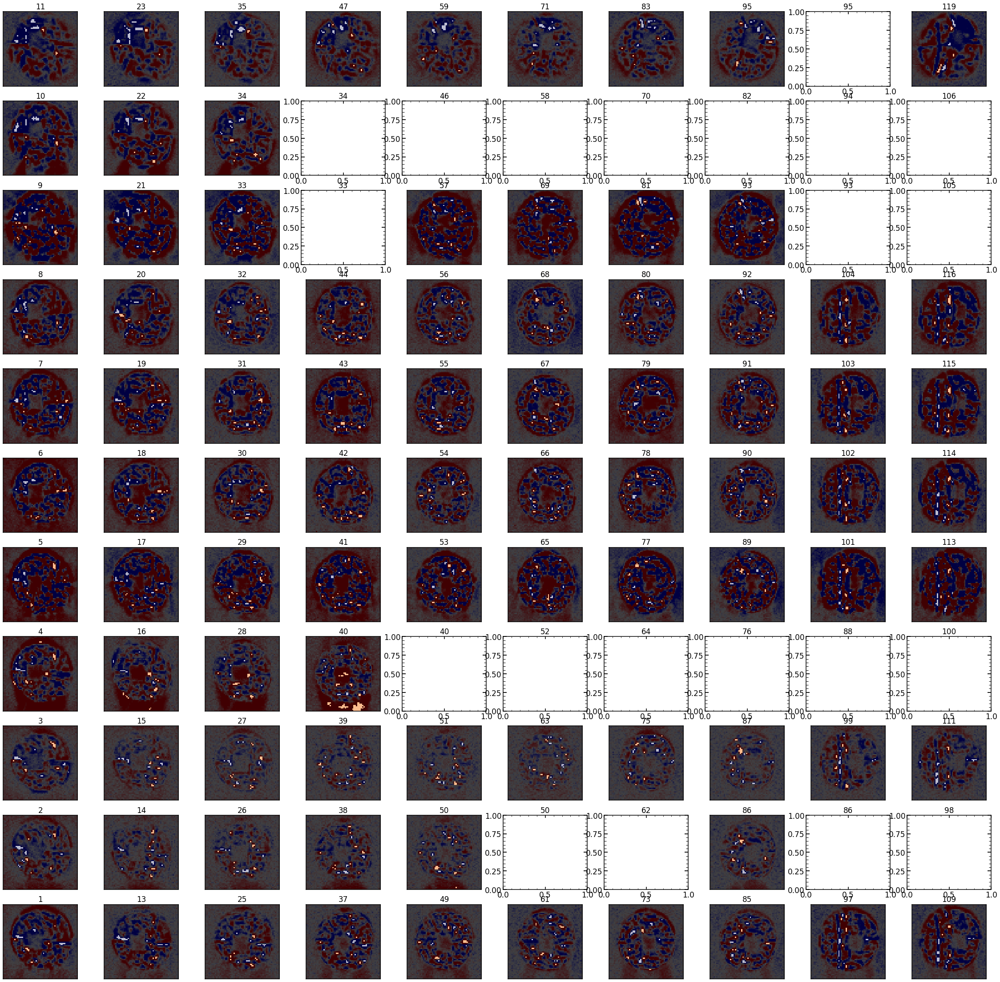

In [150]:
plt.figure(figsize=(40,40))

plt.tick_params(
axis='both',          # changes apply to the x-axis
which='both',      # both major and minor ticks are affected
bottom='off',
left='off',
right='off',
top='off',         # ticks along the top edge are off
labelbottom='off',
labelleft='off') 

for i in range(1,111):

    plt.subplot(11,10,i)
    plt.title(single_number)


    try:
        single_number=str(finalAr_selection.index.values[i-1])

        single_analysis=Zernike_Analysis(date=date,obs='m4',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                         list_of_defocuses=list_of_defocuses_input_long)

        double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
        list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
        index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
        res_multi=np.load('/Users/nevencaplar/Documents/PFS/Images/Jan2921/Res_multi/res_multi_'+single_number+'_Ar.npy',allow_pickle=True)
        mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                        list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi




        sci_image=list_of_sci_images[index_of_single_image]
        res_iapetus=list_of_single_model_image[index_of_single_image]
        var_image=list_of_var_images[index_of_single_image]

        mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                              np.median(sci_image),np.median(sci_image)])*3

        flux_mask=sci_image>(mean_value_of_background)

        chi2_image=(sci_image-res_iapetus)**2/((1)*var_image)
        mask_most_impactful_pixels=np.zeros(sci_image.shape)
        mask_most_impactful_pixels[chi2_image>(np.quantile(chi2_image[flux_mask].ravel(),0.98))]=1



        plt.imshow((sci_image-res_iapetus)/np.sqrt(var_image),origin='lower',cmap='bwr',vmin=-10,vmax=10)
        
        #plt.imshow(sci_image-res_iapetus,origin='lower',cmap='bwr',vmin=-np.max(np.abs(sci_image))/20,vmax=np.max(np.abs(sci_image))/20)
        plt.imshow(mask_most_impactful_pixels,alpha=0.75,cmap='magma') 
        plt.title(single_number)
        plt.xticks([])
        plt.yticks([])
    except:
        pass


In [ ]:
plt.figure

# Testing FRD code 

In [220]:
from FRDSolverClass import FRDsolver


In [179]:
# run Section 2.1 first (image = 17)

In [192]:
columns=np.array(['z4','z5','z6','z7','z8','z9','z10','z11',
                          'z12','z13','z14','z15','z16','z17','z18','z19','z20','z21','z22', 
              'hscFrac','strutFrac','dxFocal','dyFocal','slitFrac','slitFrac_dy',
              'wide_0','wide_23','wide_43','misalign',
              'x_fiber','y_fiber','effective_ilum_radius','frd_sigma','frd_lorentz_factor','det_vert','slitHolder_frac_dx',
              'grating_lines','scattering_slope','scattering_amplitude',
              'pixel_effect','fiber_r','flux']  )

In [211]:
model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=56,verbosity=0,\
                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,explicit_psf_position=[0,0])  


minchain_original=np.copy(list_of_minchain[index_of_single_image])
frd_sigma_orignal=minchain_original[:len(columns)][columns=='frd_sigma'][0]

res_with_Image=model(minchain_original,return_Image=True)

sci_image_original=list_of_sci_images[index_of_single_image]
var_image_original=list_of_var_images[index_of_single_image]
res_iapetus_original=res_with_Image[1]


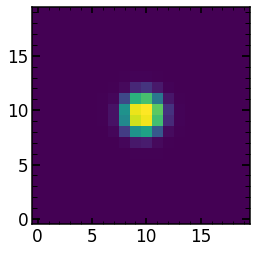

In [212]:
plt.imshow(res_iapetus)

In [238]:
list_of_frd_sigma=[]
for i in np.arange(0.01,0.2,0.015):
    list_of_frd_sigma.append(i)
    
list_of_frd_sigma_test_images=[]    
for i in tqdm(list_of_frd_sigma):    
    minchain_frd_sigma_test=np.copy(minchain_original)   
    minchain_frd_sigma_test[32]=i
    
    res_with_Image=model(minchain_frd_sigma_test,return_Image=True)
    
    res_iapetus_sigma_test=res_with_Image[1]
    
    list_of_frd_sigma_test_images.append(res_iapetus_sigma_test)

100%|███████████████████████████████████████████████████████████████████████████████████████| 13/13 [00:58<00:00,  4.50s/it]


In [239]:
def addnoise(image):
    var_image=image+40 #40 accounts for read noise, but keep in mind that the input images must be scaled properly too...
    artificial_noise_data=np.zeros((var_image.shape[0],var_image.shape[1]))
    for i in range(len(artificial_noise_data)):
        for j in range(len(artificial_noise_data)):
            artificial_noise_data[i][j]=np.random.normal(0,np.sqrt(var_image[i][j]))
    return image+artificial_noise_data

In [240]:
res_iapetus_original_with_noise=addnoise(res_iapetus_original)

In [241]:
knownFRDlist=np.array(list_of_frd_sigma)
imagetosolve=res_iapetus_original_with_noise
imagelist=np.array(list_of_frd_sigma_test_images)

In [242]:
testFRD = FRDsolver(knownFRDlist, imagelist, imagetosolve)

Minimum FRD is 0.07 and within range 0.04 to 0.17500000000000002


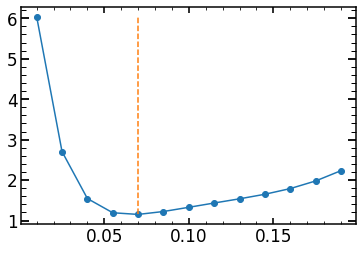

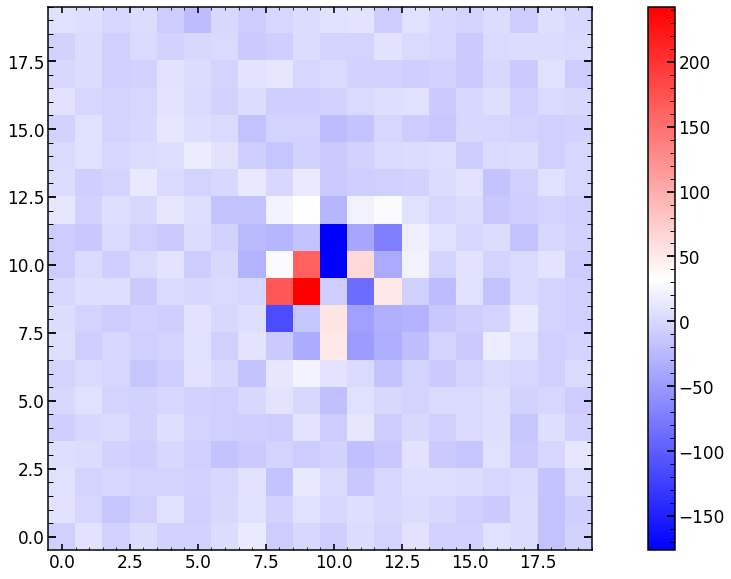

In [243]:
(residuallist, minFRD,uncertaintyrange) = testFRD.find_FRD_compare_positions(knownFRDlist, imagelist, imagetosolve)

plt.plot(knownFRDlist,residuallist,marker='o')
plt.plot([minFRD,minFRD],[np.min(residuallist),np.max(residuallist)],'--')
plt.show()

plt.figure(figsize=(20,10))
plt.imshow(imagetosolve - imagelist[knownFRDlist == minFRD][0],cmap='bwr')
plt.colorbar()
plt.show()

In [237]:
uncertaintyrange

0.10000000000000002

In [248]:
print(f"{np.sin(np.pi/4)=}")

np.sin(np.pi/4)=0.7071067811865475


# Argon, very quick

In [307]:
date='Jan2920'
#obs=34313
#obs_int=int(obs)
single_number='111'
image_index=int(single_number)
eps=6
arc='Ar'
dataset=6

if arc=='Ar':
    obs=34341+96
    finalArc=finalAr
if arc=='Ne':
    obs=34217+96 
    finalArc=finalNe
if arc=='Kr':
    obs=34561+96
    finalArc=finalKr



list_of_defocuses_input_short=['m4','p4']
list_of_defocuses_input_long=['m4','m35','m3','m05','0','p05','p3','p35','p4']

finalArc.loc[int(single_number)]

fiber                   650
xc                     4003
yc                     1229
wavelength        727.47876
close                     1
lamp                     Ar
xc_effective           4072
second_offset             0
second_ratio              0
second2_offset            0
second2_ratio             0
Name: 111, dtype: object

STAMPS_FOLDER: /Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Stamps_cleaned/
labelInput: 0
self.single_number: 111
list_of_defocuses: ['m4', 'm35', 'm3', 'm05', '0', 'p05', 'p3', 'p35', 'p4']
list_of_obs: [34341, 34347, 34353, 34383, 34389, 34395, 34425, 34431, 34437]
<_io.BufferedReader name='/Users/nevencaplar/Documents/PFS/ReducedData/Data_Nov_20_2020/Dataframes/finalHgAr_Feb2020'>
analyzing label: 34389
double_sources_positions_ratios for this spot is: [0 0]


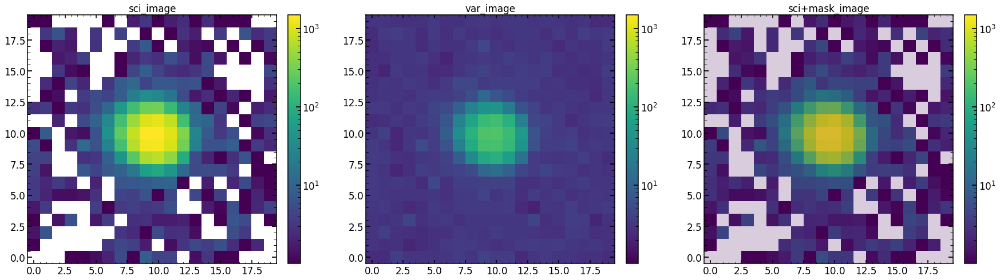

In [308]:
single_analysis=Zernike_Analysis(date=date,obs='0',single_number=single_number,eps=eps,arc=arc,dataset=dataset,multi_var=True,\
                                 list_of_defocuses=list_of_defocuses_input_long)
single_analysis.create_basic_data_image()

In [309]:
double_sources,double_sources_positions_ratios=single_analysis.return_double_sources()
list_of_sci_images,list_of_var_images,list_of_mask_images=single_analysis.return_lists_of_images()
index_of_single_image=single_analysis.return_index_of_single_image_in_list_of_images()
columns,columns22,columns22_analysis=single_analysis.return_columns()

chain0_swarm_1,likechain0_swarm_1=single_analysis.create_chains_swarm_1()
#chain0_Emcee3,likechain0_Emcee3=single_analysis.create_chains_Emcee_2()
len_of_chains=single_analysis.len_of_chains()

minchain_parametrization,like_min=single_analysis.create_likelihood()

Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371116ArSwarm1.npy
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371116ArSwarm1.npy
(36, 480, 129)
Swarm1 and likechainSwarm1 found
Path searched was: /Volumes/Saturn_USA/PFS/TigerAnalysis/ResultsFromTiger/Jan2920/chainJan2920_Single_P_344371116ArSwarm1.npy
(36, 480, 129)
minimal likelihood is: 601.7060024741852
average chi2 reduced is: -0.29793566514654307


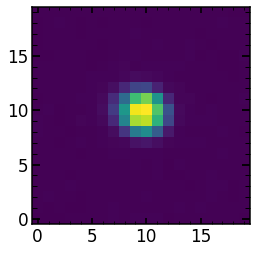

In [310]:
sci_image=list_of_sci_images[4]
plt.imshow(sci_image)

(0.0, 5000.0)

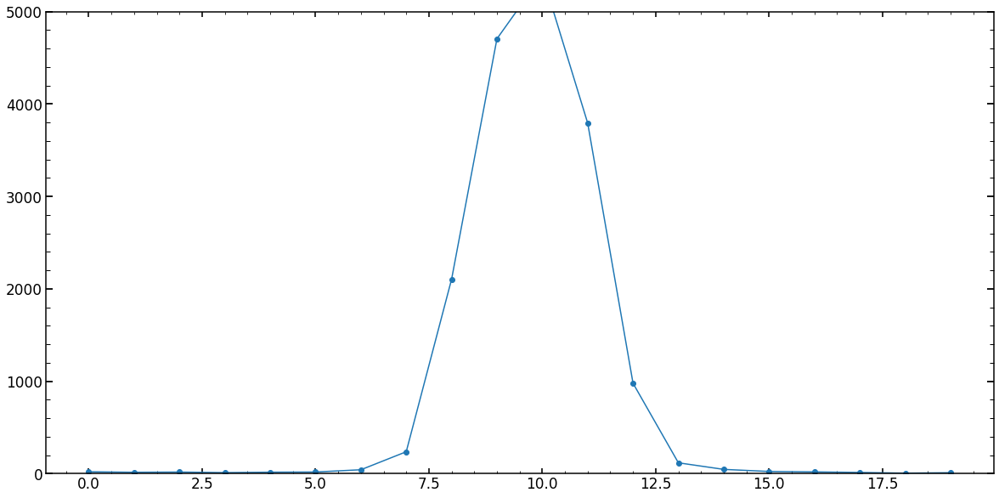

In [311]:
plt.figure(figsize=(20,10))
lsf=np.sum(sci_image[:,7:13],axis=1)
plt.plot(lsf,marker='o')
plt.ylim(0,5000)

In [312]:
model_multi=LN_PFS_multi_same_spot(list_of_sci_images,list_of_var_images,list_of_mask_images=list_of_mask_images,dithering=1,save=1,zmax=56,verbosity=1,\
                      double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,npix=1536,test_run=False)   


list_of_minchain=model_multi.create_list_of_allparameters(minchain_parametrization,list_of_defocuses=list_of_defocuses_input_long,zmax=56)
#list_of_minchain=model_multi.create_list_of_allparameters(gbests_positions[-1],list_of_defocuses=list_of_defocuses_input_long,zmax=56)



res_multi=model_multi(list_of_minchain,return_Images=True)


mean_res_of_multi_same_spot,list_of_single_res,list_of_single_model_image,\
                list_of_single_allparameters,list_of_single_chi_results,array_of_psf_positions_output=res_multi

#model = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],dithering=1,save=1,zmax=22,verbosity=1,\
#                      double_sources=None,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536)  

#res_with_Image=model(list_of_minchain[index_of_single_image],return_Image=True)

################################
analyzing image 1 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 5.539916
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 5.061163
Mask image shape is: (60, 60)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.41e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [   30.85344867     0.45734526    -0.52660807     0.50962551
    -0.9468852      0.15834789    -0.4658427      0.19889832
    -0.0420762      0.13884542     0.01321628     0.1078342
     0.09325274     0.20336678     0.03429303     0.04475992
    -0.05322591     0.03223796     0.1093409      0.667269
     0.0817359      0.16460768    -0.02428313     0.05664528
     0.02776882     0.1    

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077333 -10.3121426 ] / 34.447372
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077335 -10.3121426 ] / 34.447372
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077333 -10.31214261] / 34.447372
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077333 -10.3121426 ] / 34.447372
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-28.424312  -10.3121426] / 28.549477
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.07077333 -10.82774973] / 35.00583
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-28.424312    -9.79653547] / 29.360443
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.77785067  -9.79653547] / 32.2343
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.10108133  -9.92543725] / 29.36313
chi2 within shgo optimization routine (chi_

We are fitting for only one source
One source fitting result is [-28.70298419 -10.43789425]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.8776650428771973
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9923503506242002
Finished with lnlike_Neven
chi_2_almost/d.o.f is 54.524532; chi_2_almost_max_dof is 6991.782 log(improvment) is -2.107996
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 9.111047267913818 seconds
 
###############

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-36.70715589  -2.66696078] / 142.47636
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-27.70715589  15.33303922] / 1008.1201
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-23.20715589 -11.66696078] / 506.3087
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-32.20715589   6.33303922] / 226.3572
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.39465589  -1.54196078] / 31.078506
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.3946559   -1.54196078] / 31.0785
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-29.39465589  -1.5419608 ] / 31.0785
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-38.39465589 -19.54196078] / 1078.6621
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.48170055  -9.7160501 ] / 219.01062
chi2 within shgo optimization routine (chi_

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73343739  -1.57063697] / 25.605675
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73331769  -1.57053901] / 25.605673
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73273776  -1.57099   ] / 25.60568
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.7333004   -1.57040916] / 25.605677
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73311286  -1.57060278] / 25.605673
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73340282  -1.57037728] / 25.605675
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73302773  -1.57076451] / 25.605679
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73330905  -1.57047409] / 25.605675
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-30.73321527  -1.57057089] / 25.605675
chi2 within shgo optimization routine 

creating wf_full_fake_0
Time for wavefront and wavefront/pupil combining is 0.0005922317504882812
type(expwf_grid)<class 'numpy.complex64'>
Time for FFT is 0.4121260643005371
type(img_apod)<class 'numpy.float32'>
Finished with _getOptPsf_naturalResolution
 
 
Entering optPsf_postprocessing
optPsf.shape: (3072, 3072)
oversampling_original: 35.374287997579025
size_of_central_cut: 1980
optPsf_cut.shape(1981, 1981)
oversampling:9.0
optPsf_cut.shape[0]1981
size_of_optPsf_cut_downsampled: 504.0
optPsf_cut_downsampled.shape: (505, 505)
size_of_optPsf_cut_in_Microns: 841.6666666666667
postprocessing parameters:
['grating_lines', 'scattering_slope', 'scattering_amplitude', 'pixel_effect', 'fiber_r']
[88727.59630932864, 2.2143796117400574, 0.0024644148912532264, 0.38325514242593006, 1.8057147899410229]
type(pointsx): <class 'numpy.float32'>
optPsf_cut_downsampled_scattered.shape:(505, 505)
simulation_00 parameter:None
are we invoking double sources (1 or True if yes): False
double source positio

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.18135648 -10.44008733] / 22.159264
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.15648756 -10.61976184] / 22.21542
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.31191831 -10.51894448] / 22.238943
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.24042017 -10.52443453] / 22.175014
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.26528909 -10.34476002] / 22.275898
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.18368794 -10.55101139] / 22.164557
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.12462426 -10.46666419] / 22.158941
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.0667263  -10.43777901] / 22.200108
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-33.1222928  -10.35574013] / 22.219229
chi2 within shgo optimization routine 

Time to apodize the pupil: 0.2915668487548828
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.6554408073425293
Time for pupil and illumination calculation is 0.6639378070831299

Starting creation of wavefront
diam_sic: 0.1395327
aberrations: [0.0, 0, 0.0, 0.0, 4.34781351390343, -0.35887444824367354, -0.248685957934914, 0.43260518937030074, -1.0419617443388947, 0.13054545784261024, -0.36366051022858814, -0.04280526477259451, -0.15590270853783805, 0.09798861298886026, 0.014229781367881795, 0.028756652299861515, -0.04932068105637284, 0.07325735367982969, -0.018893964161872424, 0.02170519796866855, -0.02155610495132118, 0.009234565132697152, 0.006570075331227807, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
aberrations moved to z4=0: [0.0, 0.0, 0.0, 0.0, 0, -0.35887444824367354, -0.248685957934914, 0.43260518937

We are fitting for only one source
One source fitting result is [-9.22944619 -1.54289546]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.2776148319244385
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.995425478992994
Finished with lnlike_Neven
chi_2_almost/d.o.f is 6.1949806; chi_2_almost_max_dof is 3424.3958 log(improvment) is -2.742544
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 7.201497793197632 seconds
 
#################

We are fitting for only one source
One source fitting result is [-2.98133385 -1.42762462]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 0.25249505043029785
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9904936132458567
Finished with lnlike_Neven
chi_2_almost/d.o.f is 4.889926; chi_2_almost_max_dof is 1711.1586 log(improvment) is -2.543988
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 7.370510816574097 seconds
 
################

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69688351] / 2.8508806
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.6972697 ] / 2.8511126
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69746649] / 2.8512316
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69756678] / 2.8512914
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69761788] / 2.8513227
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69764392] / 2.8513381
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69765719] / 2.8513467
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69766396] / 2.8513508
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-5.48304759  7.69766741] / 2.8513532
chi2 within shgo optimization routine (chi_2_almost_mul

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9992844187369281
Finished with lnlike_Neven
chi_2_almost/d.o.f is 3.385803; chi_2_almost_max_dof is 2214.2134 log(improvment) is -2.8155577
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 6.0205748081207275 seconds
 
################################
analyzing image 7 out of 9
 
Science image shape is: (50, 50)
Top left pixel value of the science image is: 3.072083
Variance image shape is: (50, 50)
Top left pixel value of the variance image is: 4.0011964
Mask image shape is: (50, 50)
Sum of mask ima

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-19.17000451   3.03770184] / 60.89838
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-18.21668095   5.89767252] / 17.581171
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.83660709   7.03789411] / 11.699055
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.6613106    7.56378357] / 11.121195
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.57521138   7.82208123] / 11.323457
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.53163793   7.95280157] / 11.547715
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.50925248   8.01995793] / 11.695438
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.49766157   8.05473066] / 11.7812605
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-17.49163368   8.07281432] / 11.828187
chi2 within shgo optimization routine

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9958981101626647
Finished with lnlike_Neven
chi_2_almost/d.o.f is 21.26662; chi_2_almost_max_dof is 5694.293 log(improvment) is -2.4277413
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 6.949966907501221 seconds
 
################################
analyzing image 8 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.0669432
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 3.9889638
Mask image shape is: (60, 60)
Sum of mask imag

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.34007561  17.23680449] / 13.696274
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-10.80007201  18.09864472] / 17.414223
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.34007561  16.37496427] / 13.659485
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.61007741  15.51312404] / 16.089472
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.88007921  16.37496427] / 13.5359535
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-12.42008281  15.94404416] / 15.380833
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.88007921  15.51312404] / 16.11755
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-11.47507651  16.80588438] / 13.222387
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-12.01508011  16.80588438] / 13.402522
chi2 within shgo optimization routine

Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9940972344654534
Finished with lnlike_Neven
chi_2_almost/d.o.f is 28.612812; chi_2_almost_max_dof is 5771.3247 log(improvment) is -2.304715
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 8.170408248901367 seconds
 
################################
analyzing image 9 out of 9
 
Science image shape is: (60, 60)
Top left pixel value of the science image is: 1.1692705
Variance image shape is: (60, 60)
Top left pixel value of the variance image is: 4.311477
Mask image shape is: (60, 60)
Sum of mask imag

chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.1649122    8.18475885] / 25.364605
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.82315781   8.18475885] / 23.142488
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.1649122    8.59399679] / 27.023026
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-13.82315781   7.77552091] / 22.114027
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.15228062   7.36628296] / 21.257668
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.81052623   7.36628296] / 21.539934
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-15.13964903   6.54780708] / 23.523455
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.15228062   7.77552091] / 21.624895
chi2 within shgo optimization routine (chi_2_almost_multi_values): [-14.81052623   6.95704502] / 21.804619
chi2 within shgo optimization routine

We are fitting for only one source
One source fitting result is [-14.37563523   7.34045496]
type(complete_realization_renormalized)<class 'numpy.float32'>
Time for single_Psf_position protocol is 1.3757996559143066
Sucesfully created optPsf_cut_fiber_convolved_downsampled
Finished with optPsf_postprocessing
 
Internally fitting for flux; disregarding passed value for flux
Internally fitting for flux; multiplying all values in the model by 0.9928003200534306
Finished with lnlike_Neven
chi_2_almost/d.o.f is 41.752296; chi_2_almost_max_dof is 6822.184 log(improvment) is -2.213243
multiprocessing.current_process() <_MainProcess name='MainProcess' parent=None started> thread 4556363200
uname_result(system='Darwin', node='IapetusUSA', release='18.7.0', version='Darwin Kernel Version 18.7.0: Tue Aug 20 16:57:14 PDT 2019; root:xnu-4903.271.2~2/RELEASE_X86_64', machine='x86_64', processor='i386')
Time for lnlike_Neven function in thread 4556363200 is: 8.481223106384277 seconds
 
###############

In [313]:
list_of_var_images_via_model=[]
for index_of_single_image in range(len(list_of_sci_images)):
    single_var_image_via_model=create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])
    
    list_of_var_images_via_model.append(single_var_image_via_model)

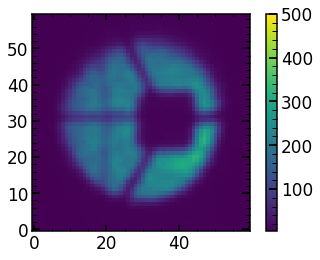

In [314]:
plt.imshow(list_of_var_images_via_model[0],vmax=500)
plt.colorbar()

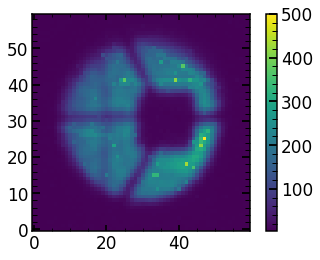

In [315]:
plt.imshow(list_of_var_images[0],vmax=500)
plt.colorbar()

In [316]:
array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result
quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)




list_of_var_sums=[]
for i in range(9):
    var_image_masked=list_of_var_images[i]
    sci_image=list_of_sci_images[i]
    

    mean_value_of_background=np.mean([np.median(sci_image),np.median(sci_image),\
                      np.median(sci_image),np.median(sci_image)])*3
            
    #flux_mask=sci_image>(mean_value_of_background)
    #var_image_masked=var_image[flux_mask]
    
    var_image_masked_without_nan = var_image_masked.ravel()[var_image_masked.ravel()>quantile_08_focus]
    print('number of pixels considering in image '+str(i)+': '+str(var_image_masked_without_nan.shape[0]))
    var_sum=-(1/2)*(np.sum(np.log(2*np.pi*var_image_masked_without_nan)))
    list_of_var_sums.append(var_sum)
    
array_of_var_sum=np.array(list_of_var_sums)
max_of_array_of_var_sum=np.max(array_of_var_sum)
print(array_of_var_sum)
renormalization_of_var_sum=array_of_var_sum/max_of_array_of_var_sum

renormalization_of_var_sum

array_of_var_sum=np.array(list(map(np.sum,list_of_var_images)))
index_of_max_var_sum=np.where(array_of_var_sum==np.min(array_of_var_sum))[0][0]
# find what variance selectes top 20% of pixels
# this is done to weight more the images in focus and less the image out of focus in the 
# final likelihood result

quantile_08_focus=np.quantile(list_of_sci_images[index_of_max_var_sum],0.8)
'model pixels with a flux larger than?: '+str(quantile_08_focus)

number of pixels considering in image 0: 2304
number of pixels considering in image 1: 1732
number of pixels considering in image 2: 1242
number of pixels considering in image 3: 100
number of pixels considering in image 4: 40
number of pixels considering in image 5: 71
number of pixels considering in image 6: 1171
number of pixels considering in image 7: 1597
number of pixels considering in image 8: 2198
[-6634.08300781 -5042.66015625 -3687.96826172  -280.73995972
  -106.93131256  -191.23396301 -3401.40551758 -4627.16601562
 -6252.35058594]


'model pixels with a flux larger than?: 6.144405937194825'

mean reported value:-600.5364785545372
array_of_single_res: [-50707.1875     -31062.65234375 -13336.48925781  -1071.09716797
   -827.86456299   -849.02362061 -16184.13964844 -27510.1484375
 -40170.15234375]
renormalization factors: [62.04060204 47.15793752 34.48913301  2.6254233   1.          1.78838133
 31.8092562  43.27232038 58.47071766]


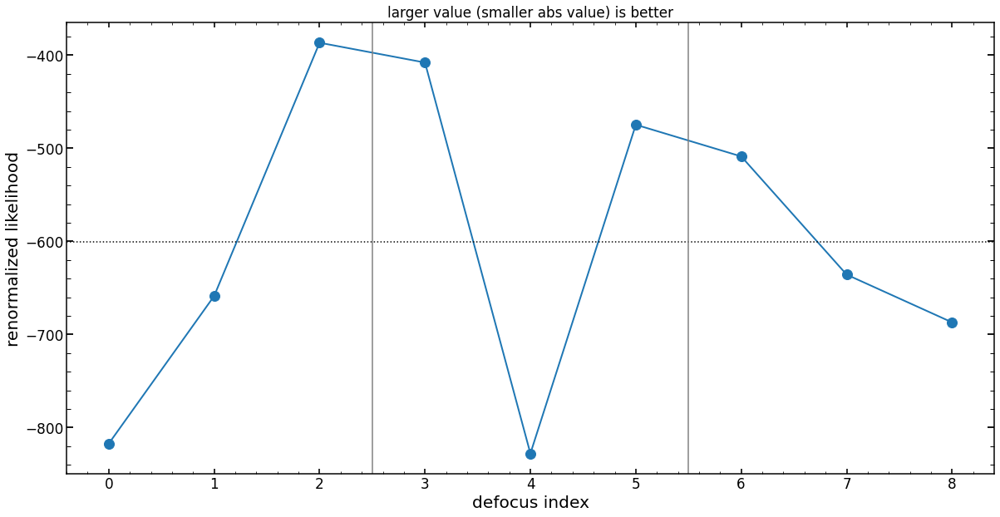

In [317]:
# shows the reported likelihood for each image, after division by the renormalization factor
# smaller absolute values is better
# dotted lien shows the mean reported value

plt.figure(figsize=(20,10))
array_of_single_res=np.array(list_of_single_res)

mean_res_of_multi_same_spot=np.mean(array_of_single_res/renormalization_of_var_sum)
print('mean reported value:'+str(mean_res_of_multi_same_spot))
print('array_of_single_res: '+str(array_of_single_res))
print('renormalization factors: '+str(renormalization_of_var_sum))
plt.plot(array_of_single_res/renormalization_of_var_sum,marker='o',lw=2,ms=12)
plt.xlabel('defocus index')
plt.ylabel('renormalized likelihood')
plt.axhline(mean_res_of_multi_same_spot,color='black',ls=":")
plt.axvline(2.5,color='gray')
plt.title('larger value (smaller abs value) is better')
plt.axvline(5.5,color='gray')

In [318]:
"""
-1380.846598202445
array_of_single_res: [-84607.3046875  -41977.2734375  -16216.77636719  -5851.328125
  -2012.60107422  -3942.59765625 -27768.34375    -44224.47265625
 -60664.78125   ]
renormalization factors: [59.84005376 46.86738    34.71011492  2.42838506  1.          1.89298036
 30.3651004  40.85605092 52.79647879]
 """

'\n-1380.846598202445\narray_of_single_res: [-84607.3046875  -41977.2734375  -16216.77636719  -5851.328125\n  -2012.60107422  -3942.59765625 -27768.34375    -44224.47265625\n -60664.78125   ]\nrenormalization factors: [59.84005376 46.86738    34.71011492  2.42838506  1.          1.89298036\n 30.3651004  40.85605092 52.79647879]\n '

In [319]:
minchain=list_of_minchain[4]

print('minchain.shape '+str(minchain.shape))

    
dfz11 = pd.DataFrame(np.array([np.array([minchain])[0][0:8]]),columns=columns22[0:8])
print(dfz11)
print('##############################################')
dfz22 = pd.DataFrame(np.array([np.array([minchain])[0][8:19]]),columns=columns22[8:19])
print(dfz22)

print('')
#dfglobal = pd.DataFrame(np.array([np.array([minchain])[0][19:len(columns)]]),columns=columns[19:])
print('##############################################')
dfglobal1 = pd.DataFrame(np.array([np.array([minchain])[0][19:19+6]]),columns=columns22[19:19+6])
print(dfglobal1)
print('##############################################')
dfglobal2 = pd.DataFrame(np.array([np.array([minchain])[0][25:25+4]]),columns=columns22[25:25+4])
print(dfglobal2)
print('##############################################')
dfglobal3 = pd.DataFrame(np.array([np.array([minchain])[0][29:29+5]]),columns=columns22[29:29+5])
print(dfglobal3)
print('##############################################')
dfglobal4 = pd.DataFrame(np.array([np.array([minchain])[0][34:41]]),columns=columns22[34:41])
print(dfglobal4)

minchain.shape (76,)
         z4        z5        z6        z7        z8        z9       z10  \
0  0.561294 -0.475477 -0.208983  0.421602 -1.055544  0.126574 -0.349063   

        z11  
0 -0.077334  
##############################################
        z12       z13       z14      z15       z16      z17       z18  \
0 -0.172164  0.092152  0.014375  0.01746 -0.069688  0.05467 -0.026492   

        z19       z20       z21       z22  
0  0.018412 -0.017032  0.005948 -0.008111  

##############################################
    hscFrac  strutFrac   dxFocal   dyFocal  slitFrac  slitFrac_dy
0  0.667269   0.081736  0.164608 -0.024283  0.056645     0.027769
##############################################
   wide_0  wide_23  wide_43  misalign
0     0.1      0.1      0.1       1.0
##############################################
    x_fiber   y_fiber  effective_radius_illumination  frd_sigma  \
0 -0.061825 -0.066514                        0.90065   0.025772   

   frd_lorentz_factor  
0        

(-2.8, -1.5)

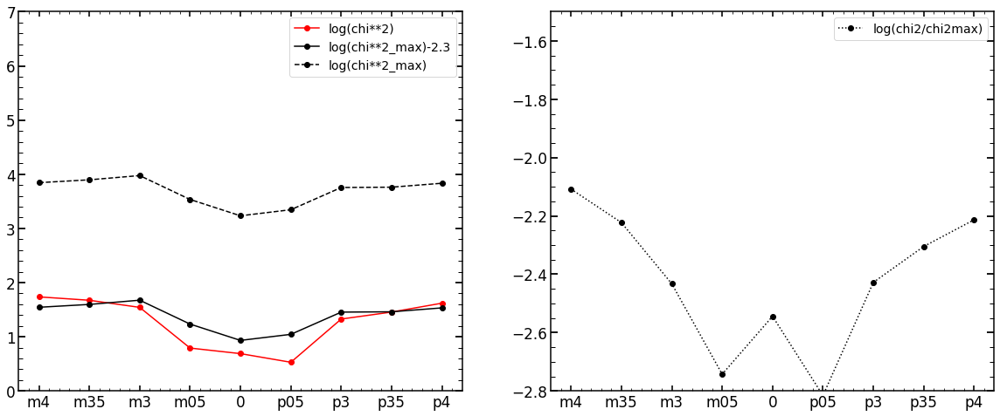

In [320]:
chi_results_array=np.array(res_multi[4])

plt.figure(figsize=(20,8))

plt.subplot(121)

plt.plot(np.log10(chi_results_array[:,2]),color='red',label='log(chi**2)',marker='o')
plt.plot(np.log10(chi_results_array[:,3])-2.3,color='black',label='log(chi**2_max)-2.3',marker='o')
plt.plot(np.log10(chi_results_array[:,3]),color='black',label='log(chi**2_max)',marker='o',ls='--')
plt.ylim(0,7)
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.legend()
plt.subplot(122)

plt.plot(np.log10(chi_results_array[:,2]/chi_results_array[:,3]),color='black',label='log(chi2/chi2max)',marker='o',ls=':')
plt.legend()
plt.xticks(np.arange(0,len(list_of_defocuses_input_long),1),list_of_defocuses_input_long)
plt.ylim(-2.8,-1.5)

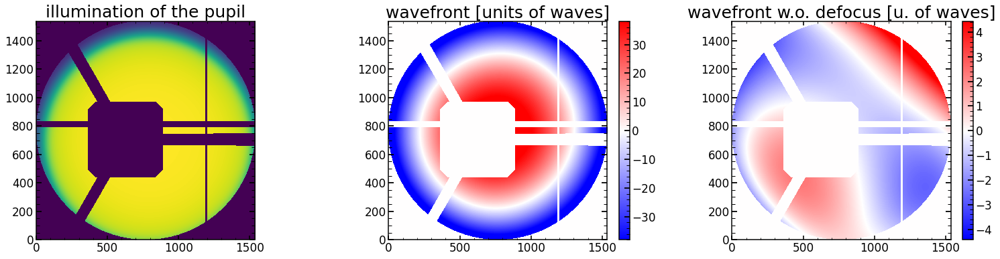

In [291]:
single_analysis.illumination_wavefront_plot()

In [337]:
minchain[:len(columns22)][np.array(columns22)=='frd_sigma']

array([0.02577162])

In [338]:
minchain[:len(columns22)][np.array(columns22)=='hscFrac']

array([0.667269])

Science image shape is: (20, 20)
Top left pixel value of the science image is: -3.3105633
Variance image shape is: (20, 20)
Top left pixel value of the variance image is: 2.4913008
Mask image shape is: (20, 20)
Sum of mask image is: 0
Dithering value is: 1

supplied extra Zernike parameters (beyond zmax): None
np.__version__1.18.5
skimage.__version__0.17.2
scipy.__version__1.5.0
Zernike_Module.__version__0.41e
 
Initializing ZernikeFitter_PFS
Verbosity parameter is: 1
Highest Zernike polynomial is (zmax): 56

Entering lnlike_Neven
allparameters [    0.56129421    -0.47547726    -0.2089828      0.42160229
    -1.05554411     0.12657368    -0.34906305    -0.07733435
    -0.17216364     0.09215193     0.01437457     0.01745986
    -0.06968831     0.05467029    -0.02649211     0.01841167
    -0.01703185     0.00594837    -0.00811147     0.667269
     0.0817359      0.16460768    -0.02428313     0.05664528
     0.02776882     0.1            0.1            0.1
     1.            -0.06182505 

time misalign 0.04771089553833008
Time for cutting out the square is 0.007195711135864258
Time for cutting out the square is 0.019453048706054688
Finished with getPupil
Finished with _get_Pupil
Requested pupil size is (pupil.size) [m]: 0.1395327
One pixel has size of (pupil.scale) [m]: 9.08416015625e-05
Requested pupil has so many pixels (pupil_plane_im): (1536, 1536)
Time for _get_Pupil function is 0.6002953052520752
lower_limit_of_ilum: 768
higher_limit_of_ilum: 2304
Size after padding zeros to 2x size and extra padding to get size suitable for FFT: (3072, 3072)
size_of_ilum_in_units_of_radius: 2.0
radiometric parameters are: 
x_ilum,y_ilum,radiometricEffect,radiometricExponent[1, 1, 0, 0.25]
skiping ``radiometric effect'' 
Time to apodize the pupil: 0.13716721534729004
type(ilum_radiometric_apodized)<class 'numpy.float32'>
Time for postprocessing pupil after _get_Pupil 0.3000812530517578
Time for pupil and illumination calculation is 0.9014220237731934

Starting creation of wavefron

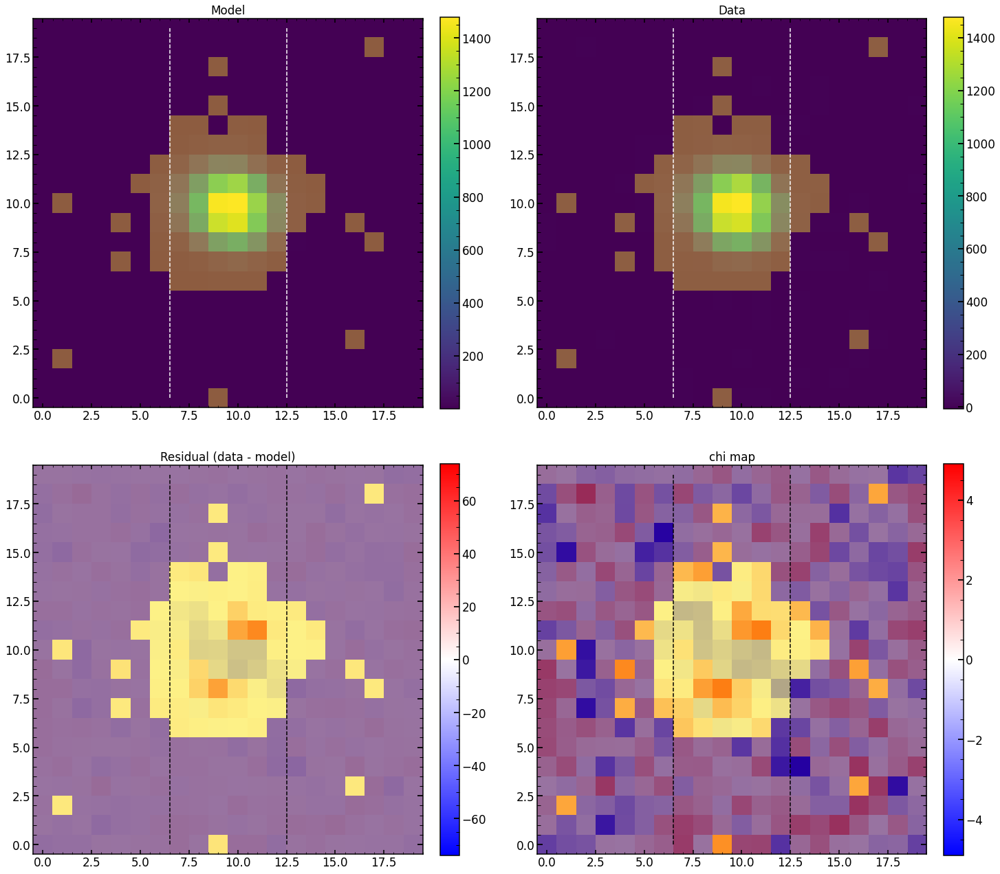

In [342]:
index_of_single_image=4

#
model_single_image = LN_PFS_single(list_of_sci_images[index_of_single_image],list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image],\
                                   dithering=1,save=0,zmax=56,verbosity=1,\
                                   double_sources=double_sources,double_sources_positions_ratios=double_sources_positions_ratios,fit_for_flux=True,npix=1536,explicit_psf_position=[0,0])

custom_var=model_single_image.create_custom_var(modelImg=list_of_single_model_image[index_of_single_image],sci_image=list_of_sci_images[index_of_single_image],
                                    var_image=list_of_var_images[index_of_single_image],mask_image=list_of_mask_images[index_of_single_image])


minchain_test=np.copy(minchain)
minchain_test[:len(columns22)][np.array(columns22)=='frd_sigma']=0.25


res=model_single_image(minchain,return_Image=True)
res_test=model_single_image(minchain_test,return_Image=True)


matplotlib.rcParams.update({'font.size': 14})
single_analysis.create_basic_comparison_plot(custom_model_image=list_of_single_model_image[index_of_single_image],custom_mask=list_of_mask_images[index_of_single_image],\
                                             custom_sci_image=list_of_sci_images[index_of_single_image],custom_var_image=list_of_var_images[index_of_single_image],\
                                             show_flux_mask=True,use_max_chi_scaling=True,use_max_flux_scaling=False,show_impact_pixels_mask=False)


In [347]:
find_centroid_of_flux(res[1][5:15,5:15])

(4.303984671326256, 4.633060672974152)

In [346]:
find_centroid_of_flux(res_test[1][5:15,5:15])

(4.247870566365345, 4.678789436337698)

In [368]:
np.log10(2)

0.3010299956639812

In [518]:
pupil_illuminated0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Test/pupil_illuminated0.03323651947473037_1_0.npy')

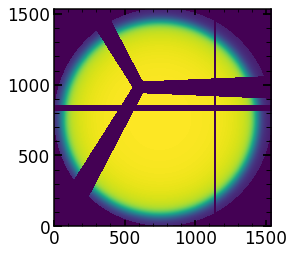

In [519]:
plt.imshow(pupil_illuminated0)

In [524]:
pupil_illuminated0=np.load('/Users/nevencaplar/Documents/PFS/TigerAnalysis/Test/pupil_illuminated-0.015080353984103227_0.01899902572893377_0.8.npy')

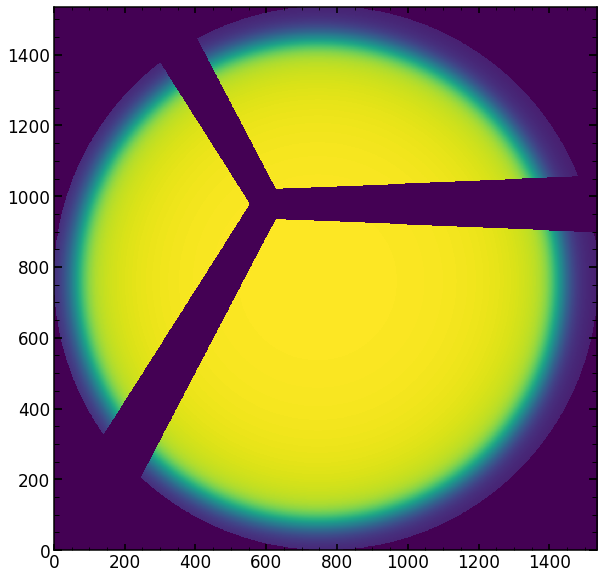

In [527]:
plt.figure(figsize=(20,10))
plt.imshow(pupil_illuminated0)